# AutoFL Sequence Pattern Analysis - N-grams

Analyze N-gram subsequences in messages from AutoFL trajectory data

In [1]:
import json
import os
import random
from collections import Counter
from pathlib import Path
from typing import List, Tuple
import pandas as pd

from scipy.stats import pointbiserialr

In [2]:
def extract_function_call_sequence(messages: List[dict]) -> List[str]:
    """
    Extract the sequence of roles from messages.

    Args:
        messages: List of message dictionaries

    Returns:
        List of role strings in order
    """
    sequence = []
    for i, msg in enumerate(messages):
        if 'function_call' in msg:
            function_call = (msg['function_call']['name'])
            if i+1 < len(messages):
                if messages[i+1]["role"] == "function":
                    if "error_message" not in messages[i+1]["content"] and "required positional argument" not in messages[i+1]["content"]:
                        function_call += "_pass"
                    else:
                        function_call += "_fail"
            else:
                function_call += "_fail"
            sequence.append(function_call)

    return sequence


def get_ngrams(sequence: List[str], n: int) -> List[Tuple[str, str, str, str]]:
    """
    Extract all n-grams from a sequence.

    Args:
        sequence: List of items

    Returns:
        List of n-gram tuples
    """
    ngrams = []
    for i in range(len(sequence) - (n-1)):
        ngram = tuple(sequence[i:i+n])
        ngrams.append(ngram)
    return ngrams

def get_result_of_execution(buggy_methods):
    if isinstance(buggy_methods, str):
        is_found = False
    else:
        is_found = False
        for method, found_result in buggy_methods.items():
            if found_result["is_found"]:
                is_found = True
    
    return is_found


def get_ngrams_for_blanced_executions_in_directory(directory_path: Path, n: int) -> List[Tuple[str, str, str, str]]:
    """
    Process all JSON files in a directory and extract n-grams.

    Args:
        directory_path: Path to directory containing JSON files

    Returns:
        List of all n-grams found
    """
    all_ngrams = []
    success_ngrams = []
    fail_ngrams = []

    success_bug_names = []
    fail_bug_names = []

    for json_file in os.listdir(directory_path):
        bug_name = "-".join(json_file.split('-')[1:]).split('.')[0]
        with open(os.path.join(directory_path, json_file), 'r', encoding='utf-8') as f:
            data = json.load(f)
        execution_success = get_result_of_execution(data["buggy_methods"])
        if execution_success:
            success_bug_names.append(bug_name)
        else:
            fail_bug_names.append(bug_name)
    
    if len(success_bug_names) > len(fail_bug_names):
        raise Exception("The number of succeed bugs > failed bugs")
    
    random.seed(42)
    sampled_fail_bug_names = random.sample(fail_bug_names, len(success_bug_names))

    for bug_name in sampled_fail_bug_names:
        json_file = os.path.join(directory_path, f'XFL-{bug_name}.json')
        with open(json_file, 'r') as f:
            data = json.load(f)
        if 'messages' in data:
            sequence = extract_function_call_sequence(data['messages'])
            ngrams = get_ngrams(sequence, n)
            all_ngrams.extend(ngrams)
            fail_ngrams.extend(ngrams)

    for bug_name in success_bug_names:
        json_file = os.path.join(directory_path, f'XFL-{bug_name}.json')
        with open(json_file, 'r') as f:
            data = json.load(f)
        if 'messages' in data:
            sequence = extract_function_call_sequence(data['messages'])

            ngrams = get_ngrams(sequence, n)
            all_ngrams.extend(ngrams)
            success_ngrams.extend(ngrams)

    return all_ngrams, success_ngrams, fail_ngrams

In [3]:
def get_ngrams_for_executions(benchmark, model, n):
    # Process all directories
    base_path = Path("raw_data/autofl")

    all_ngrams = []
    all_success_ngrams = []
    all_fail_ngrams = []

    for i in range(1, 11):
        if benchmark == 'bip':
            dir_name = f"bip_cosmosfl_{i}"
        elif benchmark == 'd4j':
            dir_name = f"d4j_autofl_eol_{i}"
            
        model_path = base_path / dir_name / model

        if model_path.exists():
            # print(f"Processing {dir_name}...")
            ngrams, success_ngrams, fail_ngrams = get_ngrams_for_blanced_executions_in_directory(model_path, n)
            all_ngrams.extend(ngrams)
            all_success_ngrams.extend(success_ngrams)
            all_fail_ngrams.extend(fail_ngrams)
            # print(f"  Found {len(four_grams)} {n}-grams")
        else:
            print(f"Warning: {model_path} does not exist")

    print(f"\nTotal {n}-grams collected: {len(all_ngrams)}")
    print(f"\nTotal {n}-grams from successful executions: {len(all_success_ngrams)}")
    print(f"\nTotal {n}-grams from failed executions: {len(all_fail_ngrams)}")

    return all_ngrams, all_success_ngrams, all_fail_ngrams

### 5-gram

In [22]:
# Get n-gram: frequencies for all benchmarks and models
n = 5
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    for model in models:
        all_ngrams, all_success_ngrams, all_fail_ngrams = get_ngrams_for_executions(bm, model, n)

        all_counter = Counter(all_ngrams)
        success_counter = Counter(all_success_ngrams)
        fail_counter = Counter(all_fail_ngrams)

        all_results = []
        success_results = []
        fail_results = []
        for ngram, count in all_counter.most_common():
            all_results.append({
                f'{n}gram': ngram,
                'frequency': count
            })
        for ngram, count in success_counter.most_common():
            success_results.append({
                f'{n}gram': ngram,
                'frequency': count
            })
        for ngram, count in fail_counter.most_common():
            fail_results.append({
                f'{n}gram': ngram,
                'frequency': count
            })
            
        
        all_df = pd.DataFrame(all_results)
        success_df = pd.DataFrame(success_results)
        fail_df = pd.DataFrame(fail_results)

        output_dir = f"./{n}gram_frequency/autofl/all_executions"
        os.makedirs(output_dir, exist_ok=True)
        output_file = os.path.join(output_dir, f"{bm}_{model}_{n}gram_frequencies_call_ok.csv")
        all_df.to_csv(output_file, index=False)
        print(f"Saved {output_file} with {len(all_df)} unique {n}-gram")

        output_dir = f"./{n}gram_frequency/autofl/success_executions"
        os.makedirs(output_dir, exist_ok=True)
        output_file = os.path.join(output_dir, f"{bm}_{model}_{n}gram_frequencies_call_ok.csv")
        success_df.to_csv(output_file, index=False)
        print(f"Saved {output_file} with {len(success_df)} unique {n}-gram")

        output_dir = f"./{n}gram_frequency/autofl/fail_executions"
        os.makedirs(output_dir, exist_ok=True)
        output_file = os.path.join(output_dir, f"{bm}_{model}_{n}gram_frequencies_call_ok.csv")
        fail_df.to_csv(output_file, index=False)
        print(f"Saved {output_file} with {len(fail_df)} unique {n}-gram")





Total 5-grams collected: 879

Total 5-grams from successful executions: 518

Total 5-grams from failed executions: 361
Saved ./5gram_frequency/autofl/all_executions/d4j_llama3_5gram_frequencies_call_ok.csv with 383 unique 5-gram
Saved ./5gram_frequency/autofl/success_executions/d4j_llama3_5gram_frequencies_call_ok.csv with 241 unique 5-gram
Saved ./5gram_frequency/autofl/fail_executions/d4j_llama3_5gram_frequencies_call_ok.csv with 221 unique 5-gram

Total 5-grams collected: 2705

Total 5-grams from successful executions: 1086

Total 5-grams from failed executions: 1619
Saved ./5gram_frequency/autofl/all_executions/d4j_llama3.1_5gram_frequencies_call_ok.csv with 941 unique 5-gram
Saved ./5gram_frequency/autofl/success_executions/d4j_llama3.1_5gram_frequencies_call_ok.csv with 447 unique 5-gram
Saved ./5gram_frequency/autofl/fail_executions/d4j_llama3.1_5gram_frequencies_call_ok.csv with 680 unique 5-gram

Total 5-grams collected: 367

Total 5-grams from successful executions: 167

Tot


Benchmark: d4j | Model: llama3


Total 5-grams collected: 879

Total 5-grams from successful executions: 518

Total 5-grams from failed executions: 361
                                                                     pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
   class_pass -> method_pass -> snippet_fail -> snippet_fail -> snippet_fail              44                  32               12         72.7%      27.3%
      class_pass -> method_fail -> method_fail -> method_fail -> method_fail              25                   9               16         36.0%      64.0%
   class_pass -> method_pass -> snippet_pass -> comment_pass -> snippet_pass              24                  21                3         87.5%      12.5%
    class_pass -> method_pass -> snippet_fail -> method_pass -> snippet_fail              22                  13                9         59.1%      40.9%
 method_pass -> snippet_fail -> snippet_fail -> snippet_fail -> comment_

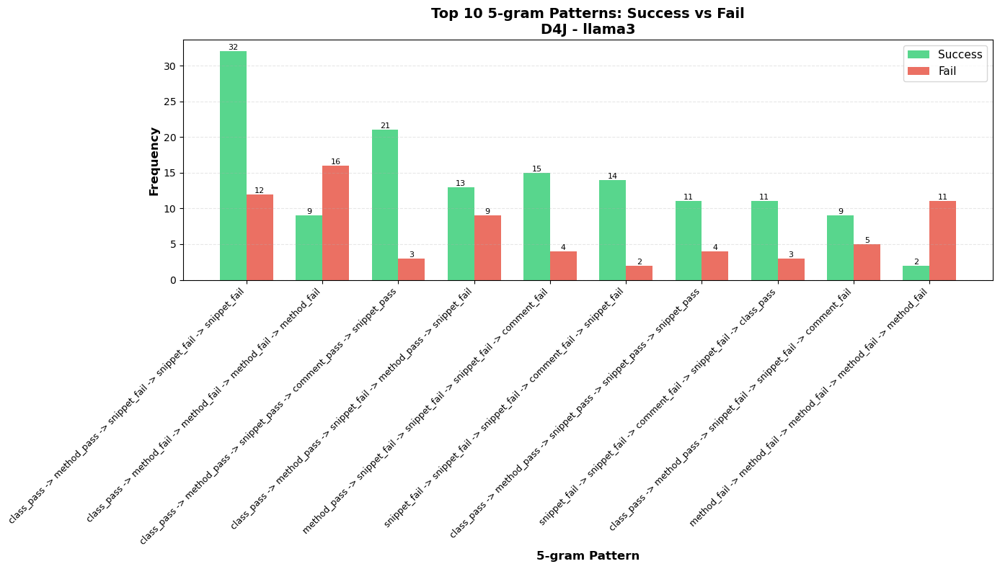


Benchmark: d4j | Model: llama3.1


Total 5-grams collected: 2705

Total 5-grams from successful executions: 1086

Total 5-grams from failed executions: 1619
                                                                     pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
snippet_fail -> snippet_fail -> snippet_fail -> snippet_fail -> snippet_fail             120                  53               67         44.2%      55.8%
   class_pass -> method_pass -> snippet_fail -> snippet_fail -> snippet_fail              98                  58               40         59.2%      40.8%
 method_pass -> snippet_fail -> snippet_fail -> snippet_fail -> snippet_fail              72                  37               35         51.4%      48.6%
snippet_fail -> snippet_fail -> snippet_fail -> comment_fail -> snippet_fail              53                  29               24         54.7%      45.3%
       class_pass -> method_fail -> method_fail -> method_fail -> c

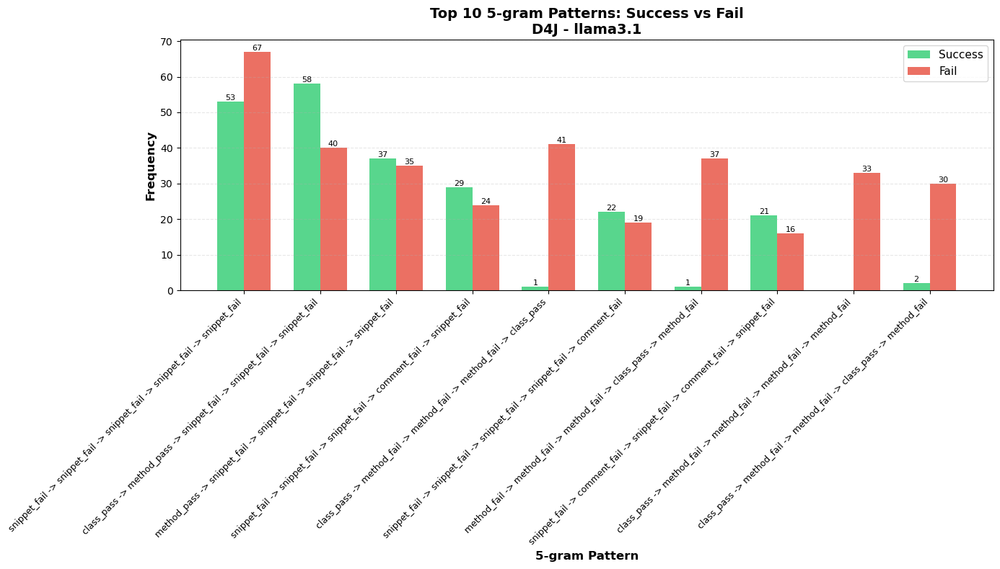


Benchmark: d4j | Model: mistral-nemo


Total 5-grams collected: 367

Total 5-grams from successful executions: 167

Total 5-grams from failed executions: 200
                                                                     pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
snippet_fail -> snippet_fail -> snippet_fail -> snippet_fail -> snippet_fail              43                  21               22         48.8%      51.2%
   class_pass -> method_pass -> snippet_fail -> snippet_fail -> snippet_fail              33                  17               16         51.5%      48.5%
  class_pass -> snippet_fail -> snippet_fail -> snippet_fail -> snippet_fail              29                  15               14         51.7%      48.3%
 method_pass -> snippet_fail -> snippet_fail -> snippet_fail -> snippet_fail              12                   8                4         66.7%      33.3%
  class_pass -> snippet_fail -> snippet_fail -> comment_fail -> sn

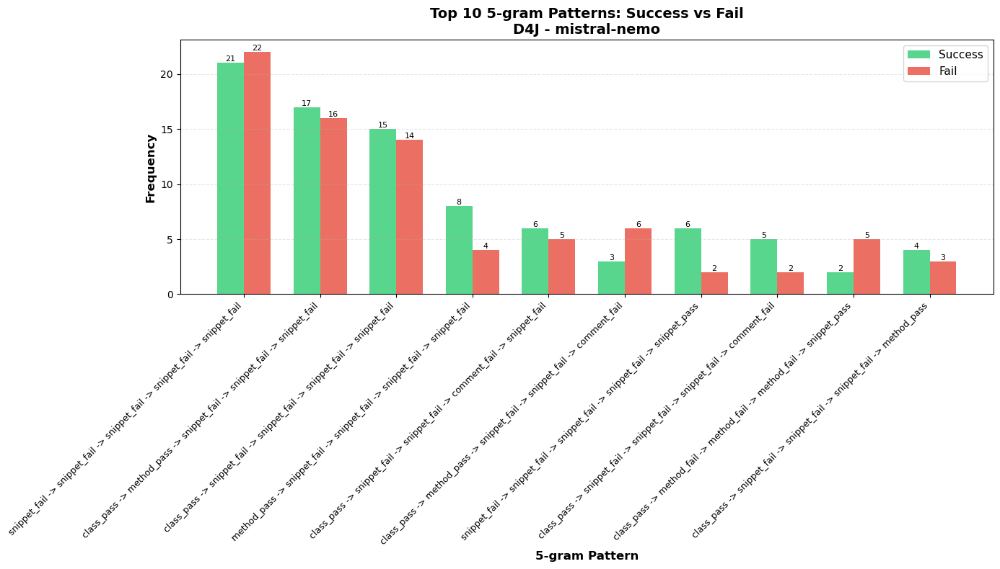


Benchmark: d4j | Model: qwen2.5-coder


Total 5-grams collected: 470

Total 5-grams from successful executions: 256

Total 5-grams from failed executions: 214
                                                                     pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
  class_pass -> snippet_fail -> snippet_fail -> comment_fail -> snippet_fail              19                  11                8         57.9%      42.1%
   class_pass -> method_pass -> snippet_fail -> snippet_fail -> snippet_fail              18                  15                3         83.3%      16.7%
  class_pass -> snippet_fail -> snippet_fail -> snippet_fail -> snippet_fail              14                  10                4         71.4%      28.6%
snippet_fail -> snippet_fail -> comment_fail -> snippet_fail -> snippet_fail              12                   8                4         66.7%      33.3%
snippet_fail -> snippet_fail -> snippet_fail -> comment_fail -> s

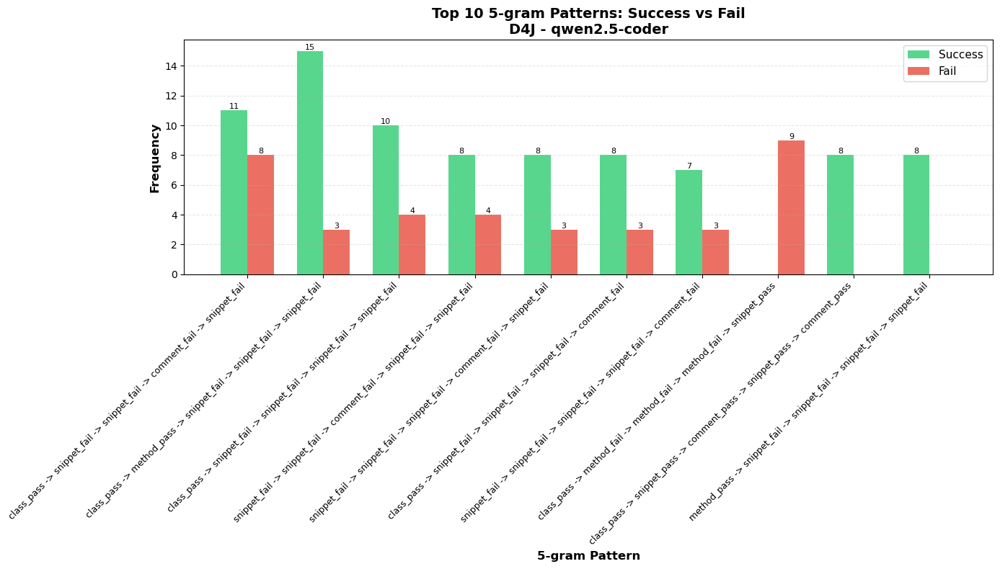


Benchmark: bip | Model: llama3


Total 5-grams collected: 1629

Total 5-grams from successful executions: 763

Total 5-grams from failed executions: 866
                                                              pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
   class_fail -> class_fail -> class_fail -> class_fail -> class_fail             665                 309              356         46.5%      53.5%
 package_pass -> class_fail -> class_fail -> class_fail -> class_fail             546                 254              292         46.5%      53.5%
  class_fail -> class_fail -> class_fail -> class_fail -> method_fail              78                  28               50         35.9%      64.1%
 class_fail -> class_fail -> class_fail -> class_fail -> snippet_pass              46                  31               15         67.4%      32.6%
package_pass -> class_fail -> class_fail -> class_fail -> method_fail              34                  11 

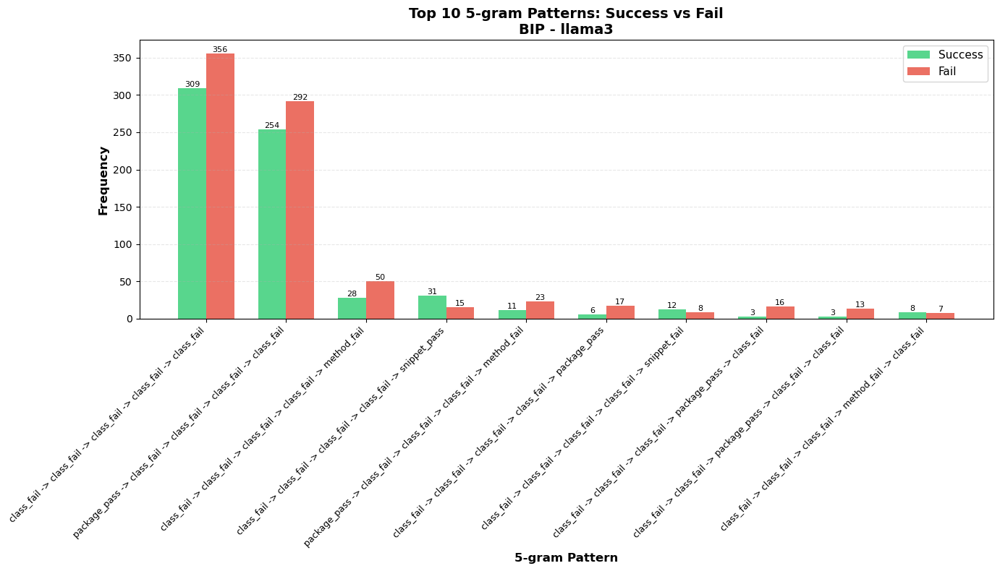


Benchmark: bip | Model: llama3.1


Total 5-grams collected: 5002

Total 5-grams from successful executions: 1990

Total 5-grams from failed executions: 3012
                                                              pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
   class_fail -> class_fail -> class_fail -> class_fail -> class_fail            1800                 535             1265         29.7%      70.3%
 package_pass -> class_fail -> class_fail -> class_fail -> class_fail             714                 298              416         41.7%      58.3%
  class_fail -> class_fail -> class_fail -> class_fail -> method_fail             200                  73              127         36.5%      63.5%
 class_fail -> class_fail -> class_fail -> class_fail -> snippet_pass             103                  68               35         66.0%      34.0%
  class_fail -> class_fail -> class_fail -> class_fail -> method_pass             102                 

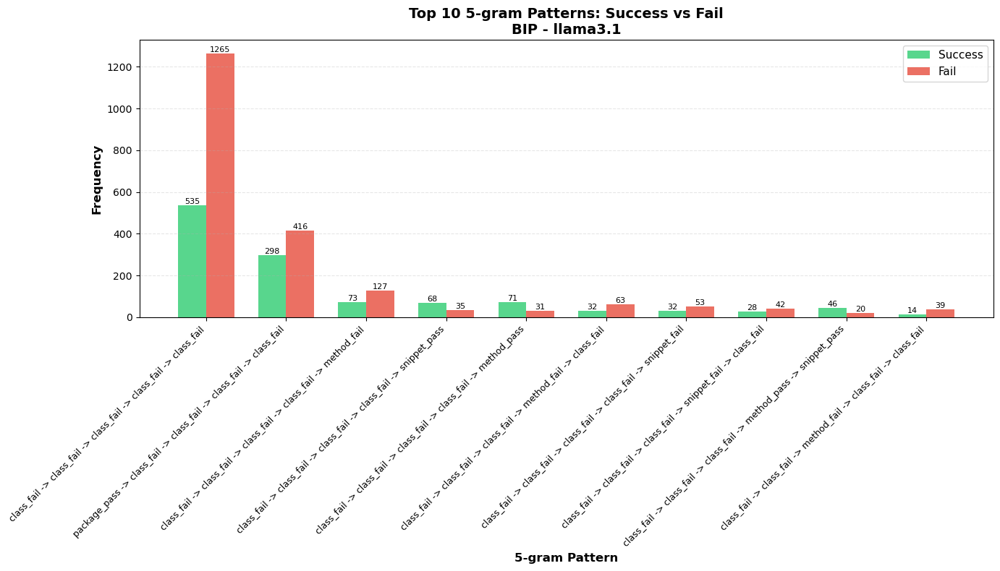


Benchmark: bip | Model: mistral-nemo


Total 5-grams collected: 378

Total 5-grams from successful executions: 133

Total 5-grams from failed executions: 245
                                                                    pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
  package_pass -> method_fail -> method_fail -> method_fail -> snippet_pass              29                  19               10         65.5%      34.5%
package_pass -> method_fail -> snippet_fail -> snippet_fail -> snippet_fail              22                   4               18         18.2%      81.8%
 package_pass -> method_fail -> method_fail -> snippet_fail -> snippet_pass              17                   9                8         52.9%      47.1%
 package_pass -> method_fail -> method_fail -> snippet_fail -> snippet_fail              17                   3               14         17.6%      82.4%
   package_pass -> method_fail -> method_fail -> method_fail -> method_

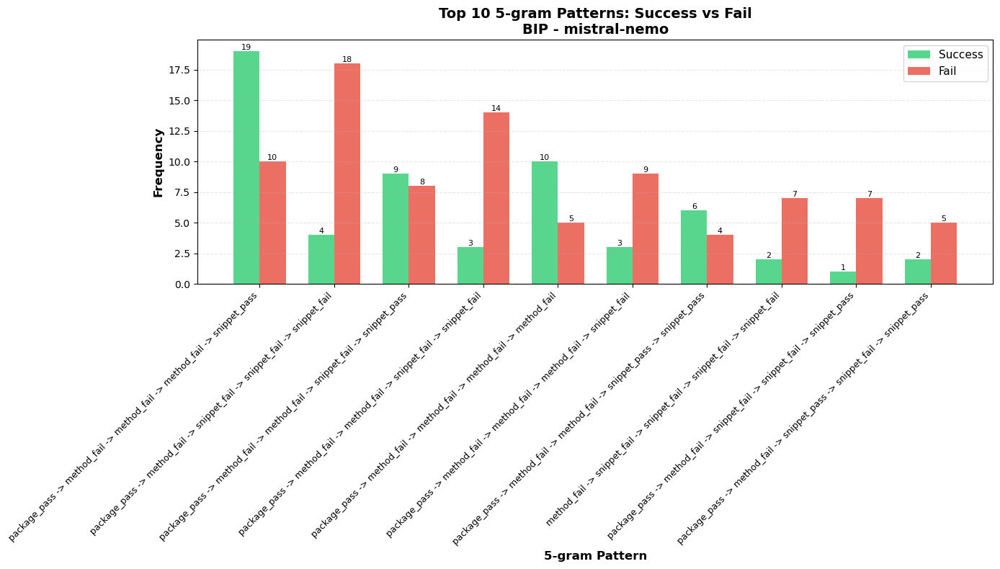


Benchmark: bip | Model: qwen2.5-coder


Total 5-grams collected: 347

Total 5-grams from successful executions: 145

Total 5-grams from failed executions: 202
                                                                    pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
 package_pass -> method_fail -> snippet_fail -> method_fail -> snippet_fail              16                   7                9         43.8%      56.2%
  package_pass -> method_fail -> method_fail -> method_fail -> snippet_pass              11                   7                4         63.6%      36.4%
package_pass -> method_fail -> snippet_pass -> snippet_pass -> snippet_pass              10                   6                4         60.0%      40.0%
   package_pass -> method_fail -> method_fail -> method_fail -> method_fail               9                   3                6         33.3%      66.7%
package_pass -> method_pass -> snippet_pass -> snippet_pass -> snippet

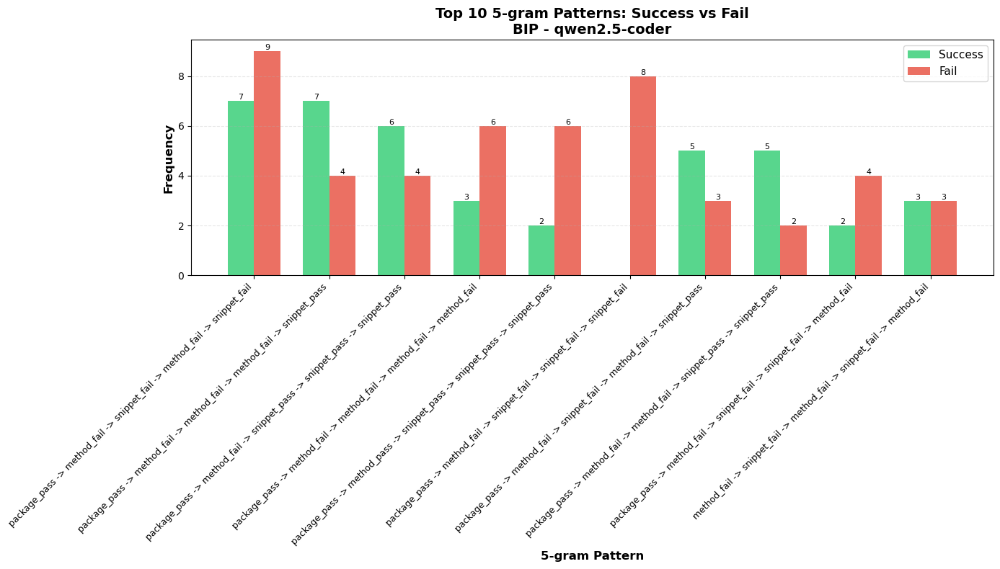

In [23]:
# Compare top 10 most frequent n-grams in all executions vs success/fail executions

import matplotlib.pyplot as plt
import numpy as np

# Function name mapping for readability
name_mapping = {
    'get_covered_packages_pass': 'package_pass',
    'get_failing_tests_covered_classes_pass': 'class_pass',
    'get_failing_tests_covered_methods_for_class_pass': 'method_pass',
    'get_code_snippet_pass': 'snippet_pass',
    'get_comments_pass': 'comment_pass',
    'get_covered_packages_fail': 'package_fail',
    'get_failing_tests_covered_classes_fail': 'class_fail',
    'get_failing_tests_covered_methods_for_class_fail': 'method_fail',
    'get_code_snippet_fail': 'snippet_fail',
    'get_comments_fail': 'comment_fail'
}

def shorten_pattern(pattern_tuple):
    """Convert long function names to short versions"""
    return ' -> '.join([name_mapping.get(func, func) for func in pattern_tuple])

# For each benchmark and model combination
n=5
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams, success_ngrams, fail_ngrams = get_ngrams_for_executions(bm, model, n)
        
        all_counter = Counter(all_ngrams)
        success_counter = Counter(success_ngrams)
        fail_counter = Counter(fail_ngrams)
        
        # Get top 10 from all executions
        top_10_patterns = [pattern for pattern, count in all_counter.most_common(10)]
        
        # Create comparison table
        comparison_data = []
        for pattern in top_10_patterns:
            all_count = all_counter[pattern]
            success_count = success_counter[pattern]
            fail_count = fail_counter[pattern]
            
            comparison_data.append({
                'pattern': shorten_pattern(pattern),
                'all_executions': all_count,
                'success_executions': success_count,
                'fail_executions': fail_count,
                'success_ratio': f"{success_count/all_count*100:.1f}%" if all_count > 0 else "0%",
                'fail_ratio': f"{fail_count/all_count*100:.1f}%" if all_count > 0 else "0%"
            })
        
        # Display as DataFrame
        comparison_df = pd.DataFrame(comparison_data)
        print(comparison_df.to_string(index=False))
        print()
        
        # Create bar chart
        fig, ax = plt.subplots(figsize=(14, 8))
        
        patterns = comparison_df['pattern'].tolist()
        success_counts = comparison_df['success_executions'].tolist()
        fail_counts = comparison_df['fail_executions'].tolist()
        
        x = np.arange(len(patterns))
        width = 0.35
        
        bars1 = ax.bar(x - width/2, success_counts, width, label='Success', color='#2ecc71', alpha=0.8)
        bars2 = ax.bar(x + width/2, fail_counts, width, label='Fail', color='#e74c3c', alpha=0.8)
        
        ax.set_xlabel(f'{n}-gram Pattern', fontsize=12, fontweight='bold')
        ax.set_ylabel('Frequency', fontsize=12, fontweight='bold')
        ax.set_title(f'Top 10 {n}-gram Patterns: Success vs Fail\n{bm.upper()} - {model}', fontsize=14, fontweight='bold')
        ax.set_xticks(x)
        ax.set_xticklabels(patterns, rotation=45, ha='right', fontsize=9)
        ax.legend(fontsize=11)
        ax.grid(axis='y', alpha=0.3, linestyle='--')
        
        # Add value labels on bars
        for bars in [bars1, bars2]:
            for bar in bars:
                height = bar.get_height()
                if height > 0:
                    ax.text(bar.get_x() + bar.get_width()/2., height,
                           f'{int(height)}',
                           ha='center', va='bottom', fontsize=8)
        
        plt.tight_layout()
        plt.show()


Benchmark: d4j | Model: llama3


Total 5-grams collected: 879

Total 5-grams from successful executions: 518

Total 5-grams from failed executions: 361


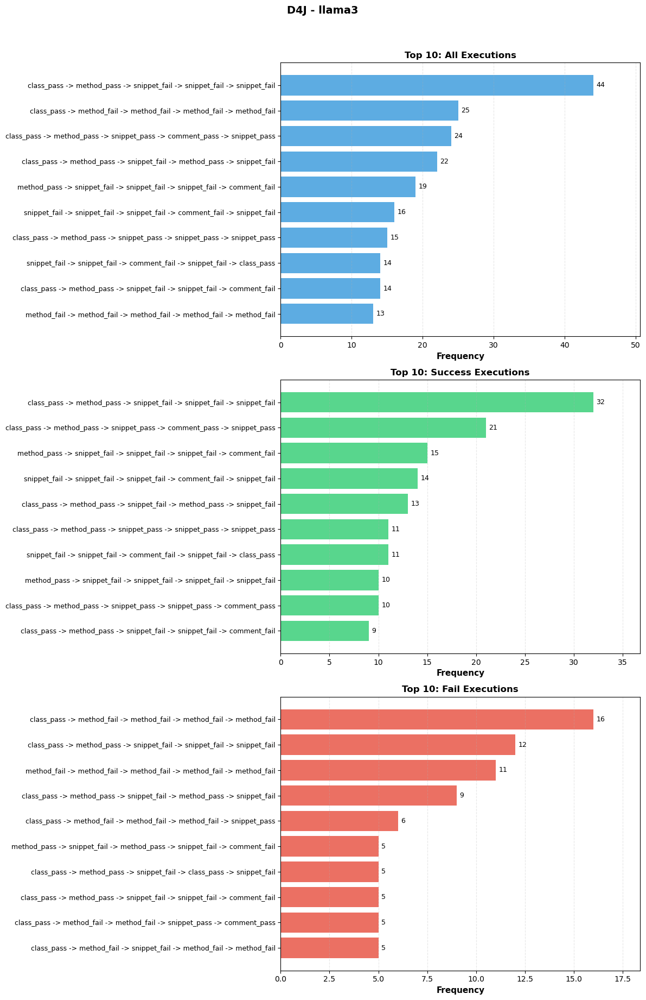


Benchmark: d4j | Model: llama3.1


Total 5-grams collected: 2705

Total 5-grams from successful executions: 1086

Total 5-grams from failed executions: 1619


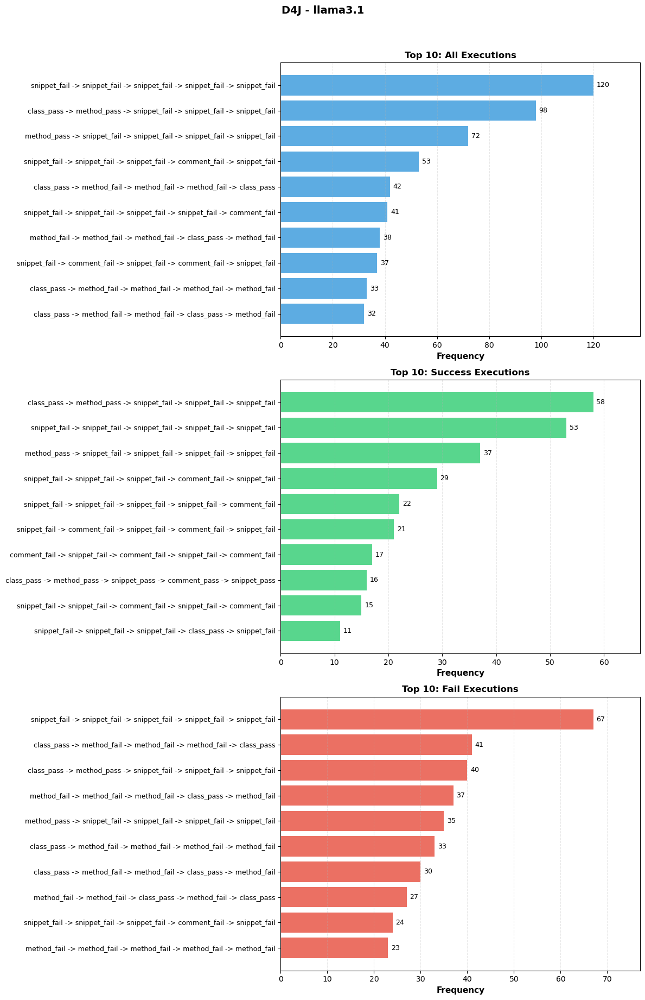


Benchmark: d4j | Model: mistral-nemo


Total 5-grams collected: 367

Total 5-grams from successful executions: 167

Total 5-grams from failed executions: 200


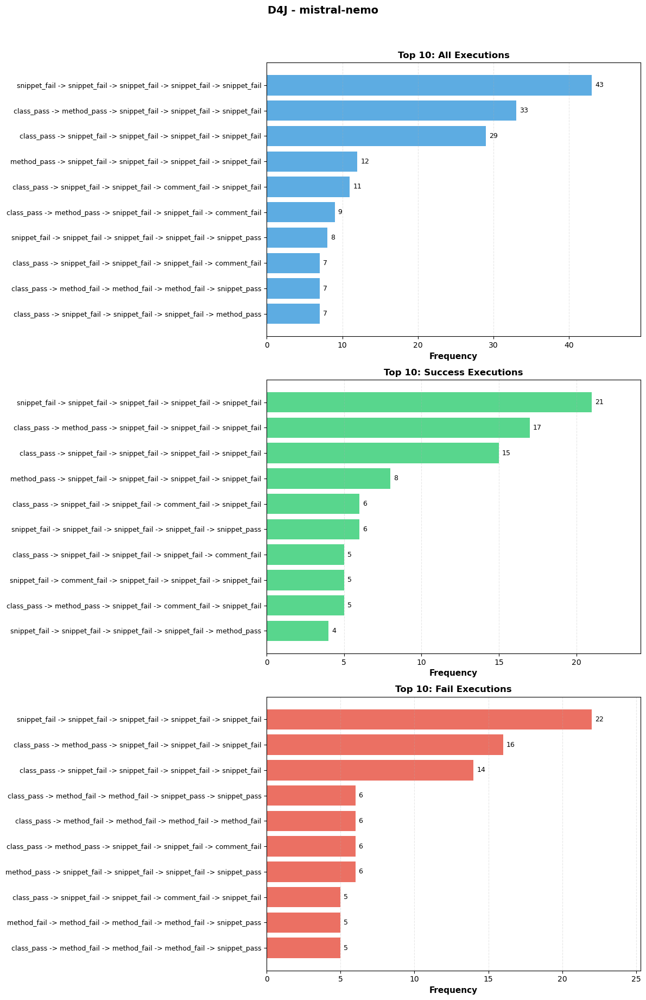


Benchmark: d4j | Model: qwen2.5-coder


Total 5-grams collected: 470

Total 5-grams from successful executions: 256

Total 5-grams from failed executions: 214


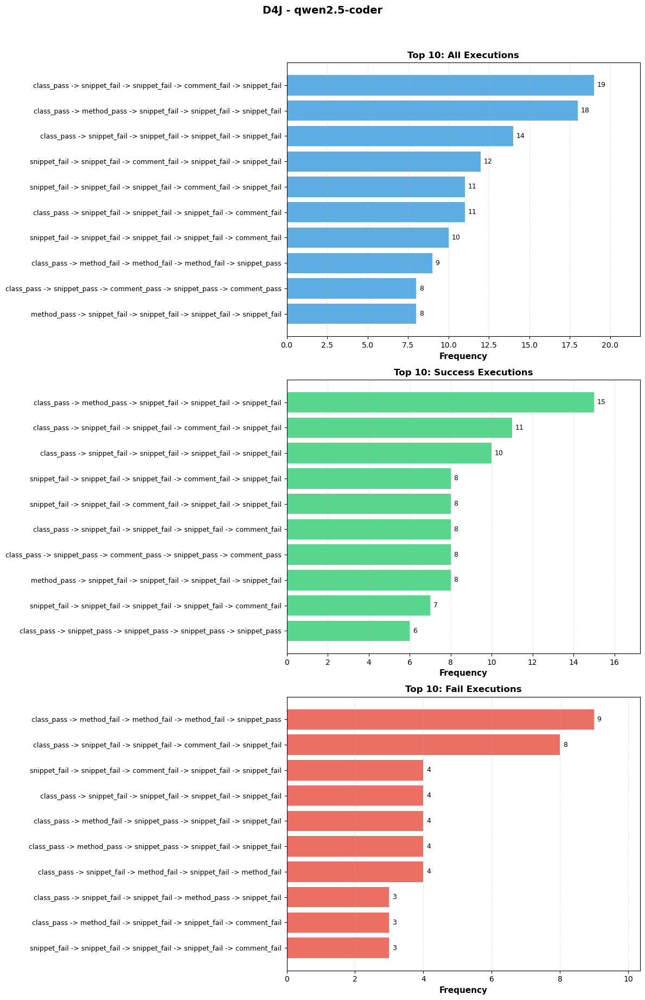


Benchmark: bip | Model: llama3


Total 5-grams collected: 1629

Total 5-grams from successful executions: 763

Total 5-grams from failed executions: 866


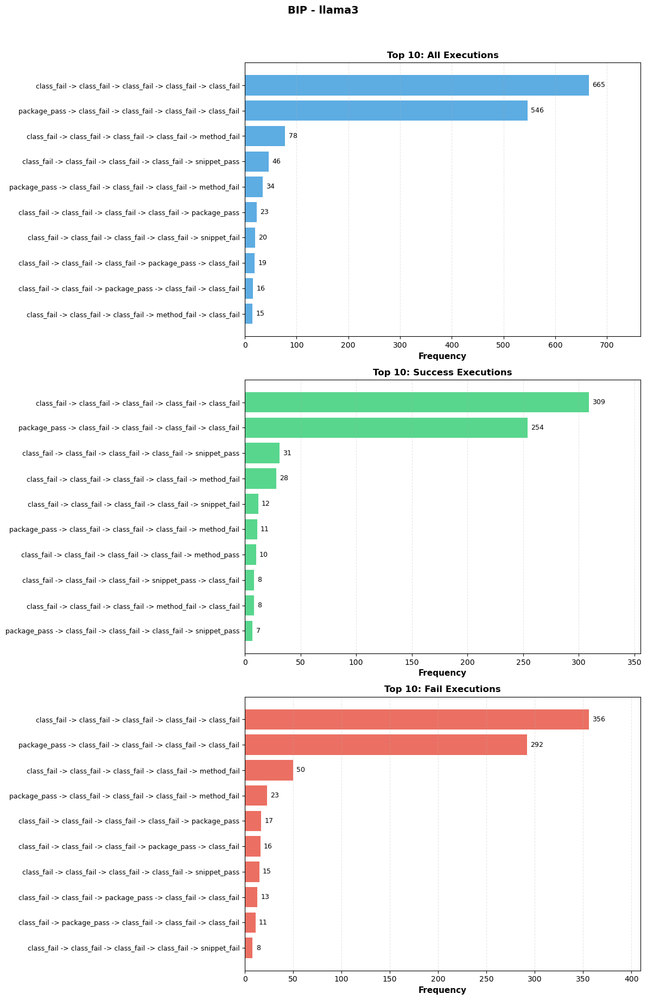


Benchmark: bip | Model: llama3.1


Total 5-grams collected: 5002

Total 5-grams from successful executions: 1990

Total 5-grams from failed executions: 3012


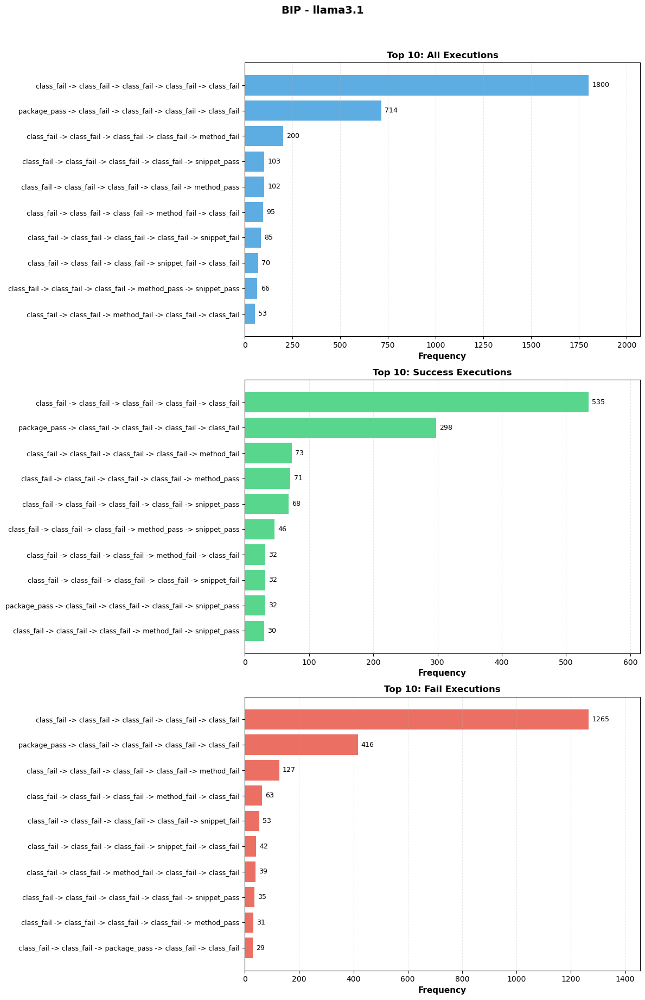


Benchmark: bip | Model: mistral-nemo


Total 5-grams collected: 378

Total 5-grams from successful executions: 133

Total 5-grams from failed executions: 245


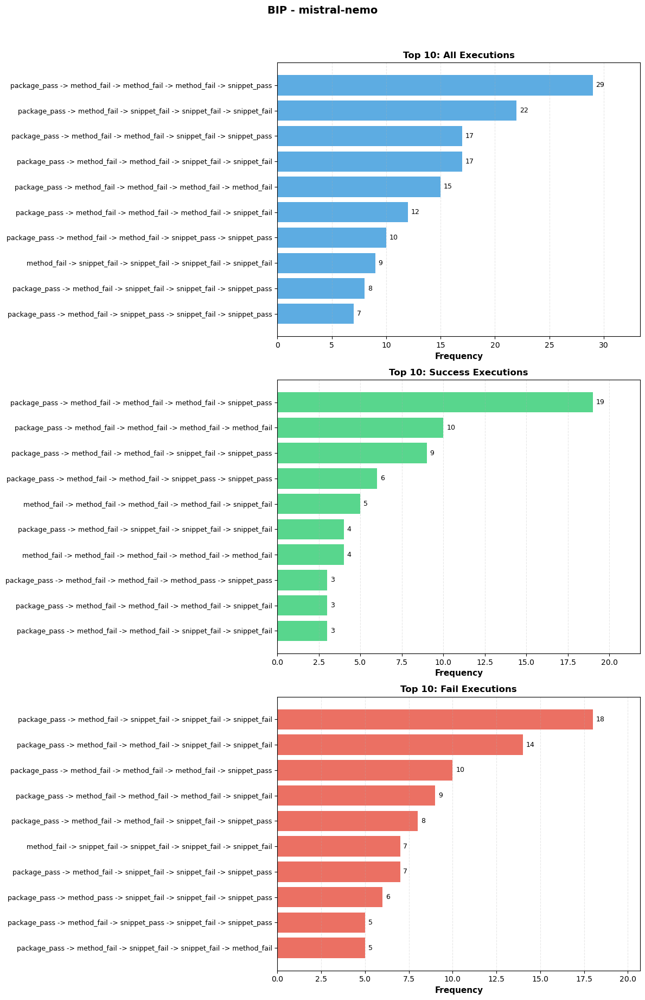


Benchmark: bip | Model: qwen2.5-coder


Total 5-grams collected: 347

Total 5-grams from successful executions: 145

Total 5-grams from failed executions: 202


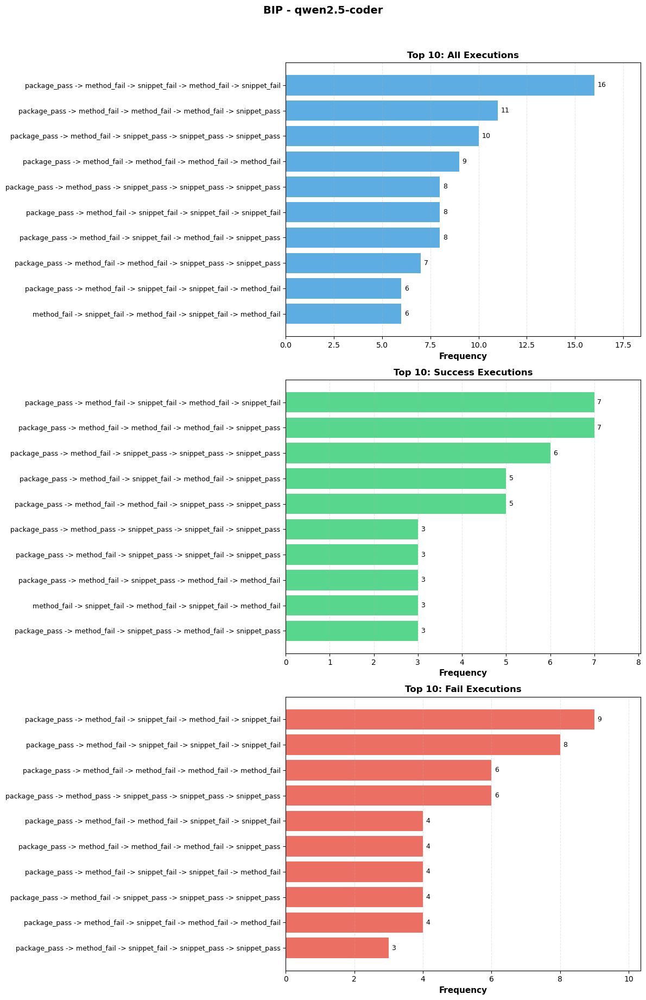

In [24]:
# Visualize Top 10 patterns separately for all/success/fail executions

import matplotlib.pyplot as plt
import numpy as np

# Function name mapping for readability
name_mapping = {
    'get_covered_packages_pass': 'package_pass',
    'get_failing_tests_covered_classes_pass': 'class_pass',
    'get_failing_tests_covered_methods_for_class_pass': 'method_pass',
    'get_code_snippet_pass': 'snippet_pass',
    'get_comments_pass': 'comment_pass',
    'get_covered_packages_fail': 'package_fail',
    'get_failing_tests_covered_classes_fail': 'class_fail',
    'get_failing_tests_covered_methods_for_class_fail': 'method_fail',
    'get_code_snippet_fail': 'snippet_fail',
    'get_comments_fail': 'comment_fail'
}

def shorten_pattern(pattern_tuple):
    """Convert long function names to short versions"""
    return ' -> '.join([name_mapping.get(func, func) for func in pattern_tuple])

# For each benchmark and model combination
n=5
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams, success_ngrams, fail_ngrams = get_ngrams_for_executions(bm, model, n)
        
        all_counter = Counter(all_ngrams)
        success_counter = Counter(success_ngrams)
        fail_counter = Counter(fail_ngrams)
        
        # Get top 10 from each counter
        top_10_all = [(shorten_pattern(pattern), count) for pattern, count in all_counter.most_common(10)]
        top_10_success = [(shorten_pattern(pattern), count) for pattern, count in success_counter.most_common(10)]
        top_10_fail = [(shorten_pattern(pattern), count) for pattern, count in fail_counter.most_common(10)]
        
        # Create 3 subplots
        fig, axes = plt.subplots(3, 1, figsize=(12, 18))
        
        # Plot 1: All Executions
        patterns_all = [p[0] for p in top_10_all]
        counts_all = [p[1] for p in top_10_all]
        
        axes[0].barh(range(len(patterns_all)), counts_all, color='#3498db', alpha=0.8)
        axes[0].set_yticks(range(len(patterns_all)))
        axes[0].set_yticklabels(patterns_all, fontsize=9)
        axes[0].set_xlabel('Frequency', fontsize=11, fontweight='bold')
        axes[0].set_title('Top 10: All Executions', fontsize=12, fontweight='bold')
        axes[0].invert_yaxis()
        axes[0].grid(axis='x', alpha=0.3, linestyle='--')

        axes[0].set_xlim(0, max(counts_all)*1.15)
        
        # Add value labels
        for i, v in enumerate(counts_all):
            axes[0].text(v + max(counts_all)*0.01, i, str(v), va='center', fontsize=9)
        
        # Plot 2: Success Executions
        patterns_success = [p[0] for p in top_10_success]
        counts_success = [p[1] for p in top_10_success]
        
        axes[1].barh(range(len(patterns_success)), counts_success, color='#2ecc71', alpha=0.8)
        axes[1].set_yticks(range(len(patterns_success)))
        axes[1].set_yticklabels(patterns_success, fontsize=9)
        axes[1].set_xlabel('Frequency', fontsize=11, fontweight='bold')
        axes[1].set_title('Top 10: Success Executions', fontsize=12, fontweight='bold')
        axes[1].invert_yaxis()
        axes[1].grid(axis='x', alpha=0.3, linestyle='--')

        axes[1].set_xlim(0, max(counts_success)*1.15)
        
        # Add value labels
        for i, v in enumerate(counts_success):
            axes[1].text(v + max(counts_success)*0.01, i, str(v), va='center', fontsize=9)
        
        # Plot 3: Fail Executions
        patterns_fail = [p[0] for p in top_10_fail]
        counts_fail = [p[1] for p in top_10_fail]
        
        axes[2].barh(range(len(patterns_fail)), counts_fail, color='#e74c3c', alpha=0.8)
        axes[2].set_yticks(range(len(patterns_fail)))
        axes[2].set_yticklabels(patterns_fail, fontsize=9)
        axes[2].set_xlabel('Frequency', fontsize=11, fontweight='bold')
        axes[2].set_title('Top 10: Fail Executions', fontsize=12, fontweight='bold')
        axes[2].invert_yaxis()
        axes[2].grid(axis='x', alpha=0.3, linestyle='--')

        axes[2].set_xlim(0, max(counts_fail)*1.15)
        
        # Add value labels
        for i, v in enumerate(counts_fail):
            axes[2].text(v + max(counts_fail)*0.01, i, str(v), va='center', fontsize=9)
        
        # Overall title
        fig.suptitle(f'{bm.upper()} - {model}', fontsize=14, fontweight='bold', y=1.02)
        
        plt.tight_layout()
        plt.show()

### 4-gram

In [25]:
# Get n-gram: frequencies for all benchmarks and models
n = 4
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    for model in models:
        all_ngrams, all_success_ngrams, all_fail_ngrams = get_ngrams_for_executions(bm, model, n)

        all_counter = Counter(all_ngrams)
        success_counter = Counter(all_success_ngrams)
        fail_counter = Counter(all_fail_ngrams)

        all_results = []
        success_results = []
        fail_results = []
        for ngram, count in all_counter.most_common():
            all_results.append({
                f'{n}gram': ngram,
                'frequency': count
            })
        for ngram, count in success_counter.most_common():
            success_results.append({
                f'{n}gram': ngram,
                'frequency': count
            })
        for ngram, count in fail_counter.most_common():
            fail_results.append({
                f'{n}gram': ngram,
                'frequency': count
            })
            
        
        all_df = pd.DataFrame(all_results)
        success_df = pd.DataFrame(success_results)
        fail_df = pd.DataFrame(fail_results)

        output_dir = f"./{n}gram_frequency/autofl/all_executions"
        os.makedirs(output_dir, exist_ok=True)
        output_file = os.path.join(output_dir, f"{bm}_{model}_{n}gram_frequencies_call_ok.csv")
        all_df.to_csv(output_file, index=False)
        print(f"Saved {output_file} with {len(all_df)} unique {n}-gram")

        output_dir = f"./{n}gram_frequency/autofl/success_executions"
        os.makedirs(output_dir, exist_ok=True)
        output_file = os.path.join(output_dir, f"{bm}_{model}_{n}gram_frequencies_call_ok.csv")
        success_df.to_csv(output_file, index=False)
        print(f"Saved {output_file} with {len(success_df)} unique {n}-gram")

        output_dir = f"./{n}gram_frequency/autofl/fail_executions"
        os.makedirs(output_dir, exist_ok=True)
        output_file = os.path.join(output_dir, f"{bm}_{model}_{n}gram_frequencies_call_ok.csv")
        fail_df.to_csv(output_file, index=False)
        print(f"Saved {output_file} with {len(fail_df)} unique {n}-gram")





Total 4-grams collected: 1646

Total 4-grams from successful executions: 950

Total 4-grams from failed executions: 696
Saved ./4gram_frequency/autofl/all_executions/d4j_llama3_4gram_frequencies_call_ok.csv with 343 unique 4-gram
Saved ./4gram_frequency/autofl/success_executions/d4j_llama3_4gram_frequencies_call_ok.csv with 231 unique 4-gram
Saved ./4gram_frequency/autofl/fail_executions/d4j_llama3_4gram_frequencies_call_ok.csv with 228 unique 4-gram

Total 4-grams collected: 3898

Total 4-grams from successful executions: 1663

Total 4-grams from failed executions: 2235
Saved ./4gram_frequency/autofl/all_executions/d4j_llama3.1_4gram_frequencies_call_ok.csv with 673 unique 4-gram
Saved ./4gram_frequency/autofl/success_executions/d4j_llama3.1_4gram_frequencies_call_ok.csv with 372 unique 4-gram
Saved ./4gram_frequency/autofl/fail_executions/d4j_llama3.1_4gram_frequencies_call_ok.csv with 530 unique 4-gram

Total 4-grams collected: 753

Total 4-grams from successful executions: 330

To


Benchmark: d4j | Model: llama3


Total 4-grams collected: 1646

Total 4-grams from successful executions: 950

Total 4-grams from failed executions: 696
                                                     pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
   class_pass -> method_pass -> snippet_pass -> comment_pass             178                 134               44         75.3%      24.7%
   class_pass -> method_pass -> snippet_fail -> snippet_fail              77                  55               22         71.4%      28.6%
   class_pass -> method_pass -> snippet_pass -> snippet_pass              65                  44               21         67.7%      32.3%
     class_pass -> method_fail -> method_fail -> method_fail              59                  22               37         37.3%      62.7%
 method_pass -> snippet_fail -> snippet_fail -> snippet_fail              47                  35               12         74.5%      25.5%
   class_pas

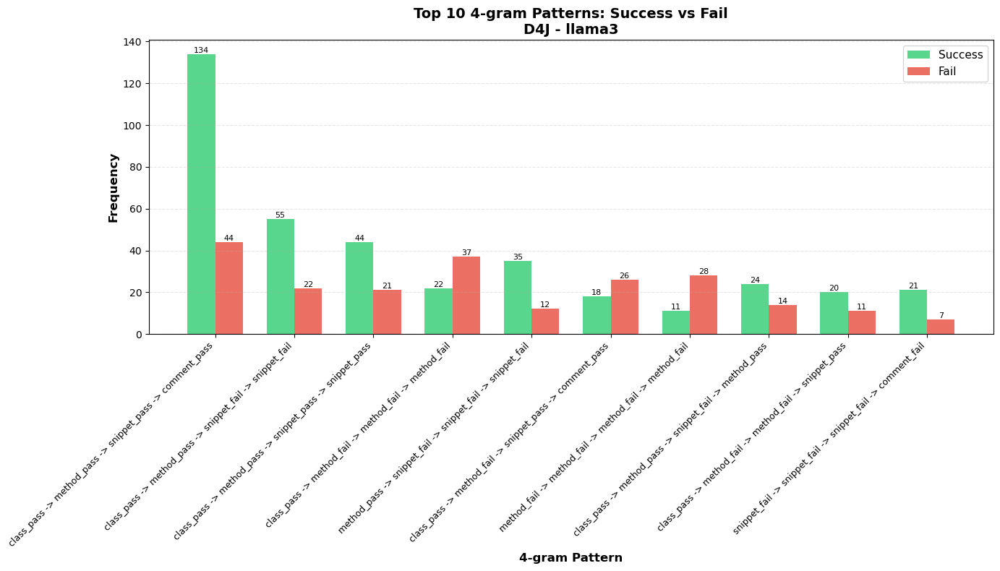


Benchmark: d4j | Model: llama3.1


Total 4-grams collected: 3898

Total 4-grams from successful executions: 1663

Total 4-grams from failed executions: 2235
                                                     pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
snippet_fail -> snippet_fail -> snippet_fail -> snippet_fail             215                 104              111         48.4%      51.6%
   class_pass -> method_pass -> snippet_pass -> comment_pass             164                 124               40         75.6%      24.4%
   class_pass -> method_pass -> comment_pass -> snippet_pass             143                  94               49         65.7%      34.3%
   class_pass -> method_pass -> snippet_fail -> snippet_fail             127                  74               53         58.3%      41.7%
 method_pass -> snippet_fail -> snippet_fail -> snippet_fail             110                  63               47         57.3%      42.7%
     cla

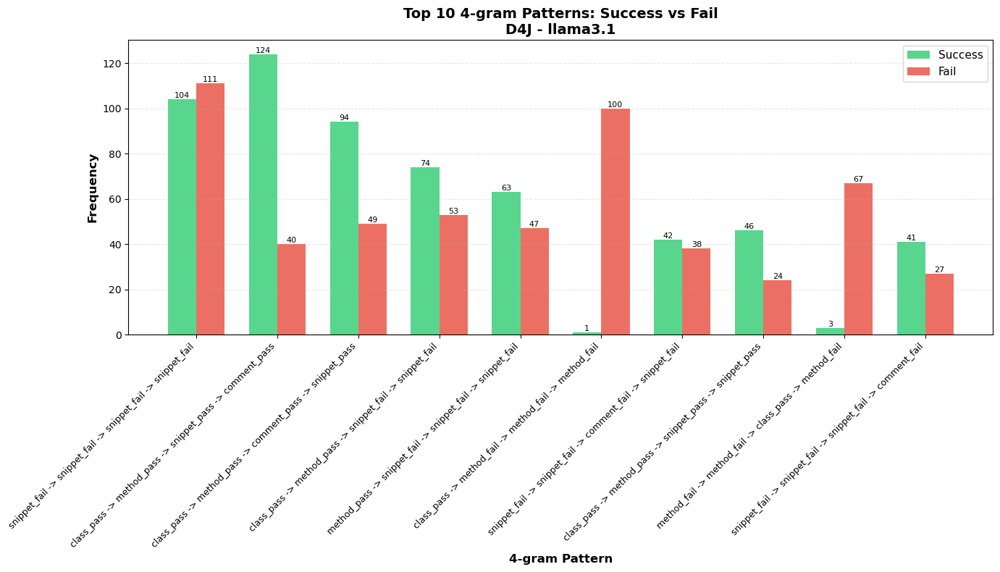


Benchmark: d4j | Model: mistral-nemo


Total 4-grams collected: 753

Total 4-grams from successful executions: 330

Total 4-grams from failed executions: 423
                                                     pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
snippet_fail -> snippet_fail -> snippet_fail -> snippet_fail              88                  46               42         52.3%      47.7%
  class_pass -> snippet_fail -> snippet_fail -> snippet_fail              60                  33               27         55.0%      45.0%
   class_pass -> method_pass -> snippet_fail -> snippet_fail              46                  21               25         45.7%      54.3%
   class_pass -> method_pass -> snippet_pass -> comment_pass              43                  31               12         72.1%      27.9%
 method_pass -> snippet_fail -> snippet_fail -> snippet_fail              34                  17               17         50.0%      50.0%
snippet

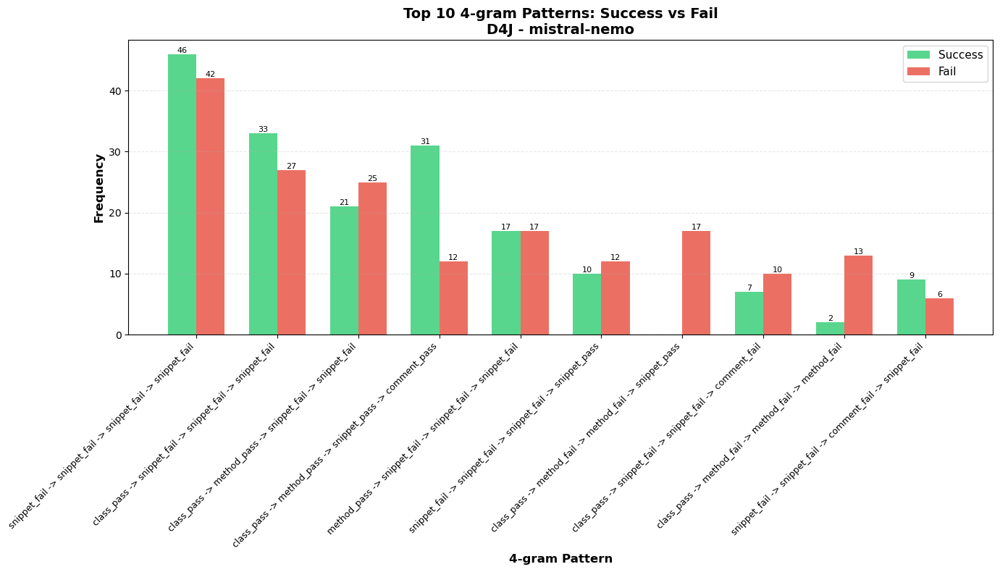


Benchmark: d4j | Model: qwen2.5-coder


Total 4-grams collected: 957

Total 4-grams from successful executions: 503

Total 4-grams from failed executions: 454
                                                     pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
  class_pass -> snippet_pass -> comment_pass -> snippet_pass              37                  30                7         81.1%      18.9%
snippet_fail -> snippet_fail -> comment_fail -> snippet_fail              36                  23               13         63.9%      36.1%
  class_pass -> snippet_fail -> snippet_fail -> snippet_fail              36                  23               13         63.9%      36.1%
  class_pass -> snippet_pass -> snippet_pass -> snippet_pass              32                  22               10         68.8%      31.2%
snippet_fail -> snippet_fail -> snippet_fail -> snippet_fail              29                  25                4         86.2%      13.8%
   cla

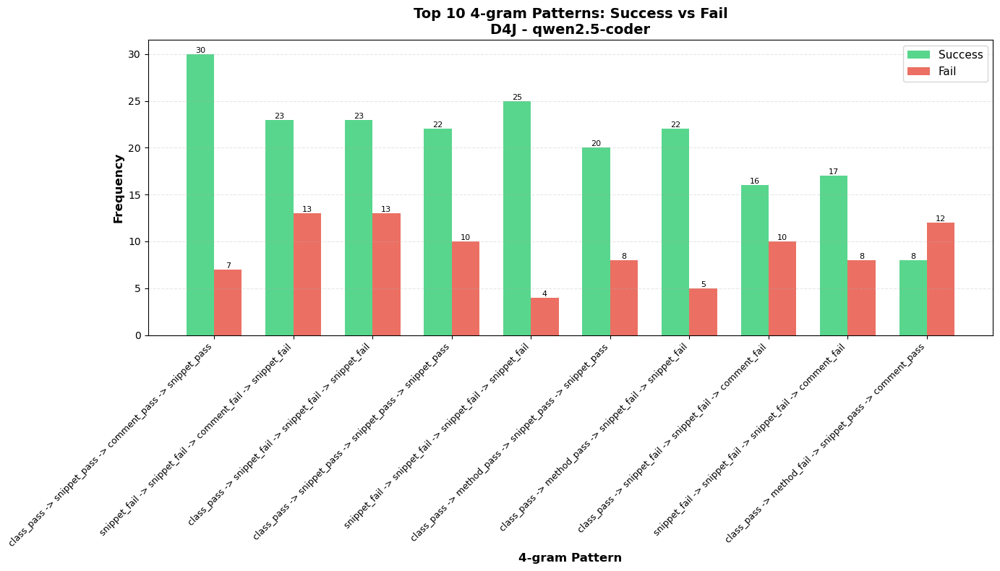


Benchmark: bip | Model: llama3


Total 4-grams collected: 2410

Total 4-grams from successful executions: 1152

Total 4-grams from failed executions: 1258
                                               pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
  class_fail -> class_fail -> class_fail -> class_fail            1212                 564              648         46.5%      53.5%
package_pass -> class_fail -> class_fail -> class_fail             734                 348              386         47.4%      52.6%
 class_fail -> class_fail -> class_fail -> method_fail             112                  39               73         34.8%      65.2%
class_fail -> class_fail -> class_fail -> snippet_pass              55                  38               17         69.1%      30.9%
class_fail -> class_fail -> class_fail -> package_pass              31                   9               22         29.0%      71.0%
class_fail -> class_fail -> package_pass -> cl

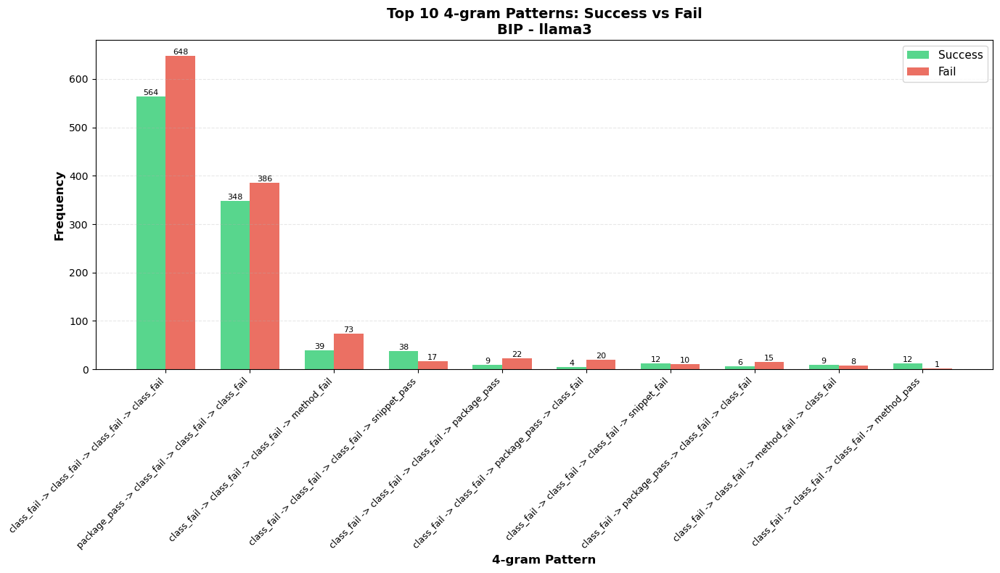


Benchmark: bip | Model: llama3.1


Total 4-grams collected: 6364

Total 4-grams from successful executions: 2662

Total 4-grams from failed executions: 3702
                                                pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
   class_fail -> class_fail -> class_fail -> class_fail            2542                 841             1701         33.1%      66.9%
 package_pass -> class_fail -> class_fail -> class_fail             919                 418              501         45.5%      54.5%
  class_fail -> class_fail -> class_fail -> method_fail             253                 100              153         39.5%      60.5%
 class_fail -> class_fail -> class_fail -> snippet_pass             151                 103               48         68.2%      31.8%
  class_fail -> class_fail -> class_fail -> method_pass             148                 101               47         68.2%      31.8%
 class_fail -> class_fail -> class_fai

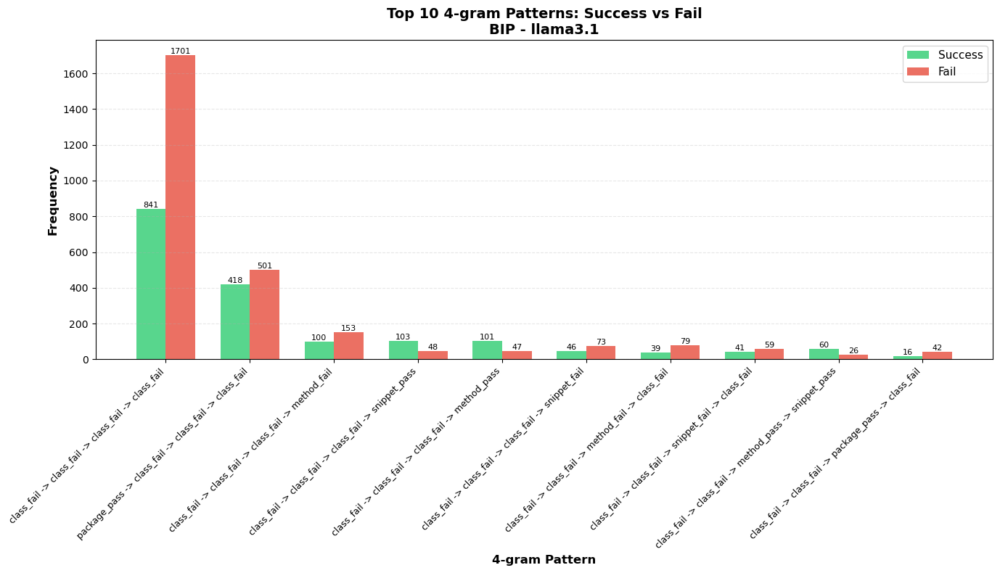


Benchmark: bip | Model: mistral-nemo


Total 4-grams collected: 1121

Total 4-grams from successful executions: 441

Total 4-grams from failed executions: 680
                                                    pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
package_pass -> method_fail -> snippet_fail -> snippet_pass              99                  42               57         42.4%      57.6%
 package_pass -> method_fail -> method_fail -> snippet_pass              83                  41               42         49.4%      50.6%
  package_pass -> method_fail -> method_fail -> method_fail              69                  39               30         56.5%      43.5%
package_pass -> method_fail -> snippet_fail -> snippet_fail              59                  13               46         22.0%      78.0%
 package_pass -> method_fail -> method_fail -> snippet_fail              58                  20               38         34.5%      65.5%
package_pass

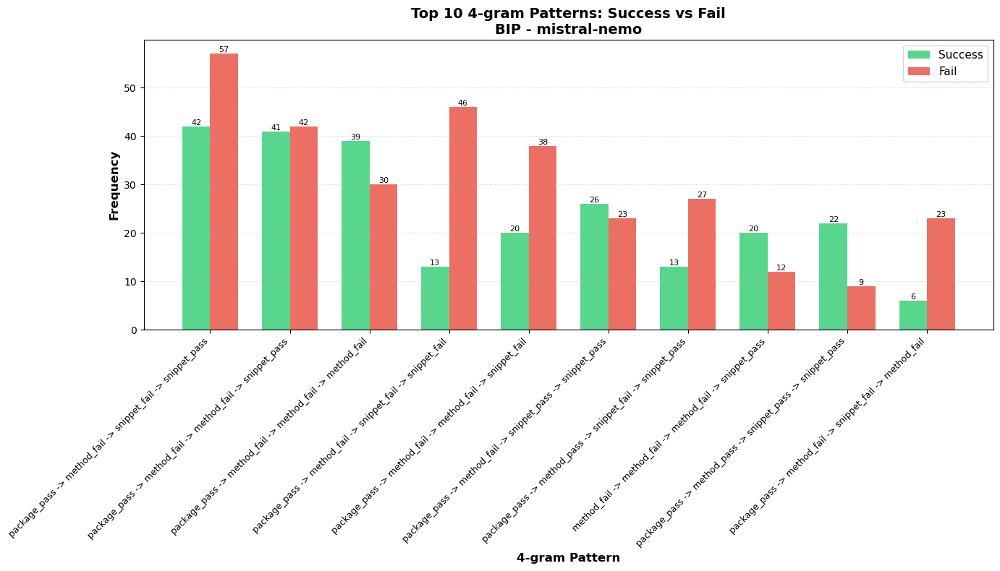


Benchmark: bip | Model: qwen2.5-coder


Total 4-grams collected: 854

Total 4-grams from successful executions: 370

Total 4-grams from failed executions: 484
                                                    pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
package_pass -> method_fail -> snippet_pass -> snippet_pass              51                  28               23         54.9%      45.1%
 package_pass -> method_fail -> snippet_fail -> method_fail              50                  16               34         32.0%      68.0%
package_pass -> method_fail -> snippet_fail -> snippet_pass              49                  17               32         34.7%      65.3%
 package_pass -> method_fail -> method_fail -> snippet_pass              39                  22               17         56.4%      43.6%
 package_pass -> method_fail -> snippet_pass -> method_fail              36                  20               16         55.6%      44.4%
package_pass

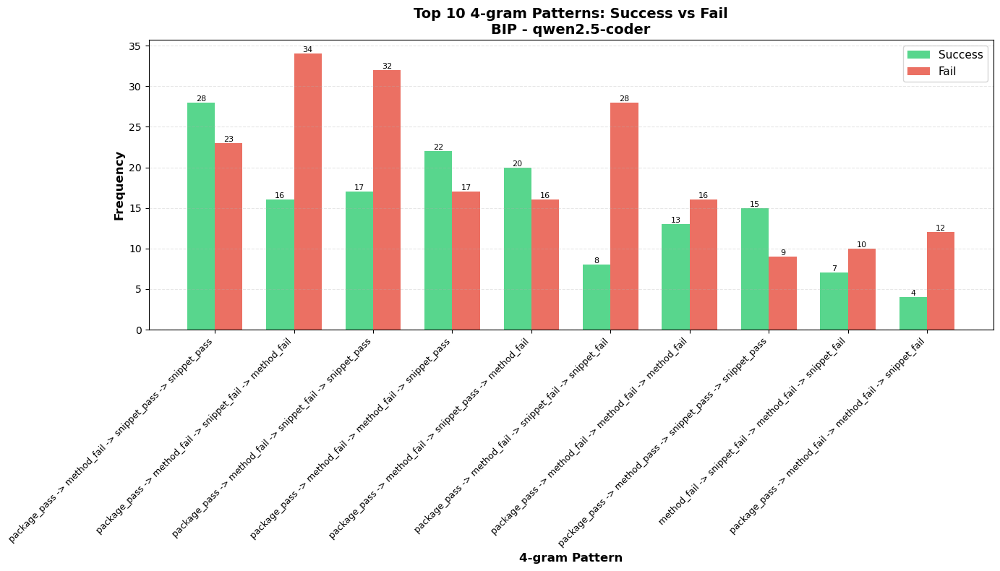

In [26]:
# Compare top 10 most frequent n-grams in all executions vs success/fail executions

import matplotlib.pyplot as plt
import numpy as np

# Function name mapping for readability
name_mapping = {
    'get_covered_packages_pass': 'package_pass',
    'get_failing_tests_covered_classes_pass': 'class_pass',
    'get_failing_tests_covered_methods_for_class_pass': 'method_pass',
    'get_code_snippet_pass': 'snippet_pass',
    'get_comments_pass': 'comment_pass',
    'get_covered_packages_fail': 'package_fail',
    'get_failing_tests_covered_classes_fail': 'class_fail',
    'get_failing_tests_covered_methods_for_class_fail': 'method_fail',
    'get_code_snippet_fail': 'snippet_fail',
    'get_comments_fail': 'comment_fail'
}

def shorten_pattern(pattern_tuple):
    """Convert long function names to short versions"""
    return ' -> '.join([name_mapping.get(func, func) for func in pattern_tuple])

# For each benchmark and model combination
n=4
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams, success_ngrams, fail_ngrams = get_ngrams_for_executions(bm, model, n)
        
        all_counter = Counter(all_ngrams)
        success_counter = Counter(success_ngrams)
        fail_counter = Counter(fail_ngrams)
        
        # Get top 10 from all executions
        top_10_patterns = [pattern for pattern, count in all_counter.most_common(10)]
        
        # Create comparison table
        comparison_data = []
        for pattern in top_10_patterns:
            all_count = all_counter[pattern]
            success_count = success_counter[pattern]
            fail_count = fail_counter[pattern]
            
            comparison_data.append({
                'pattern': shorten_pattern(pattern),
                'all_executions': all_count,
                'success_executions': success_count,
                'fail_executions': fail_count,
                'success_ratio': f"{success_count/all_count*100:.1f}%" if all_count > 0 else "0%",
                'fail_ratio': f"{fail_count/all_count*100:.1f}%" if all_count > 0 else "0%"
            })
        
        # Display as DataFrame
        comparison_df = pd.DataFrame(comparison_data)
        print(comparison_df.to_string(index=False))
        print()
        
        # Create bar chart
        fig, ax = plt.subplots(figsize=(14, 8))
        
        patterns = comparison_df['pattern'].tolist()
        success_counts = comparison_df['success_executions'].tolist()
        fail_counts = comparison_df['fail_executions'].tolist()
        
        x = np.arange(len(patterns))
        width = 0.35
        
        bars1 = ax.bar(x - width/2, success_counts, width, label='Success', color='#2ecc71', alpha=0.8)
        bars2 = ax.bar(x + width/2, fail_counts, width, label='Fail', color='#e74c3c', alpha=0.8)
        
        ax.set_xlabel(f'{n}-gram Pattern', fontsize=12, fontweight='bold')
        ax.set_ylabel('Frequency', fontsize=12, fontweight='bold')
        ax.set_title(f'Top 10 {n}-gram Patterns: Success vs Fail\n{bm.upper()} - {model}', fontsize=14, fontweight='bold')
        ax.set_xticks(x)
        ax.set_xticklabels(patterns, rotation=45, ha='right', fontsize=9)
        ax.legend(fontsize=11)
        ax.grid(axis='y', alpha=0.3, linestyle='--')
        
        # Add value labels on bars
        for bars in [bars1, bars2]:
            for bar in bars:
                height = bar.get_height()
                if height > 0:
                    ax.text(bar.get_x() + bar.get_width()/2., height,
                           f'{int(height)}',
                           ha='center', va='bottom', fontsize=8)
        
        plt.tight_layout()
        plt.show()


Benchmark: d4j | Model: llama3


Total 4-grams collected: 1646

Total 4-grams from successful executions: 950

Total 4-grams from failed executions: 696


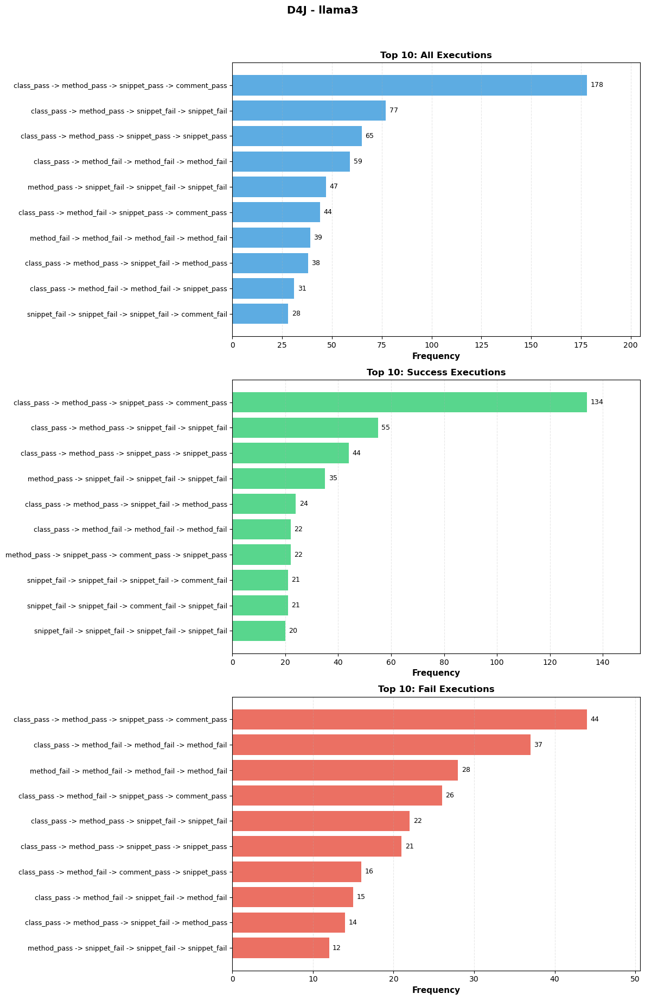


Benchmark: d4j | Model: llama3.1


Total 4-grams collected: 3898

Total 4-grams from successful executions: 1663

Total 4-grams from failed executions: 2235


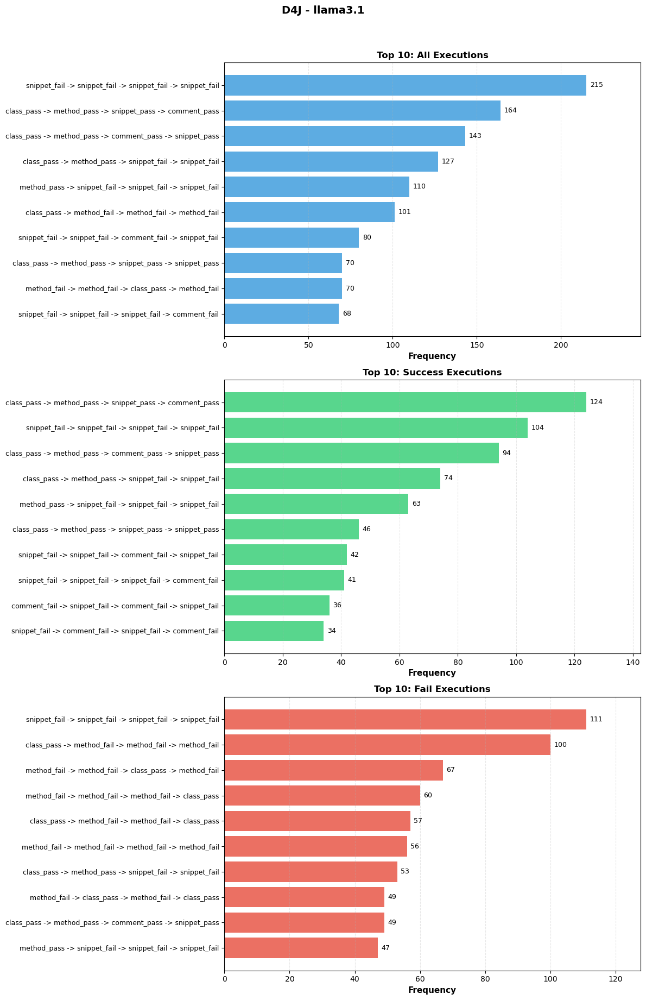


Benchmark: d4j | Model: mistral-nemo


Total 4-grams collected: 753

Total 4-grams from successful executions: 330

Total 4-grams from failed executions: 423


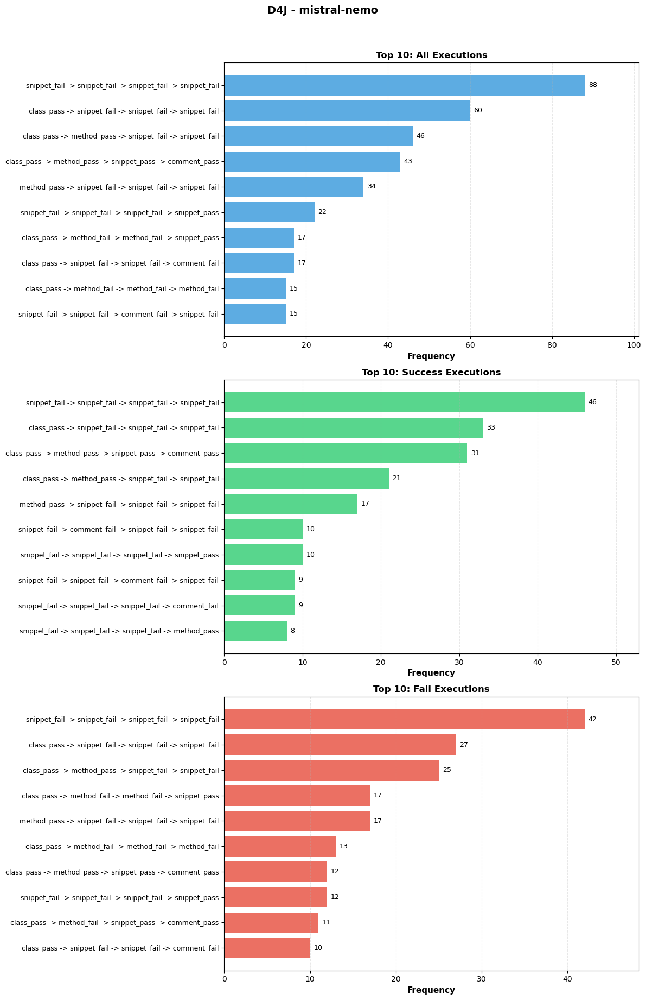


Benchmark: d4j | Model: qwen2.5-coder


Total 4-grams collected: 957

Total 4-grams from successful executions: 503

Total 4-grams from failed executions: 454


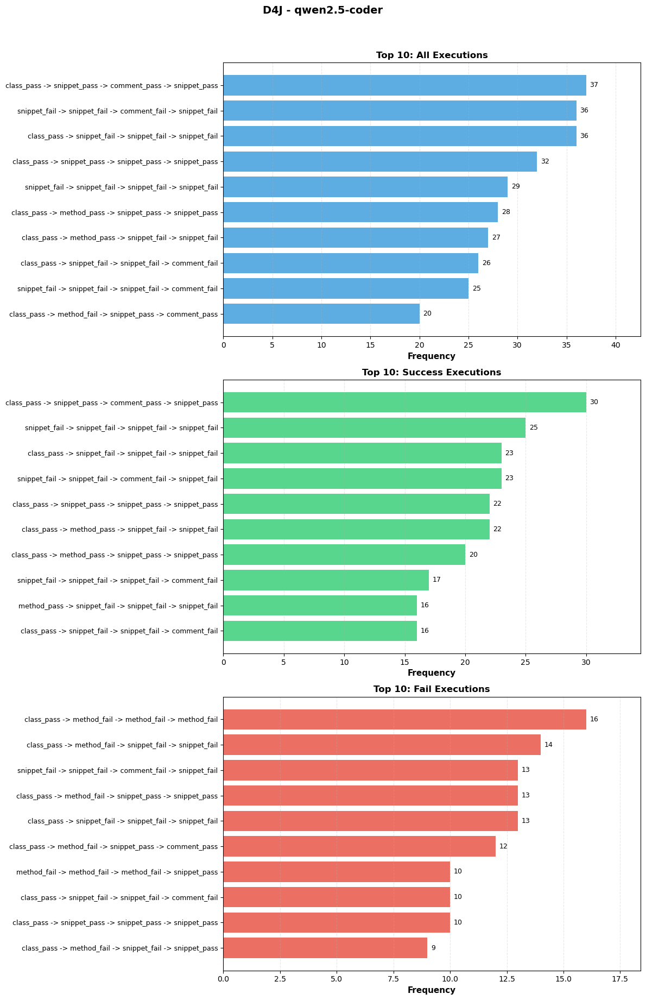


Benchmark: bip | Model: llama3


Total 4-grams collected: 2410

Total 4-grams from successful executions: 1152

Total 4-grams from failed executions: 1258


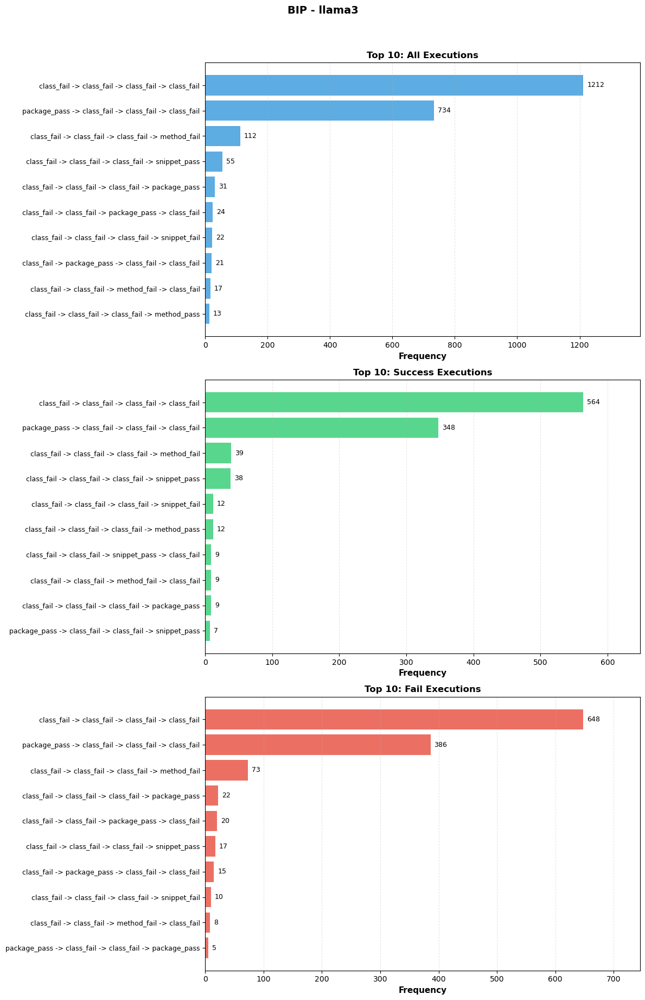


Benchmark: bip | Model: llama3.1


Total 4-grams collected: 6364

Total 4-grams from successful executions: 2662

Total 4-grams from failed executions: 3702


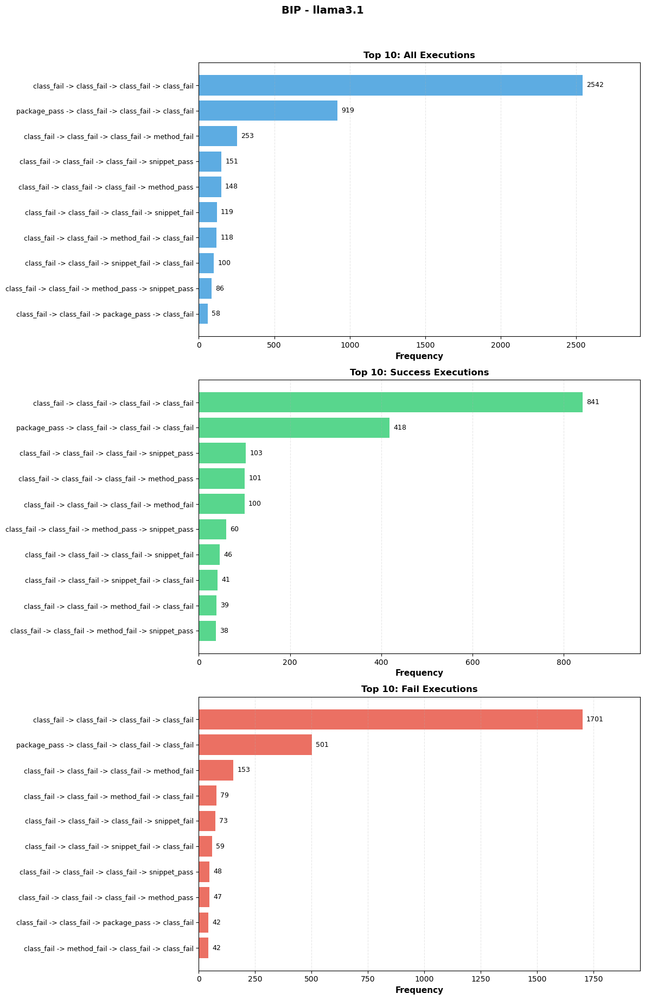


Benchmark: bip | Model: mistral-nemo


Total 4-grams collected: 1121

Total 4-grams from successful executions: 441

Total 4-grams from failed executions: 680


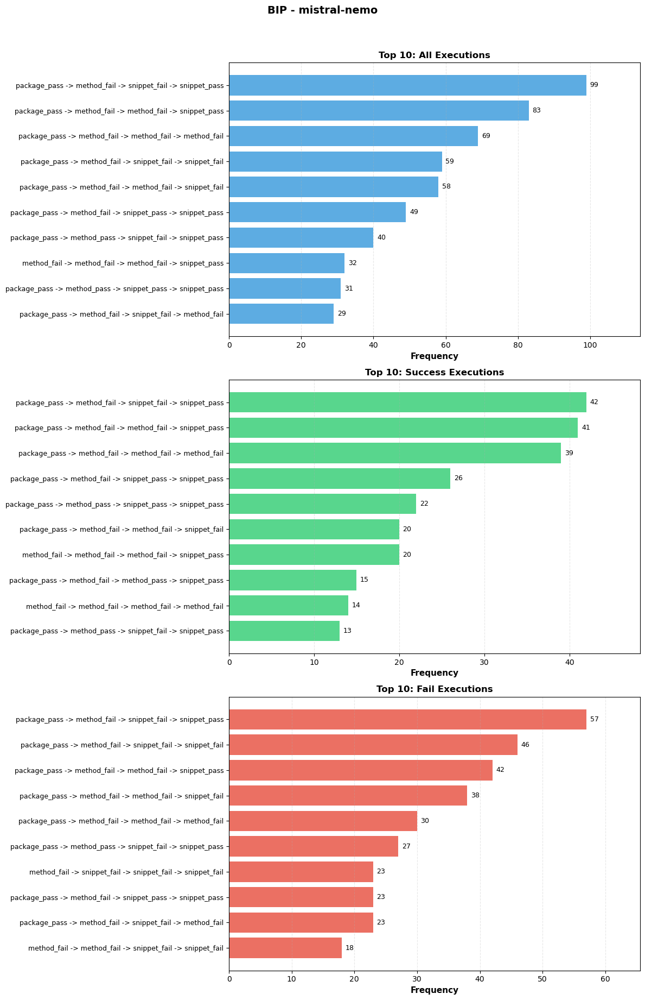


Benchmark: bip | Model: qwen2.5-coder


Total 4-grams collected: 854

Total 4-grams from successful executions: 370

Total 4-grams from failed executions: 484


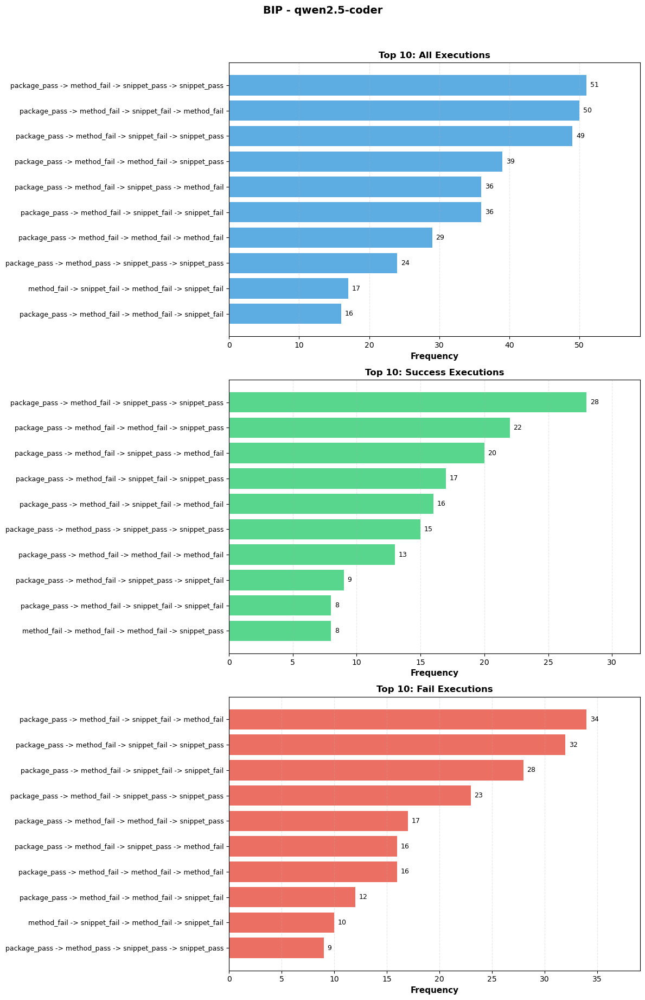

In [27]:
# Visualize Top 10 patterns separately for all/success/fail executions

import matplotlib.pyplot as plt
import numpy as np

# Function name mapping for readability
name_mapping = {
    'get_covered_packages_pass': 'package_pass',
    'get_failing_tests_covered_classes_pass': 'class_pass',
    'get_failing_tests_covered_methods_for_class_pass': 'method_pass',
    'get_code_snippet_pass': 'snippet_pass',
    'get_comments_pass': 'comment_pass',
    'get_covered_packages_fail': 'package_fail',
    'get_failing_tests_covered_classes_fail': 'class_fail',
    'get_failing_tests_covered_methods_for_class_fail': 'method_fail',
    'get_code_snippet_fail': 'snippet_fail',
    'get_comments_fail': 'comment_fail'
}

def shorten_pattern(pattern_tuple):
    """Convert long function names to short versions"""
    return ' -> '.join([name_mapping.get(func, func) for func in pattern_tuple])

# For each benchmark and model combination
n=4
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams, success_ngrams, fail_ngrams = get_ngrams_for_executions(bm, model, n)
        
        all_counter = Counter(all_ngrams)
        success_counter = Counter(success_ngrams)
        fail_counter = Counter(fail_ngrams)
        
        # Get top 10 from each counter
        top_10_all = [(shorten_pattern(pattern), count) for pattern, count in all_counter.most_common(10)]
        top_10_success = [(shorten_pattern(pattern), count) for pattern, count in success_counter.most_common(10)]
        top_10_fail = [(shorten_pattern(pattern), count) for pattern, count in fail_counter.most_common(10)]
        
        # Create 3 subplots
        fig, axes = plt.subplots(3, 1, figsize=(12, 18))
        
        # Plot 1: All Executions
        patterns_all = [p[0] for p in top_10_all]
        counts_all = [p[1] for p in top_10_all]
        
        axes[0].barh(range(len(patterns_all)), counts_all, color='#3498db', alpha=0.8)
        axes[0].set_yticks(range(len(patterns_all)))
        axes[0].set_yticklabels(patterns_all, fontsize=9)
        axes[0].set_xlabel('Frequency', fontsize=11, fontweight='bold')
        axes[0].set_title('Top 10: All Executions', fontsize=12, fontweight='bold')
        axes[0].invert_yaxis()
        axes[0].grid(axis='x', alpha=0.3, linestyle='--')

        axes[0].set_xlim(0, max(counts_all)*1.15)
        
        # Add value labels
        for i, v in enumerate(counts_all):
            axes[0].text(v + max(counts_all)*0.01, i, str(v), va='center', fontsize=9)
        
        # Plot 2: Success Executions
        patterns_success = [p[0] for p in top_10_success]
        counts_success = [p[1] for p in top_10_success]
        
        axes[1].barh(range(len(patterns_success)), counts_success, color='#2ecc71', alpha=0.8)
        axes[1].set_yticks(range(len(patterns_success)))
        axes[1].set_yticklabels(patterns_success, fontsize=9)
        axes[1].set_xlabel('Frequency', fontsize=11, fontweight='bold')
        axes[1].set_title('Top 10: Success Executions', fontsize=12, fontweight='bold')
        axes[1].invert_yaxis()
        axes[1].grid(axis='x', alpha=0.3, linestyle='--')

        axes[1].set_xlim(0, max(counts_success)*1.15)
        
        # Add value labels
        for i, v in enumerate(counts_success):
            axes[1].text(v + max(counts_success)*0.01, i, str(v), va='center', fontsize=9)
        
        # Plot 3: Fail Executions
        patterns_fail = [p[0] for p in top_10_fail]
        counts_fail = [p[1] for p in top_10_fail]
        
        axes[2].barh(range(len(patterns_fail)), counts_fail, color='#e74c3c', alpha=0.8)
        axes[2].set_yticks(range(len(patterns_fail)))
        axes[2].set_yticklabels(patterns_fail, fontsize=9)
        axes[2].set_xlabel('Frequency', fontsize=11, fontweight='bold')
        axes[2].set_title('Top 10: Fail Executions', fontsize=12, fontweight='bold')
        axes[2].invert_yaxis()
        axes[2].grid(axis='x', alpha=0.3, linestyle='--')

        axes[2].set_xlim(0, max(counts_fail)*1.15)
        
        # Add value labels
        for i, v in enumerate(counts_fail):
            axes[2].text(v + max(counts_fail)*0.01, i, str(v), va='center', fontsize=9)
        
        # Overall title
        fig.suptitle(f'{bm.upper()} - {model}', fontsize=14, fontweight='bold', y=1.02)
        
        plt.tight_layout()
        plt.show()

### 3-gram

In [28]:
# Get n-gram: frequencies for all benchmarks and models
n = 3
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    for model in models:
        all_ngrams, all_success_ngrams, all_fail_ngrams = get_ngrams_for_executions(bm, model, n)

        all_counter = Counter(all_ngrams)
        success_counter = Counter(all_success_ngrams)
        fail_counter = Counter(all_fail_ngrams)

        all_results = []
        success_results = []
        fail_results = []
        for ngram, count in all_counter.most_common():
            all_results.append({
                f'{n}gram': ngram,
                'frequency': count
            })
        for ngram, count in success_counter.most_common():
            success_results.append({
                f'{n}gram': ngram,
                'frequency': count
            })
        for ngram, count in fail_counter.most_common():
            fail_results.append({
                f'{n}gram': ngram,
                'frequency': count
            })
            
        
        all_df = pd.DataFrame(all_results)
        success_df = pd.DataFrame(success_results)
        fail_df = pd.DataFrame(fail_results)

        output_dir = f"./{n}gram_frequency/autofl/all_executions"
        os.makedirs(output_dir, exist_ok=True)
        output_file = os.path.join(output_dir, f"{bm}_{model}_{n}gram_frequencies_call_ok.csv")
        all_df.to_csv(output_file, index=False)
        print(f"Saved {output_file} with {len(all_df)} unique {n}-gram")

        output_dir = f"./{n}gram_frequency/autofl/success_executions"
        os.makedirs(output_dir, exist_ok=True)
        output_file = os.path.join(output_dir, f"{bm}_{model}_{n}gram_frequencies_call_ok.csv")
        success_df.to_csv(output_file, index=False)
        print(f"Saved {output_file} with {len(success_df)} unique {n}-gram")

        output_dir = f"./{n}gram_frequency/autofl/fail_executions"
        os.makedirs(output_dir, exist_ok=True)
        output_file = os.path.join(output_dir, f"{bm}_{model}_{n}gram_frequencies_call_ok.csv")
        fail_df.to_csv(output_file, index=False)
        print(f"Saved {output_file} with {len(fail_df)} unique {n}-gram")





Total 3-grams collected: 2948

Total 3-grams from successful executions: 1609

Total 3-grams from failed executions: 1339
Saved ./3gram_frequency/autofl/all_executions/d4j_llama3_3gram_frequencies_call_ok.csv with 193 unique 3-gram
Saved ./3gram_frequency/autofl/success_executions/d4j_llama3_3gram_frequencies_call_ok.csv with 145 unique 3-gram
Saved ./3gram_frequency/autofl/fail_executions/d4j_llama3_3gram_frequencies_call_ok.csv with 153 unique 3-gram

Total 3-grams collected: 5521

Total 3-grams from successful executions: 2497

Total 3-grams from failed executions: 3024
Saved ./3gram_frequency/autofl/all_executions/d4j_llama3.1_3gram_frequencies_call_ok.csv with 279 unique 3-gram
Saved ./3gram_frequency/autofl/success_executions/d4j_llama3.1_3gram_frequencies_call_ok.csv with 197 unique 3-gram
Saved ./3gram_frequency/autofl/fail_executions/d4j_llama3.1_3gram_frequencies_call_ok.csv with 254 unique 3-gram

Total 3-grams collected: 1751

Total 3-grams from successful executions: 826



Benchmark: d4j | Model: llama3


Total 3-grams collected: 2948

Total 3-grams from successful executions: 1609

Total 3-grams from failed executions: 1339
                                     pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
   class_pass -> method_pass -> snippet_pass             580                 347              233         59.8%      40.2%
   class_pass -> method_pass -> snippet_fail             197                 119               78         60.4%      39.6%
 method_pass -> snippet_pass -> comment_pass             185                 139               46         75.1%      24.9%
    class_pass -> method_fail -> method_fail             151                  62               89         41.1%      58.9%
   class_pass -> method_fail -> snippet_pass             149                  50               99         33.6%      66.4%
   method_fail -> method_fail -> method_fail             104                  36               68         

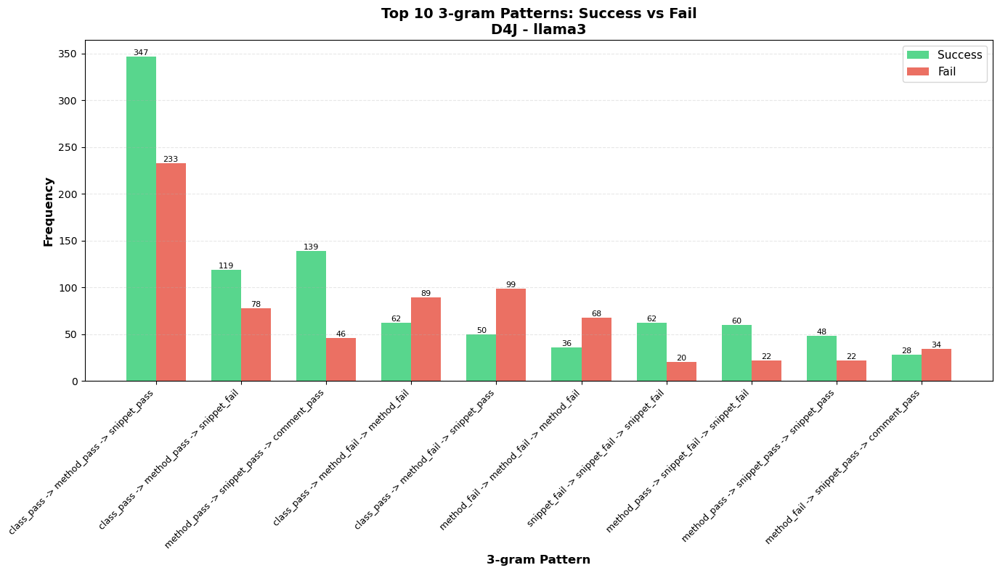


Benchmark: d4j | Model: llama3.1


Total 3-grams collected: 5521

Total 3-grams from successful executions: 2497

Total 3-grams from failed executions: 3024
                                     pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
   class_pass -> method_pass -> snippet_pass             582                 398              184         68.4%      31.6%
snippet_fail -> snippet_fail -> snippet_fail             376                 195              181         51.9%      48.1%
   class_pass -> method_pass -> comment_pass             213                 146               67         68.5%      31.5%
    class_pass -> method_fail -> method_fail             213                  14              199          6.6%      93.4%
   class_pass -> method_pass -> snippet_fail             211                 116               95         55.0%      45.0%
 method_pass -> snippet_pass -> comment_pass             182                 132               50       

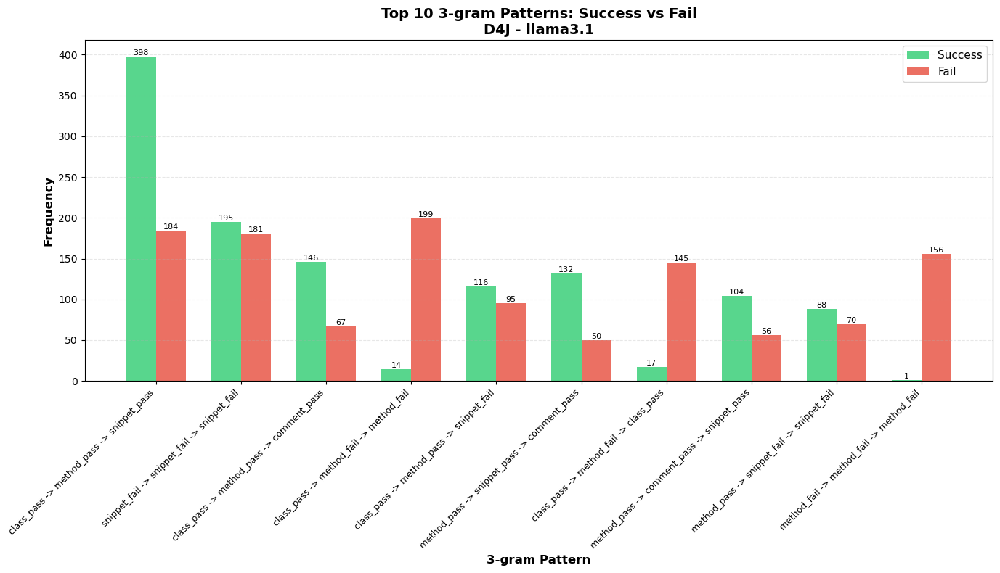


Benchmark: d4j | Model: mistral-nemo


Total 3-grams collected: 1751

Total 3-grams from successful executions: 826

Total 3-grams from failed executions: 925
                                     pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
   class_pass -> method_pass -> snippet_pass             319                 194              125         60.8%      39.2%
snippet_fail -> snippet_fail -> snippet_fail             198                 104               94         52.5%      47.5%
  class_pass -> snippet_pass -> comment_pass             186                 124               62         66.7%      33.3%
  class_pass -> snippet_fail -> snippet_fail             113                  56               57         49.6%      50.4%
   class_pass -> method_fail -> snippet_pass              82                   9               73         11.0%      89.0%
   class_pass -> method_pass -> snippet_fail              75                  42               33     

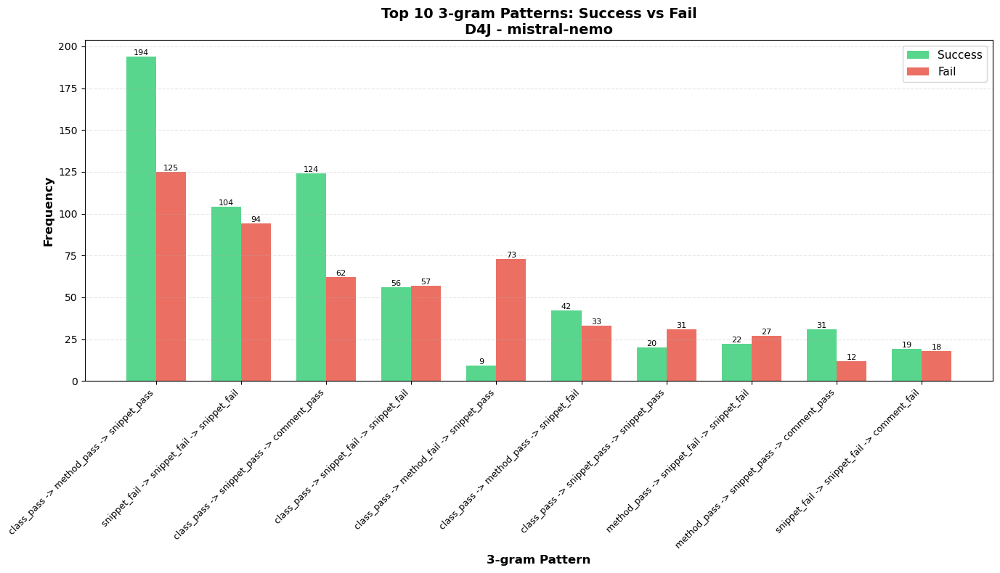


Benchmark: d4j | Model: qwen2.5-coder


Total 3-grams collected: 1893

Total 3-grams from successful executions: 975

Total 3-grams from failed executions: 918
                                     pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
  class_pass -> snippet_pass -> comment_pass             169                 129               40         76.3%      23.7%
   class_pass -> method_pass -> snippet_pass             164                  82               82         50.0%      50.0%
  class_pass -> snippet_pass -> snippet_pass             132                  76               56         57.6%      42.4%
   class_pass -> method_fail -> snippet_pass             115                  29               86         25.2%      74.8%
snippet_fail -> snippet_fail -> snippet_fail             100                  72               28         72.0%      28.0%
  class_pass -> snippet_fail -> snippet_fail              92                  53               39    

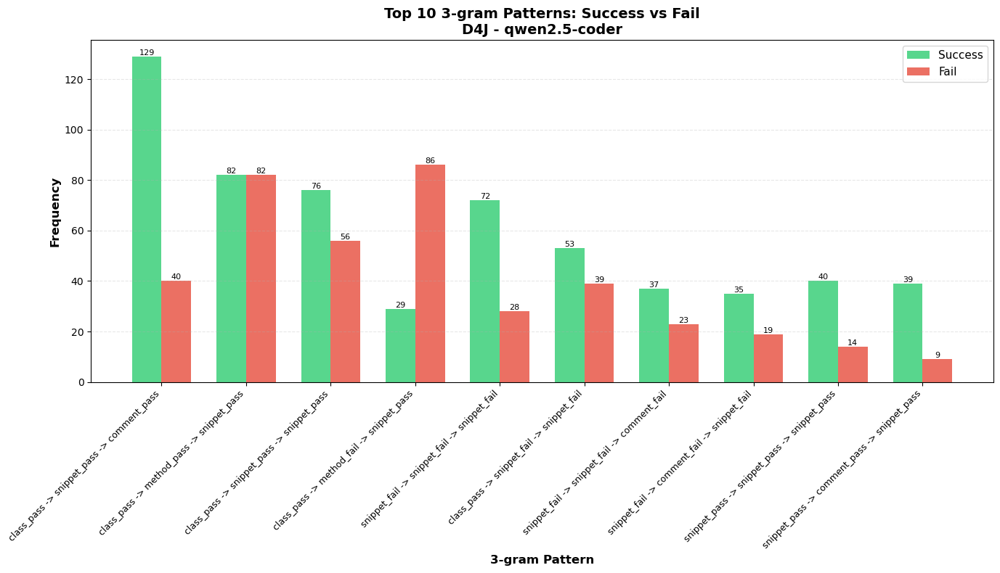


Benchmark: bip | Model: llama3


Total 3-grams collected: 3286

Total 3-grams from successful executions: 1593

Total 3-grams from failed executions: 1693
                                 pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
  class_fail -> class_fail -> class_fail            1947                 913             1034         46.9%      53.1%
package_pass -> class_fail -> class_fail             847                 411              436         48.5%      51.5%
 class_fail -> class_fail -> method_fail             122                  45               77         36.9%      63.1%
class_fail -> class_fail -> snippet_pass              67                  49               18         73.1%      26.9%
class_fail -> class_fail -> package_pass              40                  12               28         30.0%      70.0%
class_fail -> package_pass -> class_fail              31                   8               23         25.8%      74.2%
class_fail 

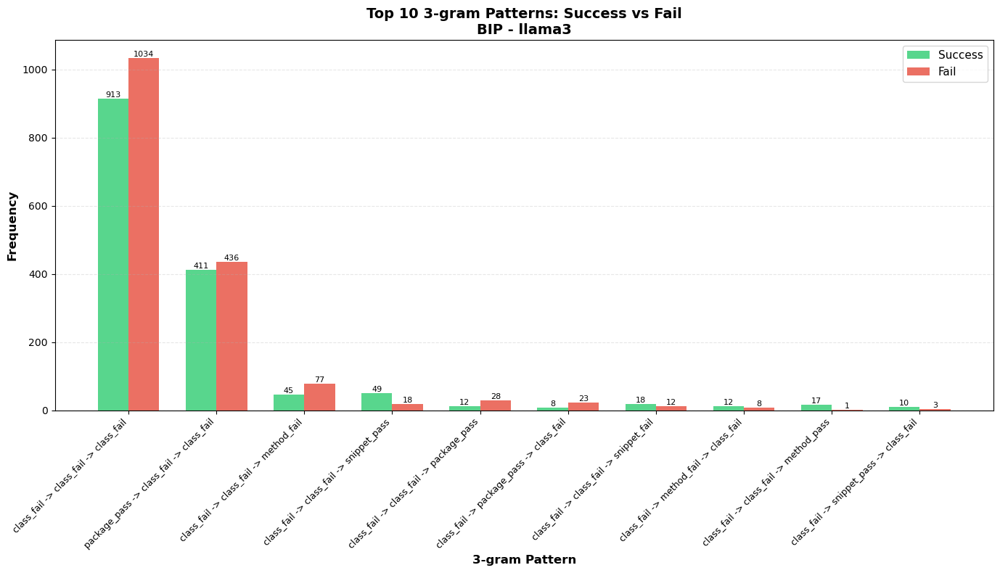


Benchmark: bip | Model: llama3.1


Total 3-grams collected: 8137

Total 3-grams from successful executions: 3597

Total 3-grams from failed executions: 4540
                                    pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
     class_fail -> class_fail -> class_fail            3527                1282             2245         36.3%      63.7%
   package_pass -> class_fail -> class_fail            1122                 529              593         47.1%      52.9%
    class_fail -> class_fail -> method_fail             307                 123              184         40.1%      59.9%
   class_fail -> class_fail -> snippet_pass             212                 145               67         68.4%      31.6%
package_pass -> method_pass -> snippet_pass             199                 148               51         74.4%      25.6%
    class_fail -> class_fail -> method_pass             186                 128               58         68.8%

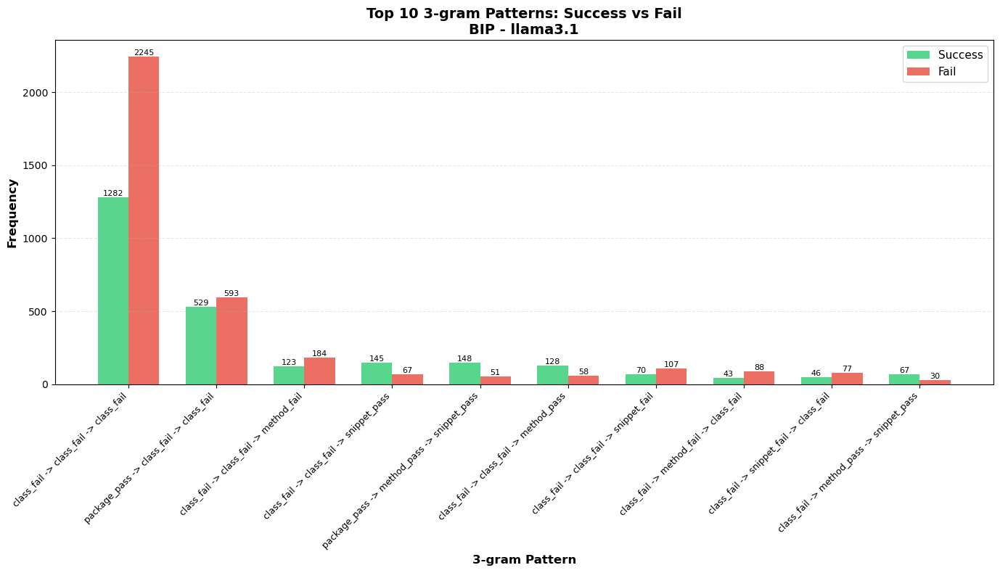


Benchmark: bip | Model: mistral-nemo


Total 3-grams collected: 3020

Total 3-grams from successful executions: 1384

Total 3-grams from failed executions: 1636
                                     pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
 package_pass -> method_fail -> snippet_pass             558                 305              253         54.7%      45.3%
 package_pass -> method_pass -> snippet_pass             462                 271              191         58.7%      41.3%
  package_pass -> method_fail -> method_fail             274                 125              149         45.6%      54.4%
 package_pass -> method_fail -> snippet_fail             264                  87              177         33.0%      67.0%
 method_fail -> snippet_fail -> snippet_pass             124                  54               70         43.5%      56.5%
  method_fail -> method_fail -> snippet_pass             117                  62               55   

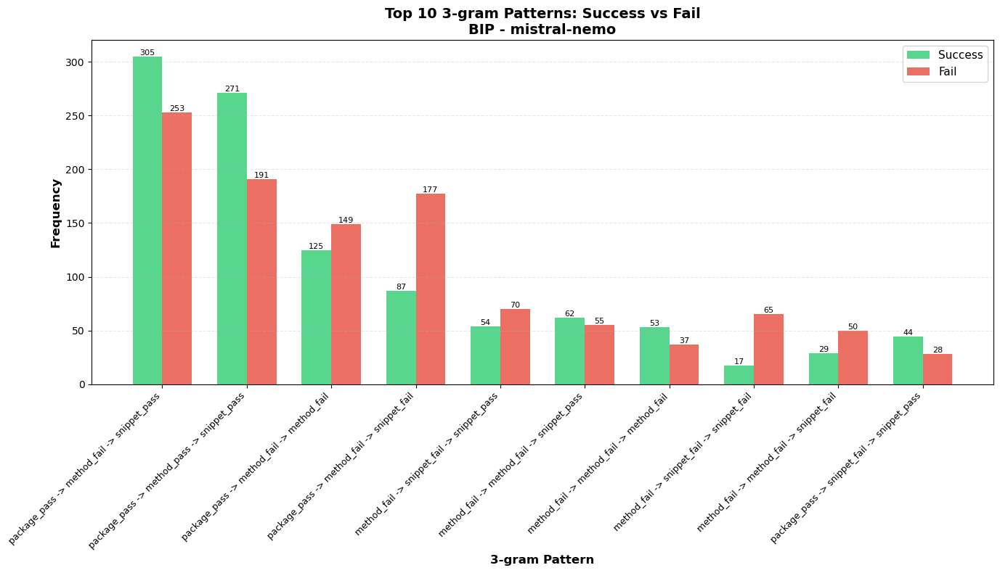


Benchmark: bip | Model: qwen2.5-coder


Total 3-grams collected: 2081

Total 3-grams from successful executions: 995

Total 3-grams from failed executions: 1086
                                     pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
 package_pass -> method_fail -> snippet_pass             415                 240              175         57.8%      42.2%
 package_pass -> method_pass -> snippet_pass             221                 137               84         62.0%      38.0%
 package_pass -> method_fail -> snippet_fail             179                  52              127         29.1%      70.9%
  package_pass -> method_fail -> method_fail             128                  56               72         43.8%      56.2%
  method_fail -> snippet_fail -> method_fail              62                  22               40         35.5%      64.5%
 method_fail -> snippet_pass -> snippet_pass              61                  36               25   

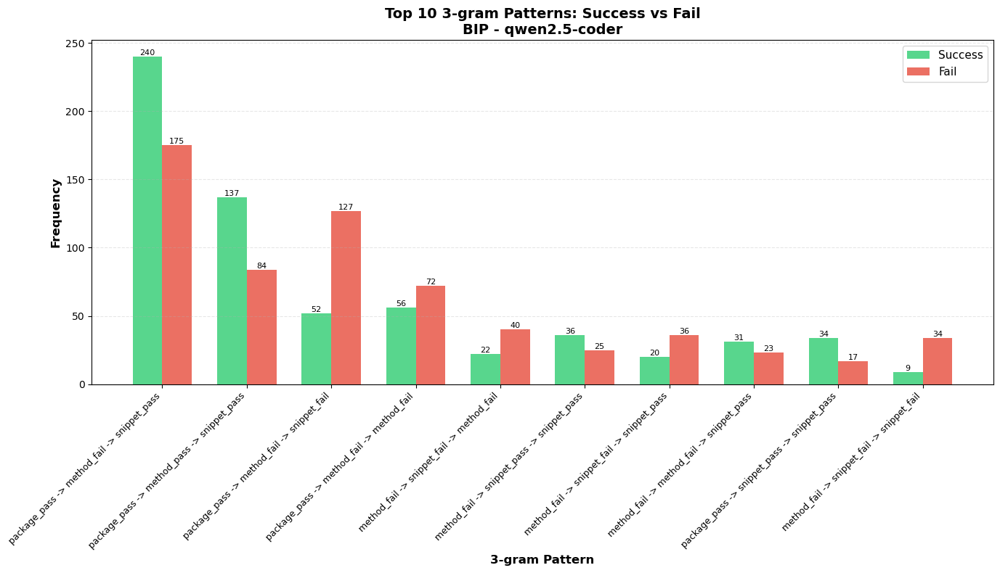

In [29]:
# Compare top 10 most frequent n-grams in all executions vs success/fail executions

import matplotlib.pyplot as plt
import numpy as np

# Function name mapping for readability
name_mapping = {
    'get_covered_packages_pass': 'package_pass',
    'get_failing_tests_covered_classes_pass': 'class_pass',
    'get_failing_tests_covered_methods_for_class_pass': 'method_pass',
    'get_code_snippet_pass': 'snippet_pass',
    'get_comments_pass': 'comment_pass',
    'get_covered_packages_fail': 'package_fail',
    'get_failing_tests_covered_classes_fail': 'class_fail',
    'get_failing_tests_covered_methods_for_class_fail': 'method_fail',
    'get_code_snippet_fail': 'snippet_fail',
    'get_comments_fail': 'comment_fail'
}

def shorten_pattern(pattern_tuple):
    """Convert long function names to short versions"""
    return ' -> '.join([name_mapping.get(func, func) for func in pattern_tuple])

# For each benchmark and model combination
n=3
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams, success_ngrams, fail_ngrams = get_ngrams_for_executions(bm, model, n)
        
        all_counter = Counter(all_ngrams)
        success_counter = Counter(success_ngrams)
        fail_counter = Counter(fail_ngrams)
        
        # Get top 10 from all executions
        top_10_patterns = [pattern for pattern, count in all_counter.most_common(10)]
        
        # Create comparison table
        comparison_data = []
        for pattern in top_10_patterns:
            all_count = all_counter[pattern]
            success_count = success_counter[pattern]
            fail_count = fail_counter[pattern]
            
            comparison_data.append({
                'pattern': shorten_pattern(pattern),
                'all_executions': all_count,
                'success_executions': success_count,
                'fail_executions': fail_count,
                'success_ratio': f"{success_count/all_count*100:.1f}%" if all_count > 0 else "0%",
                'fail_ratio': f"{fail_count/all_count*100:.1f}%" if all_count > 0 else "0%"
            })
        
        # Display as DataFrame
        comparison_df = pd.DataFrame(comparison_data)
        print(comparison_df.to_string(index=False))
        print()
        
        # Create bar chart
        fig, ax = plt.subplots(figsize=(14, 8))
        
        patterns = comparison_df['pattern'].tolist()
        success_counts = comparison_df['success_executions'].tolist()
        fail_counts = comparison_df['fail_executions'].tolist()
        
        x = np.arange(len(patterns))
        width = 0.35
        
        bars1 = ax.bar(x - width/2, success_counts, width, label='Success', color='#2ecc71', alpha=0.8)
        bars2 = ax.bar(x + width/2, fail_counts, width, label='Fail', color='#e74c3c', alpha=0.8)
        
        ax.set_xlabel(f'{n}-gram Pattern', fontsize=12, fontweight='bold')
        ax.set_ylabel('Frequency', fontsize=12, fontweight='bold')
        ax.set_title(f'Top 10 {n}-gram Patterns: Success vs Fail\n{bm.upper()} - {model}', fontsize=14, fontweight='bold')
        ax.set_xticks(x)
        ax.set_xticklabels(patterns, rotation=45, ha='right', fontsize=9)
        ax.legend(fontsize=11)
        ax.grid(axis='y', alpha=0.3, linestyle='--')
        
        # Add value labels on bars
        for bars in [bars1, bars2]:
            for bar in bars:
                height = bar.get_height()
                if height > 0:
                    ax.text(bar.get_x() + bar.get_width()/2., height,
                           f'{int(height)}',
                           ha='center', va='bottom', fontsize=8)
        
        plt.tight_layout()
        plt.show()


Benchmark: d4j | Model: llama3


Total 3-grams collected: 2948

Total 3-grams from successful executions: 1609

Total 3-grams from failed executions: 1339


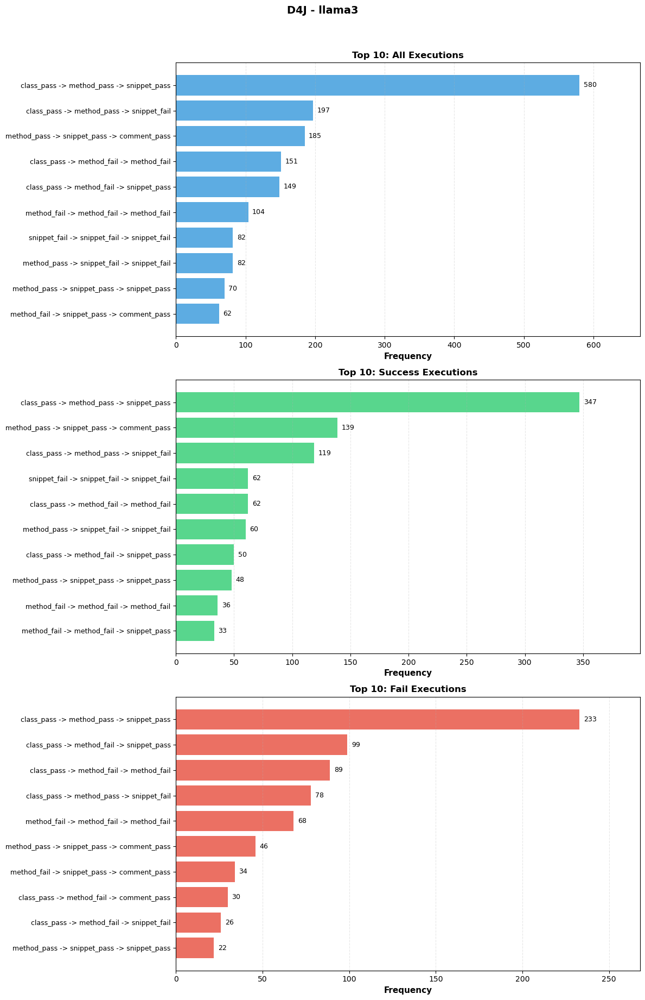


Benchmark: d4j | Model: llama3.1


Total 3-grams collected: 5521

Total 3-grams from successful executions: 2497

Total 3-grams from failed executions: 3024


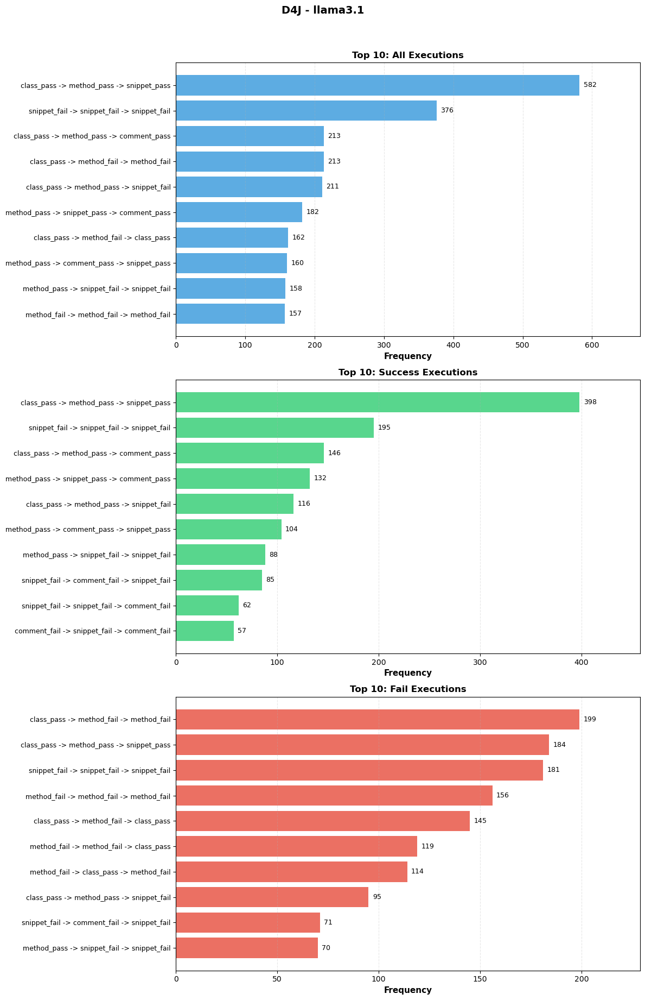


Benchmark: d4j | Model: mistral-nemo


Total 3-grams collected: 1751

Total 3-grams from successful executions: 826

Total 3-grams from failed executions: 925


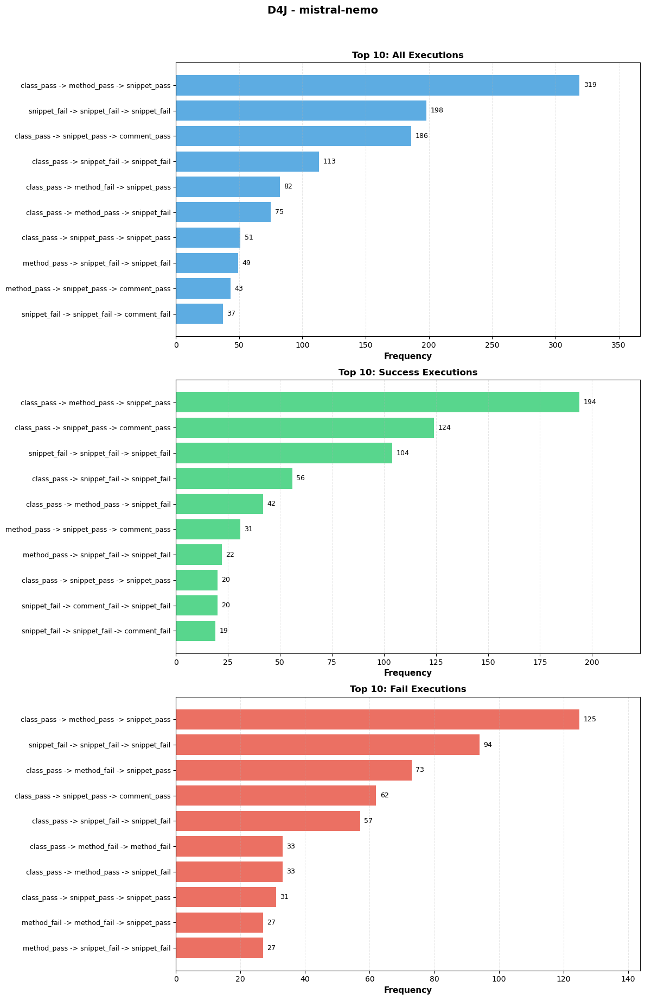


Benchmark: d4j | Model: qwen2.5-coder


Total 3-grams collected: 1893

Total 3-grams from successful executions: 975

Total 3-grams from failed executions: 918


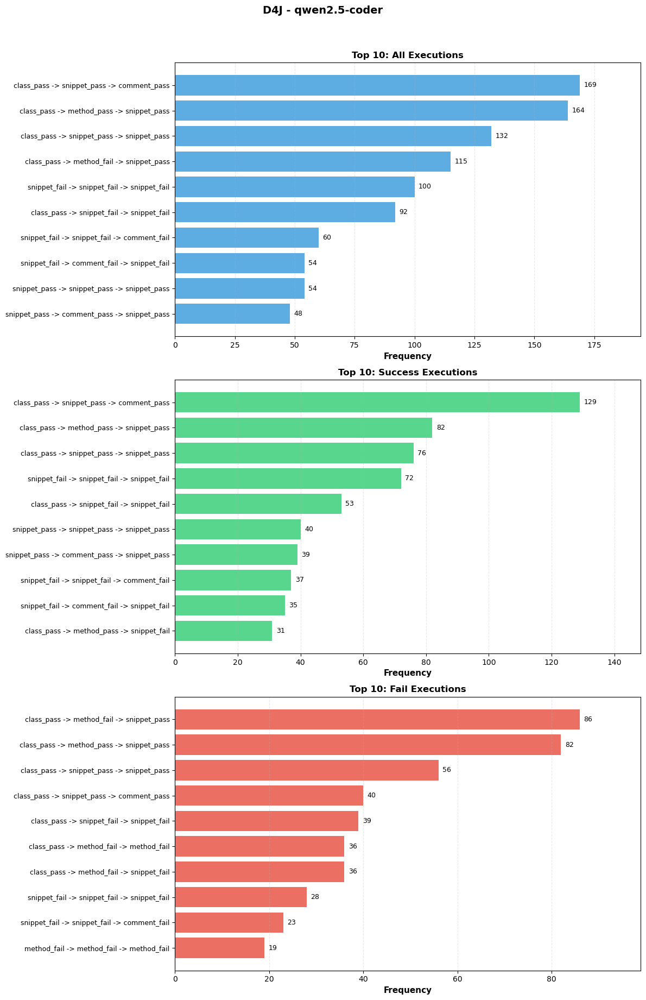


Benchmark: bip | Model: llama3


Total 3-grams collected: 3286

Total 3-grams from successful executions: 1593

Total 3-grams from failed executions: 1693


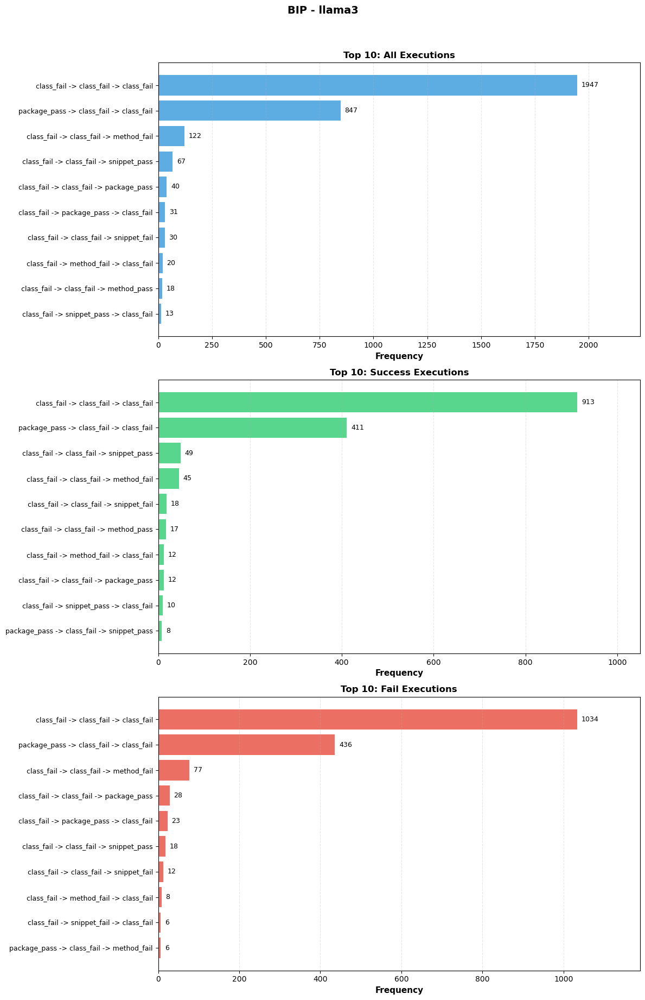


Benchmark: bip | Model: llama3.1


Total 3-grams collected: 8137

Total 3-grams from successful executions: 3597

Total 3-grams from failed executions: 4540


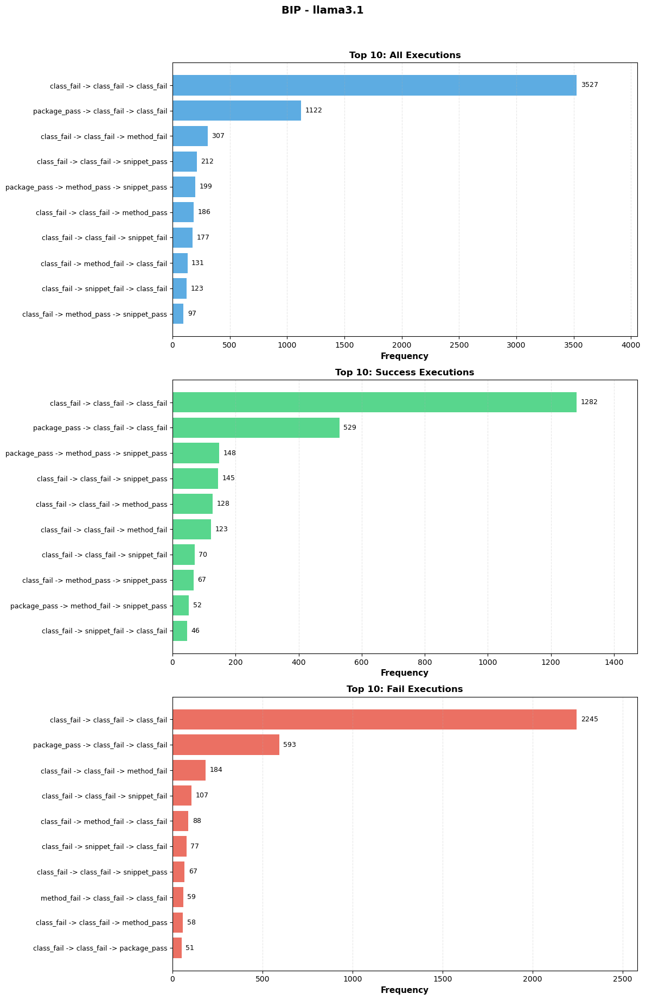


Benchmark: bip | Model: mistral-nemo


Total 3-grams collected: 3020

Total 3-grams from successful executions: 1384

Total 3-grams from failed executions: 1636


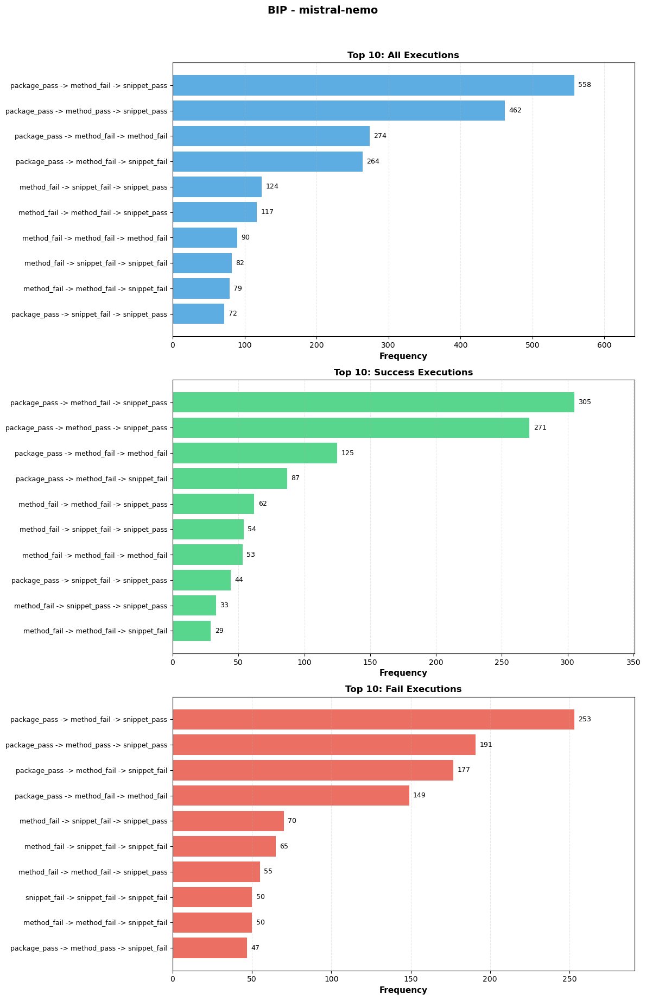


Benchmark: bip | Model: qwen2.5-coder


Total 3-grams collected: 2081

Total 3-grams from successful executions: 995

Total 3-grams from failed executions: 1086


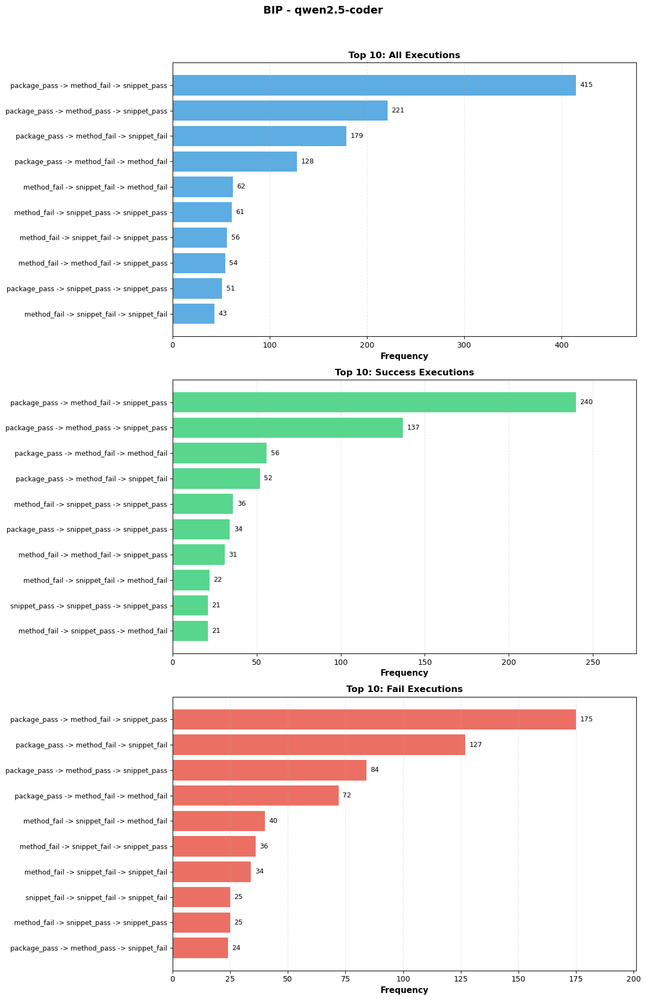

In [30]:
# Visualize Top 10 patterns separately for all/success/fail executions

import matplotlib.pyplot as plt
import numpy as np

# Function name mapping for readability
name_mapping = {
    'get_covered_packages_pass': 'package_pass',
    'get_failing_tests_covered_classes_pass': 'class_pass',
    'get_failing_tests_covered_methods_for_class_pass': 'method_pass',
    'get_code_snippet_pass': 'snippet_pass',
    'get_comments_pass': 'comment_pass',
    'get_covered_packages_fail': 'package_fail',
    'get_failing_tests_covered_classes_fail': 'class_fail',
    'get_failing_tests_covered_methods_for_class_fail': 'method_fail',
    'get_code_snippet_fail': 'snippet_fail',
    'get_comments_fail': 'comment_fail'
}

def shorten_pattern(pattern_tuple):
    """Convert long function names to short versions"""
    return ' -> '.join([name_mapping.get(func, func) for func in pattern_tuple])

# For each benchmark and model combination
n=3
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams, success_ngrams, fail_ngrams = get_ngrams_for_executions(bm, model, n)
        
        all_counter = Counter(all_ngrams)
        success_counter = Counter(success_ngrams)
        fail_counter = Counter(fail_ngrams)
        
        # Get top 10 from each counter
        top_10_all = [(shorten_pattern(pattern), count) for pattern, count in all_counter.most_common(10)]
        top_10_success = [(shorten_pattern(pattern), count) for pattern, count in success_counter.most_common(10)]
        top_10_fail = [(shorten_pattern(pattern), count) for pattern, count in fail_counter.most_common(10)]
        
        # Create 3 subplots
        fig, axes = plt.subplots(3, 1, figsize=(12, 18))
        
        # Plot 1: All Executions
        patterns_all = [p[0] for p in top_10_all]
        counts_all = [p[1] for p in top_10_all]
        
        axes[0].barh(range(len(patterns_all)), counts_all, color='#3498db', alpha=0.8)
        axes[0].set_yticks(range(len(patterns_all)))
        axes[0].set_yticklabels(patterns_all, fontsize=9)
        axes[0].set_xlabel('Frequency', fontsize=11, fontweight='bold')
        axes[0].set_title('Top 10: All Executions', fontsize=12, fontweight='bold')
        axes[0].invert_yaxis()
        axes[0].grid(axis='x', alpha=0.3, linestyle='--')

        axes[0].set_xlim(0, max(counts_all)*1.15)
        
        # Add value labels
        for i, v in enumerate(counts_all):
            axes[0].text(v + max(counts_all)*0.01, i, str(v), va='center', fontsize=9)
        
        # Plot 2: Success Executions
        patterns_success = [p[0] for p in top_10_success]
        counts_success = [p[1] for p in top_10_success]
        
        axes[1].barh(range(len(patterns_success)), counts_success, color='#2ecc71', alpha=0.8)
        axes[1].set_yticks(range(len(patterns_success)))
        axes[1].set_yticklabels(patterns_success, fontsize=9)
        axes[1].set_xlabel('Frequency', fontsize=11, fontweight='bold')
        axes[1].set_title('Top 10: Success Executions', fontsize=12, fontweight='bold')
        axes[1].invert_yaxis()
        axes[1].grid(axis='x', alpha=0.3, linestyle='--')

        axes[1].set_xlim(0, max(counts_success)*1.15)
        
        # Add value labels
        for i, v in enumerate(counts_success):
            axes[1].text(v + max(counts_success)*0.01, i, str(v), va='center', fontsize=9)
        
        # Plot 3: Fail Executions
        patterns_fail = [p[0] for p in top_10_fail]
        counts_fail = [p[1] for p in top_10_fail]
        
        axes[2].barh(range(len(patterns_fail)), counts_fail, color='#e74c3c', alpha=0.8)
        axes[2].set_yticks(range(len(patterns_fail)))
        axes[2].set_yticklabels(patterns_fail, fontsize=9)
        axes[2].set_xlabel('Frequency', fontsize=11, fontweight='bold')
        axes[2].set_title('Top 10: Fail Executions', fontsize=12, fontweight='bold')
        axes[2].invert_yaxis()
        axes[2].grid(axis='x', alpha=0.3, linestyle='--')

        axes[2].set_xlim(0, max(counts_fail)*1.15)
        
        # Add value labels
        for i, v in enumerate(counts_fail):
            axes[2].text(v + max(counts_fail)*0.01, i, str(v), va='center', fontsize=9)
        
        # Overall title
        fig.suptitle(f'{bm.upper()} - {model}', fontsize=14, fontweight='bold', y=1.02)
        
        plt.tight_layout()
        plt.show()

### Correaltion

In [4]:
n=5
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams, success_ngrams, fail_ngrams = get_ngrams_for_executions(bm, model, n)
        
        all_counter = Counter(all_ngrams)
        success_counter = Counter(success_ngrams)
        fail_counter = Counter(fail_ngrams)

        top_30_all = [pattern for pattern in all_counter.most_common(30)]
        
        correlation_data = []
        for pattern, freq in top_30_all:
            success_label = []
            ngram_presence = []
            for i in range(1, 11):
                if bm == 'd4j':
                    directory_path = f'./raw_data/autofl/d4j_autofl_eol_{i}/{model}'
                elif bm == 'bip':
                    directory_path = f'./raw_data/autofl/bip_cosmosfl_{i}/{model}'
                
                for json_file in os.listdir(directory_path):
                    with open(os.path.join(directory_path, json_file), 'r') as f:
                        data = json.load(f)
                    if 'messages' in data:
                        sequence = extract_function_call_sequence(data['messages'])
                        ngrams = get_ngrams(sequence, n)
                        execution_success = get_result_of_execution(data["buggy_methods"])

                        if execution_success:
                            success_label.append(1)
                        else:
                            success_label.append(0)
                        if pattern in ngrams:
                            ngram_presence.append(1)
                        else:
                            ngram_presence.append(0)
            # print(success_label)
            # print(ngram_presence)
            correlation, p_value = pointbiserialr(success_label, ngram_presence)
            correlation_data.append({
                'pattern': pattern,
                'correlation': correlation,
                'p-value': p_value
            })

        correlation_df = pd.DataFrame(correlation_data)
        output_dir = f'./correlation/autofl/{n}-gram/{bm}/{model}'
        os.makedirs(output_dir, exist_ok=True)
        correlation_df.to_csv(os.path.join(output_dir, 'correlation_call_ok.csv'), index=False)
        print(f"Saved {os.path.join(output_dir, 'correlation_call_ok.csv')}")




Benchmark: d4j | Model: llama3


Total 5-grams collected: 879

Total 5-grams from successful executions: 518

Total 5-grams from failed executions: 361
Saved ./correlation/autofl/5-gram/d4j/llama3/correlation_call_ok.csv

Benchmark: d4j | Model: llama3.1


Total 5-grams collected: 2705

Total 5-grams from successful executions: 1086

Total 5-grams from failed executions: 1619
Saved ./correlation/autofl/5-gram/d4j/llama3.1/correlation_call_ok.csv

Benchmark: d4j | Model: mistral-nemo


Total 5-grams collected: 367

Total 5-grams from successful executions: 167

Total 5-grams from failed executions: 200
Saved ./correlation/autofl/5-gram/d4j/mistral-nemo/correlation_call_ok.csv

Benchmark: d4j | Model: qwen2.5-coder


Total 5-grams collected: 470

Total 5-grams from successful executions: 256

Total 5-grams from failed executions: 214
Saved ./correlation/autofl/5-gram/d4j/qwen2.5-coder/correlation_call_ok.csv

Benchmark: bip | Model: llama3


Total 5-grams collected: 1629

Total 5-grams 

In [32]:
n=4
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams, success_ngrams, fail_ngrams = get_ngrams_for_executions(bm, model, n)
        
        all_counter = Counter(all_ngrams)
        success_counter = Counter(success_ngrams)
        fail_counter = Counter(fail_ngrams)

        top_30_all = [pattern for pattern in all_counter.most_common(30)]
        
        correlation_data = []
        for pattern, freq in top_30_all:
            success_label = []
            ngram_presence = []
            for i in range(1, 11):
                if bm == 'd4j':
                    directory_path = f'./raw_data/autofl/d4j_autofl_eol_{i}/{model}'
                elif bm == 'bip':
                    directory_path = f'./raw_data/autofl/bip_cosmosfl_{i}/{model}'
                
                for json_file in os.listdir(directory_path):
                    with open(os.path.join(directory_path, json_file), 'r') as f:
                        data = json.load(f)
                    if 'messages' in data:
                        sequence = extract_function_call_sequence(data['messages'])
                        ngrams = get_ngrams(sequence, n)
                        execution_success = get_result_of_execution(data["buggy_methods"])

                        if execution_success:
                            success_label.append(1)
                        else:
                            success_label.append(0)
                        if pattern in ngrams:
                            ngram_presence.append(1)
                        else:
                            ngram_presence.append(0)
            # print(success_label)
            # print(ngram_presence)
            correlation, p_value = pointbiserialr(success_label, ngram_presence)
            correlation_data.append({
                'pattern': pattern,
                'correlation': correlation,
                'p-value': p_value
            })

        correlation_df = pd.DataFrame(correlation_data)
        output_dir = f'./correlation/autofl/{n}-gram/{bm}/{model}'
        os.makedirs(output_dir, exist_ok=True)
        correlation_df.to_csv(os.path.join(output_dir, 'correlation_call_ok.csv'), index=False)
        print(f"Saved {os.path.join(output_dir, 'correlation_call_ok.csv')}")




        





Benchmark: d4j | Model: llama3


Total 4-grams collected: 1646

Total 4-grams from successful executions: 950

Total 4-grams from failed executions: 696
Saved ./correlation/autofl/4-gram/d4j/llama3/correlation_call_ok.csv

Benchmark: d4j | Model: llama3.1


Total 4-grams collected: 3898

Total 4-grams from successful executions: 1663

Total 4-grams from failed executions: 2235
Saved ./correlation/autofl/4-gram/d4j/llama3.1/correlation_call_ok.csv

Benchmark: d4j | Model: mistral-nemo


Total 4-grams collected: 753

Total 4-grams from successful executions: 330

Total 4-grams from failed executions: 423
Saved ./correlation/autofl/4-gram/d4j/mistral-nemo/correlation_call_ok.csv

Benchmark: d4j | Model: qwen2.5-coder


Total 4-grams collected: 957

Total 4-grams from successful executions: 503

Total 4-grams from failed executions: 454
Saved ./correlation/autofl/4-gram/d4j/qwen2.5-coder/correlation_call_ok.csv

Benchmark: bip | Model: llama3


Total 4-grams collected: 2410

Total 4-grams

In [33]:
n=3
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams, success_ngrams, fail_ngrams = get_ngrams_for_executions(bm, model, n)
        
        all_counter = Counter(all_ngrams)
        success_counter = Counter(success_ngrams)
        fail_counter = Counter(fail_ngrams)

        top_30_all = [pattern for pattern in all_counter.most_common(30)]
        
        correlation_data = []
        for pattern, freq in top_30_all:
            success_label = []
            ngram_presence = []
            for i in range(1, 11):
                if bm == 'd4j':
                    directory_path = f'./raw_data/autofl/d4j_autofl_eol_{i}/{model}'
                elif bm == 'bip':
                    directory_path = f'./raw_data/autofl/bip_cosmosfl_{i}/{model}'
                
                for json_file in os.listdir(directory_path):
                    with open(os.path.join(directory_path, json_file), 'r') as f:
                        data = json.load(f)
                    if 'messages' in data:
                        sequence = extract_function_call_sequence(data['messages'])
                        ngrams = get_ngrams(sequence, n)
                        execution_success = get_result_of_execution(data["buggy_methods"])

                        if execution_success:
                            success_label.append(1)
                        else:
                            success_label.append(0)
                        if pattern in ngrams:
                            ngram_presence.append(1)
                        else:
                            ngram_presence.append(0)
            # print(success_label)
            # print(ngram_presence)
            correlation, p_value = pointbiserialr(success_label, ngram_presence)
            correlation_data.append({
                'pattern': pattern,
                'correlation': correlation,
                'p-value': p_value
            })

        correlation_df = pd.DataFrame(correlation_data)
        output_dir = f'./correlation/autofl/{n}-gram/{bm}/{model}'
        os.makedirs(output_dir, exist_ok=True)
        correlation_df.to_csv(os.path.join(output_dir, 'correlation_call_ok.csv'), index=False)
        print(f"Saved {os.path.join(output_dir, 'correlation_call_ok.csv')}")




        





Benchmark: d4j | Model: llama3


Total 3-grams collected: 2948

Total 3-grams from successful executions: 1609

Total 3-grams from failed executions: 1339
Saved ./correlation/autofl/3-gram/d4j/llama3/correlation_call_ok.csv

Benchmark: d4j | Model: llama3.1


Total 3-grams collected: 5521

Total 3-grams from successful executions: 2497

Total 3-grams from failed executions: 3024
Saved ./correlation/autofl/3-gram/d4j/llama3.1/correlation_call_ok.csv

Benchmark: d4j | Model: mistral-nemo


Total 3-grams collected: 1751

Total 3-grams from successful executions: 826

Total 3-grams from failed executions: 925
Saved ./correlation/autofl/3-gram/d4j/mistral-nemo/correlation_call_ok.csv

Benchmark: d4j | Model: qwen2.5-coder


Total 3-grams collected: 1893

Total 3-grams from successful executions: 975

Total 3-grams from failed executions: 918
Saved ./correlation/autofl/3-gram/d4j/qwen2.5-coder/correlation_call_ok.csv

Benchmark: bip | Model: llama3


Total 3-grams collected: 3286

Total 3-g

# Over all models
### 5-gram

In [34]:
# Get n-gram: frequencies for all benchmarks and models
n = 5
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    all_ngrams, all_success_ngrams, all_fail_ngrams = [], [], []
    for model in models:
        all_ngrams_from_model, all_success_ngrams_from_model, all_fail_ngrams_from_model = get_ngrams_for_executions(bm, model, n)
        all_ngrams.extend(all_ngrams_from_model)
        all_success_ngrams.extend(all_success_ngrams_from_model)
        all_fail_ngrams.extend(all_fail_ngrams_from_model)

    all_counter = Counter(all_ngrams)
    success_counter = Counter(all_success_ngrams)
    fail_counter = Counter(all_fail_ngrams)

    all_results = []
    success_results = []
    fail_results = []
    for ngram, count in all_counter.most_common():
        all_results.append({
            f'{n}gram': ngram,
            'frequency': count
        })
    for ngram, count in success_counter.most_common():
        success_results.append({
            f'{n}gram': ngram,
            'frequency': count
        })
    for ngram, count in fail_counter.most_common():
        fail_results.append({
            f'{n}gram': ngram,
            'frequency': count
        })
        
    
    all_df = pd.DataFrame(all_results)
    success_df = pd.DataFrame(success_results)
    fail_df = pd.DataFrame(fail_results)

    output_dir = f"./{n}gram_frequency/autofl/all_executions"
    os.makedirs(output_dir, exist_ok=True)
    output_file = os.path.join(output_dir, f"{bm}_{n}gram_frequencies_call_ok.csv")
    all_df.to_csv(output_file, index=False)
    print(f"Saved {output_file} with {len(all_df)} unique {n}-gram")

    output_dir = f"./{n}gram_frequency/autofl/success_executions"
    os.makedirs(output_dir, exist_ok=True)
    output_file = os.path.join(output_dir, f"{bm}_{n}gram_frequencies_call_ok.csv")
    success_df.to_csv(output_file, index=False)
    print(f"Saved {output_file} with {len(success_df)} unique {n}-gram")

    output_dir = f"./{n}gram_frequency/autofl/fail_executions"
    os.makedirs(output_dir, exist_ok=True)
    output_file = os.path.join(output_dir, f"{bm}_{n}gram_frequencies_call_ok.csv")
    fail_df.to_csv(output_file, index=False)
    print(f"Saved {output_file} with {len(fail_df)} unique {n}-gram")


Total 5-grams collected: 879

Total 5-grams from successful executions: 518

Total 5-grams from failed executions: 361

Total 5-grams collected: 2705

Total 5-grams from successful executions: 1086

Total 5-grams from failed executions: 1619

Total 5-grams collected: 367

Total 5-grams from successful executions: 167

Total 5-grams from failed executions: 200

Total 5-grams collected: 470

Total 5-grams from successful executions: 256

Total 5-grams from failed executions: 214
Saved ./5gram_frequency/autofl/all_executions/d4j_5gram_frequencies_call_ok.csv with 1250 unique 5-gram
Saved ./5gram_frequency/autofl/success_executions/d4j_5gram_frequencies_call_ok.csv with 669 unique 5-gram
Saved ./5gram_frequency/autofl/fail_executions/d4j_5gram_frequencies_call_ok.csv with 893 unique 5-gram

Total 5-grams collected: 1629

Total 5-grams from successful executions: 763

Total 5-grams from failed executions: 866

Total 5-grams collected: 5002

Total 5-grams from successful executions: 1990

T


Benchmark: d4j | Model: llama3


Total 5-grams collected: 879

Total 5-grams from successful executions: 518

Total 5-grams from failed executions: 361

Benchmark: d4j | Model: llama3.1


Total 5-grams collected: 2705

Total 5-grams from successful executions: 1086

Total 5-grams from failed executions: 1619

Benchmark: d4j | Model: mistral-nemo


Total 5-grams collected: 367

Total 5-grams from successful executions: 167

Total 5-grams from failed executions: 200

Benchmark: d4j | Model: qwen2.5-coder


Total 5-grams collected: 470

Total 5-grams from successful executions: 256

Total 5-grams from failed executions: 214
                                                                     pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
   class_pass -> method_pass -> snippet_fail -> snippet_fail -> snippet_fail             193                 122               71         63.2%      36.8%
snippet_fail -> snippet_fail -> snippet_fail -> snippet_fail

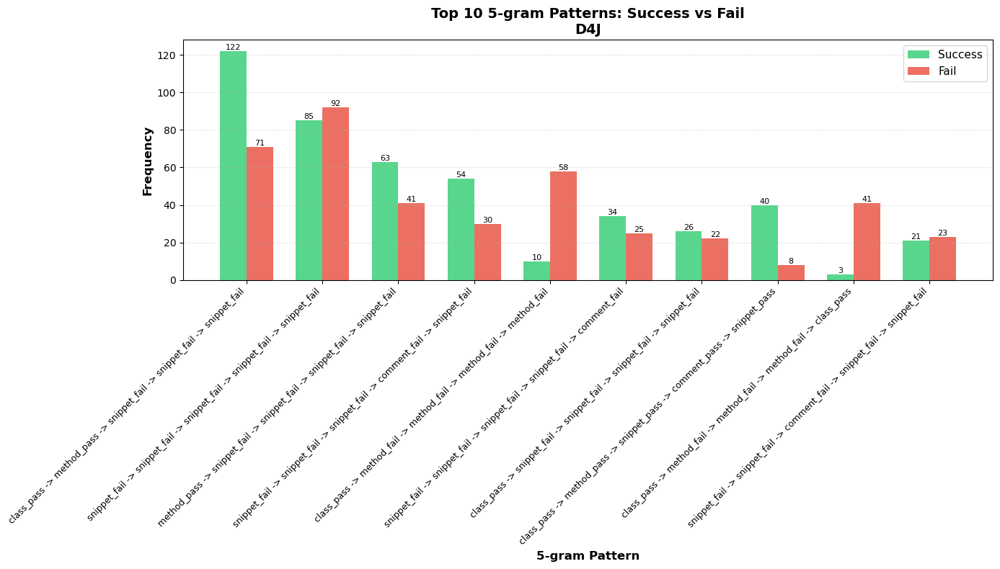


Benchmark: bip | Model: llama3


Total 5-grams collected: 1629

Total 5-grams from successful executions: 763

Total 5-grams from failed executions: 866

Benchmark: bip | Model: llama3.1


Total 5-grams collected: 5002

Total 5-grams from successful executions: 1990

Total 5-grams from failed executions: 3012

Benchmark: bip | Model: mistral-nemo


Total 5-grams collected: 378

Total 5-grams from successful executions: 133

Total 5-grams from failed executions: 245

Benchmark: bip | Model: qwen2.5-coder


Total 5-grams collected: 347

Total 5-grams from successful executions: 145

Total 5-grams from failed executions: 202
                                                              pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
   class_fail -> class_fail -> class_fail -> class_fail -> class_fail            2466                 845             1621         34.3%      65.7%
 package_pass -> class_fail -> class_fail -> class_fail -> class_fail    

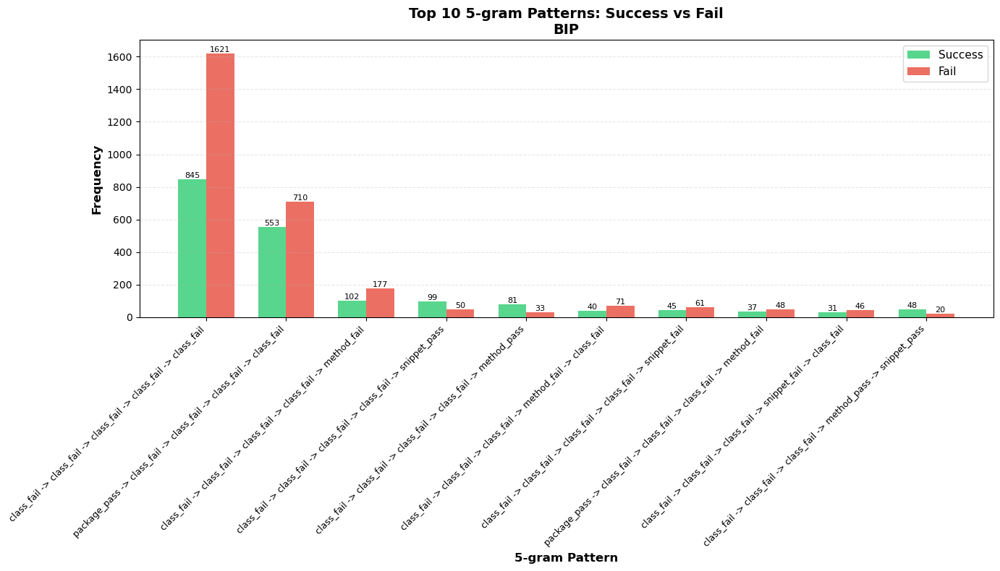

In [38]:
# Compare top 10 most frequent n-grams in all executions vs success/fail executions

import matplotlib.pyplot as plt
import numpy as np

# Function name mapping for readability
name_mapping = {
    'get_covered_packages_pass': 'package_pass',
    'get_failing_tests_covered_classes_pass': 'class_pass',
    'get_failing_tests_covered_methods_for_class_pass': 'method_pass',
    'get_code_snippet_pass': 'snippet_pass',
    'get_comments_pass': 'comment_pass',
    'get_covered_packages_fail': 'package_fail',
    'get_failing_tests_covered_classes_fail': 'class_fail',
    'get_failing_tests_covered_methods_for_class_fail': 'method_fail',
    'get_code_snippet_fail': 'snippet_fail',
    'get_comments_fail': 'comment_fail'
}

def shorten_pattern(pattern_tuple):
    """Convert long function names to short versions"""
    return ' -> '.join([name_mapping.get(func, func) for func in pattern_tuple])

# For each benchmark and model combination
n=5
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    all_ngrams, success_ngrams, fail_ngrams = [], [], []
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams_from_model, success_ngrams_from_model, fail_ngrams_from_model = get_ngrams_for_executions(bm, model, n)
        
        all_ngrams.extend(all_ngrams_from_model)
        success_ngrams.extend(success_ngrams_from_model)
        fail_ngrams.extend(fail_ngrams_from_model)

    all_counter = Counter(all_ngrams)
    success_counter = Counter(success_ngrams)
    fail_counter = Counter(fail_ngrams)
    
    # Get top 10 from all executions
    top_10_patterns = [pattern for pattern, count in all_counter.most_common(10)]
    
    # Create comparison table
    comparison_data = []
    for pattern in top_10_patterns:
        all_count = all_counter[pattern]
        success_count = success_counter[pattern]
        fail_count = fail_counter[pattern]
        
        comparison_data.append({
            'pattern': shorten_pattern(pattern),
            'all_executions': all_count,
            'success_executions': success_count,
            'fail_executions': fail_count,
            'success_ratio': f"{success_count/all_count*100:.1f}%" if all_count > 0 else "0%",
            'fail_ratio': f"{fail_count/all_count*100:.1f}%" if all_count > 0 else "0%"
        })
    
    # Display as DataFrame
    comparison_df = pd.DataFrame(comparison_data)
    print(comparison_df.to_string(index=False))
    print()
    
    # Create bar chart
    fig, ax = plt.subplots(figsize=(14, 8))
    
    patterns = comparison_df['pattern'].tolist()
    success_counts = comparison_df['success_executions'].tolist()
    fail_counts = comparison_df['fail_executions'].tolist()
    
    x = np.arange(len(patterns))
    width = 0.35
    
    bars1 = ax.bar(x - width/2, success_counts, width, label='Success', color='#2ecc71', alpha=0.8)
    bars2 = ax.bar(x + width/2, fail_counts, width, label='Fail', color='#e74c3c', alpha=0.8)
    
    ax.set_xlabel(f'{n}-gram Pattern', fontsize=12, fontweight='bold')
    ax.set_ylabel('Frequency', fontsize=12, fontweight='bold')
    ax.set_title(f'Top 10 {n}-gram Patterns: Success vs Fail\n{bm.upper()}', fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(patterns, rotation=45, ha='right', fontsize=9)
    ax.legend(fontsize=11)
    ax.grid(axis='y', alpha=0.3, linestyle='--')
    
    # Add value labels on bars
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            if height > 0:
                ax.text(bar.get_x() + bar.get_width()/2., height,
                        f'{int(height)}',
                        ha='center', va='bottom', fontsize=8)
    
    plt.tight_layout()
    plt.show()


Benchmark: d4j | Model: llama3


Total 5-grams collected: 879

Total 5-grams from successful executions: 518

Total 5-grams from failed executions: 361

Benchmark: d4j | Model: llama3.1


Total 5-grams collected: 2705

Total 5-grams from successful executions: 1086

Total 5-grams from failed executions: 1619

Benchmark: d4j | Model: mistral-nemo


Total 5-grams collected: 367

Total 5-grams from successful executions: 167

Total 5-grams from failed executions: 200

Benchmark: d4j | Model: qwen2.5-coder


Total 5-grams collected: 470

Total 5-grams from successful executions: 256

Total 5-grams from failed executions: 214


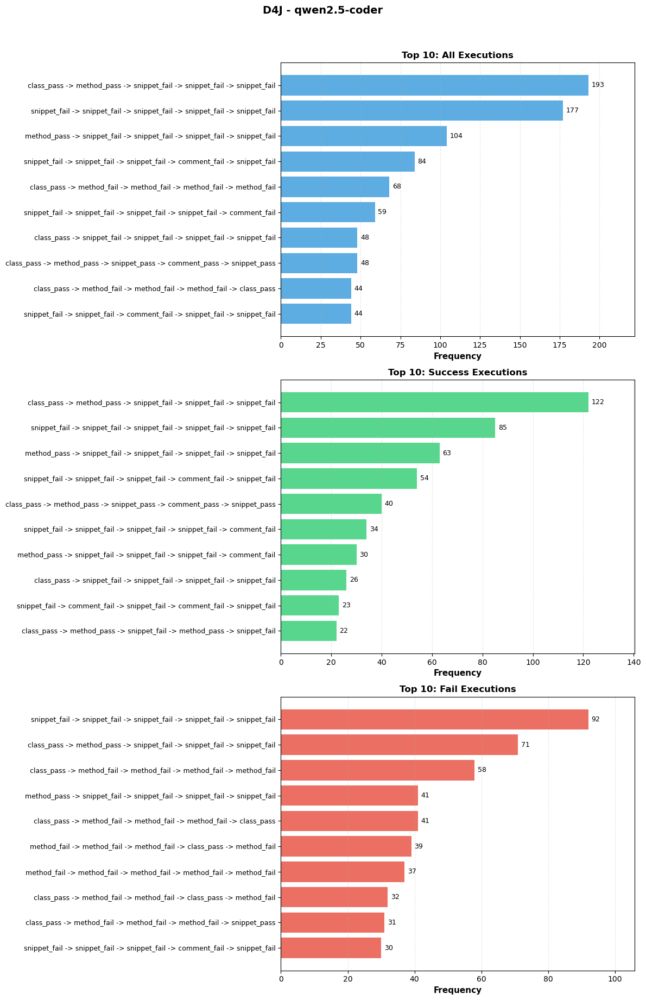


Benchmark: bip | Model: llama3


Total 5-grams collected: 1629

Total 5-grams from successful executions: 763

Total 5-grams from failed executions: 866

Benchmark: bip | Model: llama3.1


Total 5-grams collected: 5002

Total 5-grams from successful executions: 1990

Total 5-grams from failed executions: 3012

Benchmark: bip | Model: mistral-nemo


Total 5-grams collected: 378

Total 5-grams from successful executions: 133

Total 5-grams from failed executions: 245

Benchmark: bip | Model: qwen2.5-coder


Total 5-grams collected: 347

Total 5-grams from successful executions: 145

Total 5-grams from failed executions: 202


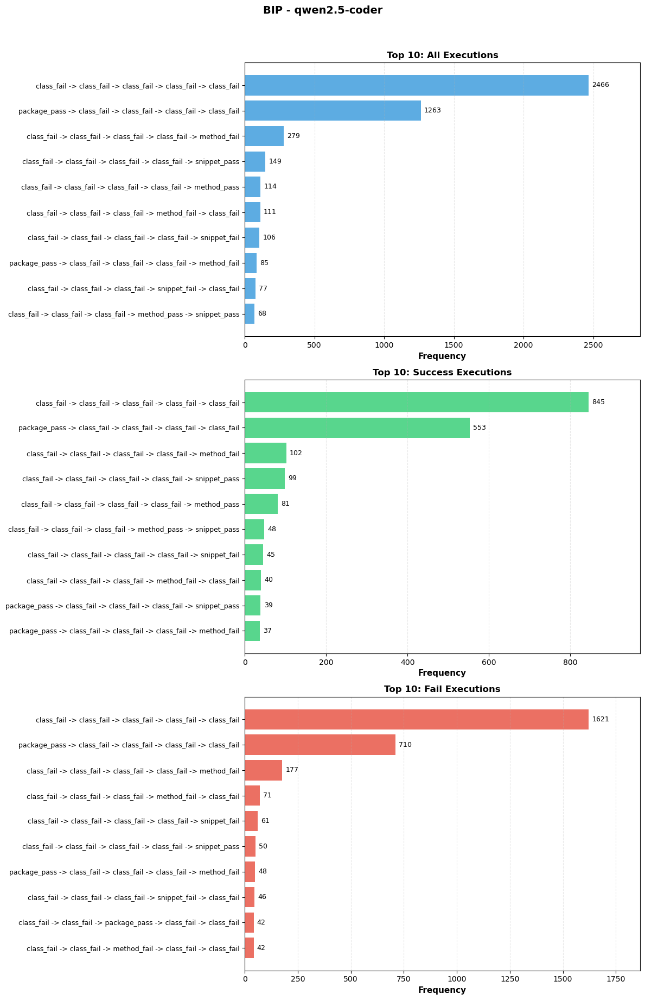

In [39]:
# Visualize Top 10 patterns separately for all/success/fail executions

import matplotlib.pyplot as plt
import numpy as np

# Function name mapping for readability
name_mapping = {
    'get_covered_packages_pass': 'package_pass',
    'get_failing_tests_covered_classes_pass': 'class_pass',
    'get_failing_tests_covered_methods_for_class_pass': 'method_pass',
    'get_code_snippet_pass': 'snippet_pass',
    'get_comments_pass': 'comment_pass',
    'get_covered_packages_fail': 'package_fail',
    'get_failing_tests_covered_classes_fail': 'class_fail',
    'get_failing_tests_covered_methods_for_class_fail': 'method_fail',
    'get_code_snippet_fail': 'snippet_fail',
    'get_comments_fail': 'comment_fail'
}

def shorten_pattern(pattern_tuple):
    """Convert long function names to short versions"""
    return ' -> '.join([name_mapping.get(func, func) for func in pattern_tuple])

# For each benchmark and model combination
n=5
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    all_ngrams, success_ngrams, fail_ngrams = [], [], []
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams_from_model, success_ngrams_from_model, fail_ngrams_from_model = get_ngrams_for_executions(bm, model, n)
        
        all_ngrams.extend(all_ngrams_from_model)
        success_ngrams.extend(success_ngrams_from_model)
        fail_ngrams.extend(fail_ngrams_from_model)
        
    all_counter = Counter(all_ngrams)
    success_counter = Counter(success_ngrams)
    fail_counter = Counter(fail_ngrams)
    
    # Get top 10 from each counter
    top_10_all = [(shorten_pattern(pattern), count) for pattern, count in all_counter.most_common(10)]
    top_10_success = [(shorten_pattern(pattern), count) for pattern, count in success_counter.most_common(10)]
    top_10_fail = [(shorten_pattern(pattern), count) for pattern, count in fail_counter.most_common(10)]
    
    # Create 3 subplots
    fig, axes = plt.subplots(3, 1, figsize=(12, 18))
    
    # Plot 1: All Executions
    patterns_all = [p[0] for p in top_10_all]
    counts_all = [p[1] for p in top_10_all]
    
    axes[0].barh(range(len(patterns_all)), counts_all, color='#3498db', alpha=0.8)
    axes[0].set_yticks(range(len(patterns_all)))
    axes[0].set_yticklabels(patterns_all, fontsize=9)
    axes[0].set_xlabel('Frequency', fontsize=11, fontweight='bold')
    axes[0].set_title('Top 10: All Executions', fontsize=12, fontweight='bold')
    axes[0].invert_yaxis()
    axes[0].grid(axis='x', alpha=0.3, linestyle='--')

    axes[0].set_xlim(0, max(counts_all)*1.15)
    
    # Add value labels
    for i, v in enumerate(counts_all):
        axes[0].text(v + max(counts_all)*0.01, i, str(v), va='center', fontsize=9)
    
    # Plot 2: Success Executions
    patterns_success = [p[0] for p in top_10_success]
    counts_success = [p[1] for p in top_10_success]
    
    axes[1].barh(range(len(patterns_success)), counts_success, color='#2ecc71', alpha=0.8)
    axes[1].set_yticks(range(len(patterns_success)))
    axes[1].set_yticklabels(patterns_success, fontsize=9)
    axes[1].set_xlabel('Frequency', fontsize=11, fontweight='bold')
    axes[1].set_title('Top 10: Success Executions', fontsize=12, fontweight='bold')
    axes[1].invert_yaxis()
    axes[1].grid(axis='x', alpha=0.3, linestyle='--')

    axes[1].set_xlim(0, max(counts_success)*1.15)
    
    # Add value labels
    for i, v in enumerate(counts_success):
        axes[1].text(v + max(counts_success)*0.01, i, str(v), va='center', fontsize=9)
    
    # Plot 3: Fail Executions
    patterns_fail = [p[0] for p in top_10_fail]
    counts_fail = [p[1] for p in top_10_fail]
    
    axes[2].barh(range(len(patterns_fail)), counts_fail, color='#e74c3c', alpha=0.8)
    axes[2].set_yticks(range(len(patterns_fail)))
    axes[2].set_yticklabels(patterns_fail, fontsize=9)
    axes[2].set_xlabel('Frequency', fontsize=11, fontweight='bold')
    axes[2].set_title('Top 10: Fail Executions', fontsize=12, fontweight='bold')
    axes[2].invert_yaxis()
    axes[2].grid(axis='x', alpha=0.3, linestyle='--')

    axes[2].set_xlim(0, max(counts_fail)*1.15)
    
    # Add value labels
    for i, v in enumerate(counts_fail):
        axes[2].text(v + max(counts_fail)*0.01, i, str(v), va='center', fontsize=9)
    
    # Overall title
    fig.suptitle(f'{bm.upper()} - {model}', fontsize=14, fontweight='bold', y=1.02)
    
    plt.tight_layout()
    plt.show()

In [5]:
n=5
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    all_ngrams, success_ngrams, fail_ngrams = [], [], []    
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams_from_model, success_ngrams_from_model, fail_ngrams_from_model = get_ngrams_for_executions(bm, model, n)
        
        all_ngrams.extend(all_ngrams_from_model)
        success_ngrams.extend(success_ngrams_from_model)
        fail_ngrams.extend(fail_ngrams_from_model)

    all_counter = Counter(all_ngrams)
    success_counter = Counter(success_ngrams)
    fail_counter = Counter(fail_ngrams)

    top_30_all = [pattern for pattern in all_counter.most_common(30)]
    
    correlation_data = []
    for pattern, freq in top_30_all:
        success_label = []
        ngram_presence = []
        for i in range(1, 11):
            for model in models:
                if bm == 'd4j':
                    directory_path = f'./raw_data/autofl/d4j_autofl_eol_{i}/{model}'
                elif bm == 'bip':
                    directory_path = f'./raw_data/autofl/bip_cosmosfl_{i}/{model}'
                
                for json_file in os.listdir(directory_path):
                    with open(os.path.join(directory_path, json_file), 'r') as f:
                        data = json.load(f)
                    if 'messages' in data:
                        sequence = extract_function_call_sequence(data['messages'])
                        ngrams = get_ngrams(sequence, n)
                        execution_success = get_result_of_execution(data["buggy_methods"])

                        if execution_success:
                            success_label.append(1)
                        else:
                            success_label.append(0)
                        if pattern in ngrams:
                            ngram_presence.append(1)
                        else:
                            ngram_presence.append(0)
        # print(success_label)
        # print(ngram_presence)
        correlation, p_value = pointbiserialr(success_label, ngram_presence)
        correlation_data.append({
            'pattern': pattern,
            'correlation': correlation,
            'p-value': p_value
        })

    correlation_df = pd.DataFrame(correlation_data)
    output_dir = f'./correlation/autofl/{n}-gram/{bm}'
    os.makedirs(output_dir, exist_ok=True)
    correlation_df.to_csv(os.path.join(output_dir, 'correlation_call_ok.csv'), index=False)
    print(f"Saved {os.path.join(output_dir, 'correlation_call_ok.csv')}")


Benchmark: d4j | Model: llama3


Total 5-grams collected: 879

Total 5-grams from successful executions: 518

Total 5-grams from failed executions: 361

Benchmark: d4j | Model: llama3.1


Total 5-grams collected: 2705

Total 5-grams from successful executions: 1086

Total 5-grams from failed executions: 1619

Benchmark: d4j | Model: mistral-nemo


Total 5-grams collected: 367

Total 5-grams from successful executions: 167

Total 5-grams from failed executions: 200

Benchmark: d4j | Model: qwen2.5-coder


Total 5-grams collected: 470

Total 5-grams from successful executions: 256

Total 5-grams from failed executions: 214
Saved ./correlation/autofl/5-gram/d4j/correlation_call_ok.csv

Benchmark: bip | Model: llama3


Total 5-grams collected: 1629

Total 5-grams from successful executions: 763

Total 5-grams from failed executions: 866

Benchmark: bip | Model: llama3.1


Total 5-grams collected: 5002

Total 5-grams from successful executions: 1990

Total 5-grams from failed executions: 3

### 4-gram

In [6]:
# Get n-gram: frequencies for all benchmarks and models
n = 4
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    all_ngrams, all_success_ngrams, all_fail_ngrams = [], [], []
    for model in models:
        all_ngrams_from_model, all_success_ngrams_from_model, all_fail_ngrams_from_model = get_ngrams_for_executions(bm, model, n)
        all_ngrams.extend(all_ngrams_from_model)
        all_success_ngrams.extend(all_success_ngrams_from_model)
        all_fail_ngrams.extend(all_fail_ngrams_from_model)

    all_counter = Counter(all_ngrams)
    success_counter = Counter(all_success_ngrams)
    fail_counter = Counter(all_fail_ngrams)

    all_results = []
    success_results = []
    fail_results = []
    for ngram, count in all_counter.most_common():
        all_results.append({
            f'{n}gram': ngram,
            'frequency': count
        })
    for ngram, count in success_counter.most_common():
        success_results.append({
            f'{n}gram': ngram,
            'frequency': count
        })
    for ngram, count in fail_counter.most_common():
        fail_results.append({
            f'{n}gram': ngram,
            'frequency': count
        })
        
    
    all_df = pd.DataFrame(all_results)
    success_df = pd.DataFrame(success_results)
    fail_df = pd.DataFrame(fail_results)

    output_dir = f"./{n}gram_frequency/autofl/all_executions"
    os.makedirs(output_dir, exist_ok=True)
    output_file = os.path.join(output_dir, f"{bm}_{n}gram_frequencies_call_ok.csv")
    all_df.to_csv(output_file, index=False)
    print(f"Saved {output_file} with {len(all_df)} unique {n}-gram")

    output_dir = f"./{n}gram_frequency/autofl/success_executions"
    os.makedirs(output_dir, exist_ok=True)
    output_file = os.path.join(output_dir, f"{bm}_{n}gram_frequencies_call_ok.csv")
    success_df.to_csv(output_file, index=False)
    print(f"Saved {output_file} with {len(success_df)} unique {n}-gram")

    output_dir = f"./{n}gram_frequency/autofl/fail_executions"
    os.makedirs(output_dir, exist_ok=True)
    output_file = os.path.join(output_dir, f"{bm}_{n}gram_frequencies_call_ok.csv")
    fail_df.to_csv(output_file, index=False)
    print(f"Saved {output_file} with {len(fail_df)} unique {n}-gram")


Total 4-grams collected: 1646

Total 4-grams from successful executions: 950

Total 4-grams from failed executions: 696

Total 4-grams collected: 3898

Total 4-grams from successful executions: 1663

Total 4-grams from failed executions: 2235

Total 4-grams collected: 753

Total 4-grams from successful executions: 330

Total 4-grams from failed executions: 423

Total 4-grams collected: 957

Total 4-grams from successful executions: 503

Total 4-grams from failed executions: 454
Saved ./4gram_frequency/autofl/all_executions/d4j_4gram_frequencies_call_ok.csv with 856 unique 4-gram
Saved ./4gram_frequency/autofl/success_executions/d4j_4gram_frequencies_call_ok.csv with 527 unique 4-gram
Saved ./4gram_frequency/autofl/fail_executions/d4j_4gram_frequencies_call_ok.csv with 689 unique 4-gram

Total 4-grams collected: 2410

Total 4-grams from successful executions: 1152

Total 4-grams from failed executions: 1258

Total 4-grams collected: 6364

Total 4-grams from successful executions: 2662



Benchmark: d4j | Model: llama3


Total 4-grams collected: 1646

Total 4-grams from successful executions: 950

Total 4-grams from failed executions: 696

Benchmark: d4j | Model: llama3.1


Total 4-grams collected: 3898

Total 4-grams from successful executions: 1663

Total 4-grams from failed executions: 2235

Benchmark: d4j | Model: mistral-nemo


Total 4-grams collected: 753

Total 4-grams from successful executions: 330

Total 4-grams from failed executions: 423

Benchmark: d4j | Model: qwen2.5-coder


Total 4-grams collected: 957

Total 4-grams from successful executions: 503

Total 4-grams from failed executions: 454
                                                     pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
   class_pass -> method_pass -> snippet_pass -> comment_pass             401                 299              102         74.6%      25.4%
snippet_fail -> snippet_fail -> snippet_fail -> snippet_fail             358               

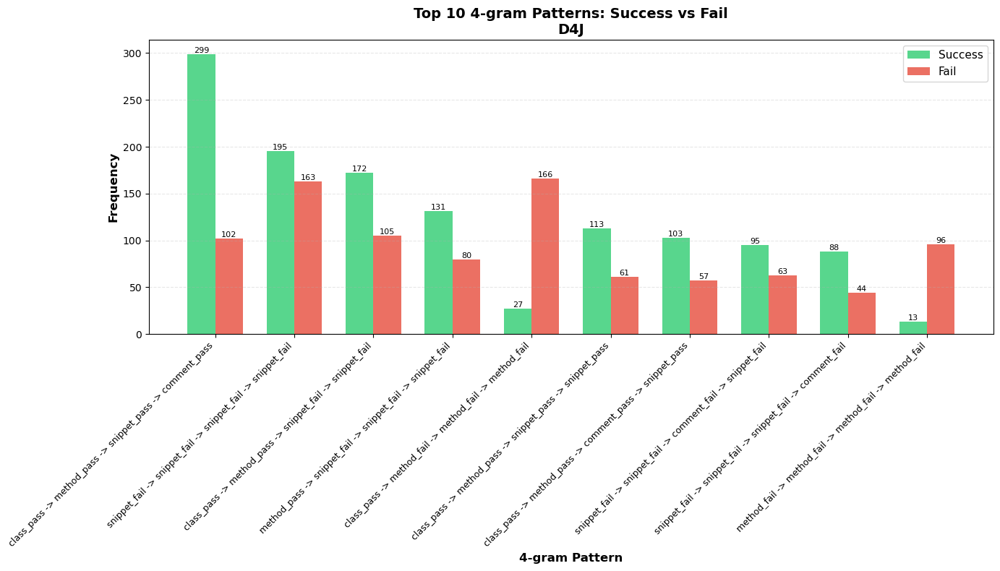


Benchmark: bip | Model: llama3


Total 4-grams collected: 2410

Total 4-grams from successful executions: 1152

Total 4-grams from failed executions: 1258

Benchmark: bip | Model: llama3.1


Total 4-grams collected: 6364

Total 4-grams from successful executions: 2662

Total 4-grams from failed executions: 3702

Benchmark: bip | Model: mistral-nemo


Total 4-grams collected: 1121

Total 4-grams from successful executions: 441

Total 4-grams from failed executions: 680

Benchmark: bip | Model: qwen2.5-coder


Total 4-grams collected: 854

Total 4-grams from successful executions: 370

Total 4-grams from failed executions: 484
                                                    pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
       class_fail -> class_fail -> class_fail -> class_fail            3759                1408             2351         37.5%      62.5%
     package_pass -> class_fail -> class_fail -> class_fail            1659               

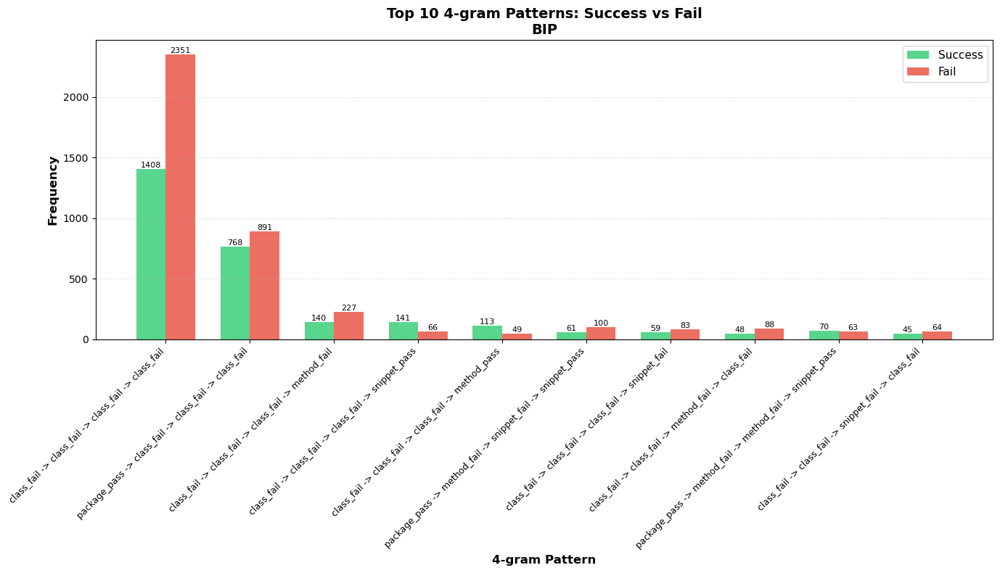

In [7]:
# Compare top 10 most frequent n-grams in all executions vs success/fail executions

import matplotlib.pyplot as plt
import numpy as np

# Function name mapping for readability
name_mapping = {
    'get_covered_packages_pass': 'package_pass',
    'get_failing_tests_covered_classes_pass': 'class_pass',
    'get_failing_tests_covered_methods_for_class_pass': 'method_pass',
    'get_code_snippet_pass': 'snippet_pass',
    'get_comments_pass': 'comment_pass',
    'get_covered_packages_fail': 'package_fail',
    'get_failing_tests_covered_classes_fail': 'class_fail',
    'get_failing_tests_covered_methods_for_class_fail': 'method_fail',
    'get_code_snippet_fail': 'snippet_fail',
    'get_comments_fail': 'comment_fail'
}

def shorten_pattern(pattern_tuple):
    """Convert long function names to short versions"""
    return ' -> '.join([name_mapping.get(func, func) for func in pattern_tuple])

# For each benchmark and model combination
n=4
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    all_ngrams, success_ngrams, fail_ngrams = [], [], []
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams_from_model, success_ngrams_from_model, fail_ngrams_from_model = get_ngrams_for_executions(bm, model, n)
        
        all_ngrams.extend(all_ngrams_from_model)
        success_ngrams.extend(success_ngrams_from_model)
        fail_ngrams.extend(fail_ngrams_from_model)

    all_counter = Counter(all_ngrams)
    success_counter = Counter(success_ngrams)
    fail_counter = Counter(fail_ngrams)
    
    # Get top 10 from all executions
    top_10_patterns = [pattern for pattern, count in all_counter.most_common(10)]
    
    # Create comparison table
    comparison_data = []
    for pattern in top_10_patterns:
        all_count = all_counter[pattern]
        success_count = success_counter[pattern]
        fail_count = fail_counter[pattern]
        
        comparison_data.append({
            'pattern': shorten_pattern(pattern),
            'all_executions': all_count,
            'success_executions': success_count,
            'fail_executions': fail_count,
            'success_ratio': f"{success_count/all_count*100:.1f}%" if all_count > 0 else "0%",
            'fail_ratio': f"{fail_count/all_count*100:.1f}%" if all_count > 0 else "0%"
        })
    
    # Display as DataFrame
    comparison_df = pd.DataFrame(comparison_data)
    print(comparison_df.to_string(index=False))
    print()
    
    # Create bar chart
    fig, ax = plt.subplots(figsize=(14, 8))
    
    patterns = comparison_df['pattern'].tolist()
    success_counts = comparison_df['success_executions'].tolist()
    fail_counts = comparison_df['fail_executions'].tolist()
    
    x = np.arange(len(patterns))
    width = 0.35
    
    bars1 = ax.bar(x - width/2, success_counts, width, label='Success', color='#2ecc71', alpha=0.8)
    bars2 = ax.bar(x + width/2, fail_counts, width, label='Fail', color='#e74c3c', alpha=0.8)
    
    ax.set_xlabel(f'{n}-gram Pattern', fontsize=12, fontweight='bold')
    ax.set_ylabel('Frequency', fontsize=12, fontweight='bold')
    ax.set_title(f'Top 10 {n}-gram Patterns: Success vs Fail\n{bm.upper()}', fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(patterns, rotation=45, ha='right', fontsize=9)
    ax.legend(fontsize=11)
    ax.grid(axis='y', alpha=0.3, linestyle='--')
    
    # Add value labels on bars
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            if height > 0:
                ax.text(bar.get_x() + bar.get_width()/2., height,
                        f'{int(height)}',
                        ha='center', va='bottom', fontsize=8)
    
    plt.tight_layout()
    plt.show()


Benchmark: d4j | Model: llama3


Total 4-grams collected: 1646

Total 4-grams from successful executions: 950

Total 4-grams from failed executions: 696

Benchmark: d4j | Model: llama3.1


Total 4-grams collected: 3898

Total 4-grams from successful executions: 1663

Total 4-grams from failed executions: 2235

Benchmark: d4j | Model: mistral-nemo


Total 4-grams collected: 753

Total 4-grams from successful executions: 330

Total 4-grams from failed executions: 423

Benchmark: d4j | Model: qwen2.5-coder


Total 4-grams collected: 957

Total 4-grams from successful executions: 503

Total 4-grams from failed executions: 454


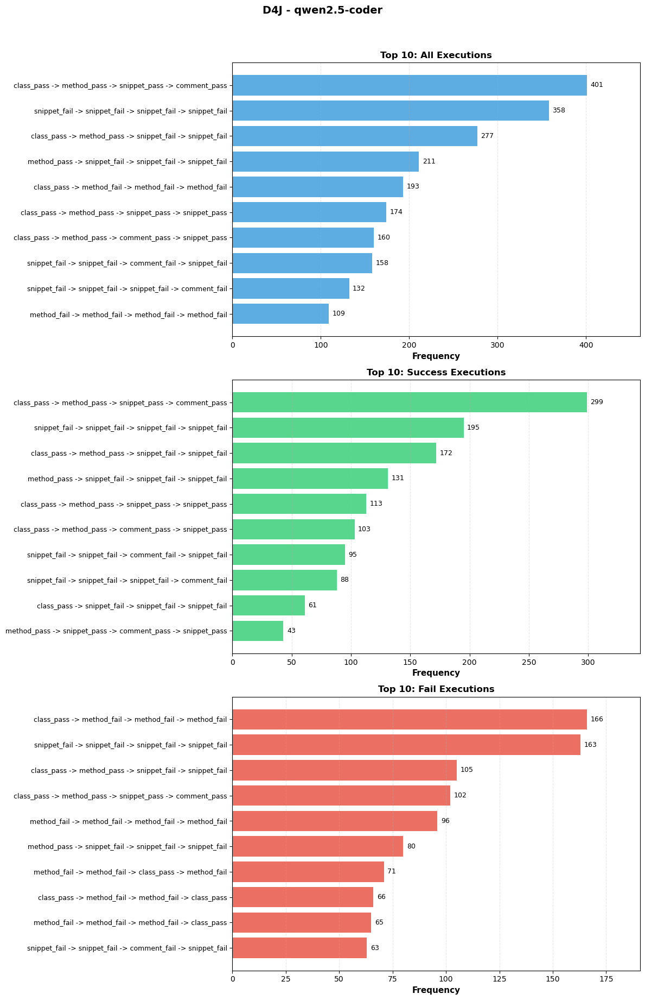


Benchmark: bip | Model: llama3


Total 4-grams collected: 2410

Total 4-grams from successful executions: 1152

Total 4-grams from failed executions: 1258

Benchmark: bip | Model: llama3.1


Total 4-grams collected: 6364

Total 4-grams from successful executions: 2662

Total 4-grams from failed executions: 3702

Benchmark: bip | Model: mistral-nemo


Total 4-grams collected: 1121

Total 4-grams from successful executions: 441

Total 4-grams from failed executions: 680

Benchmark: bip | Model: qwen2.5-coder


Total 4-grams collected: 854

Total 4-grams from successful executions: 370

Total 4-grams from failed executions: 484


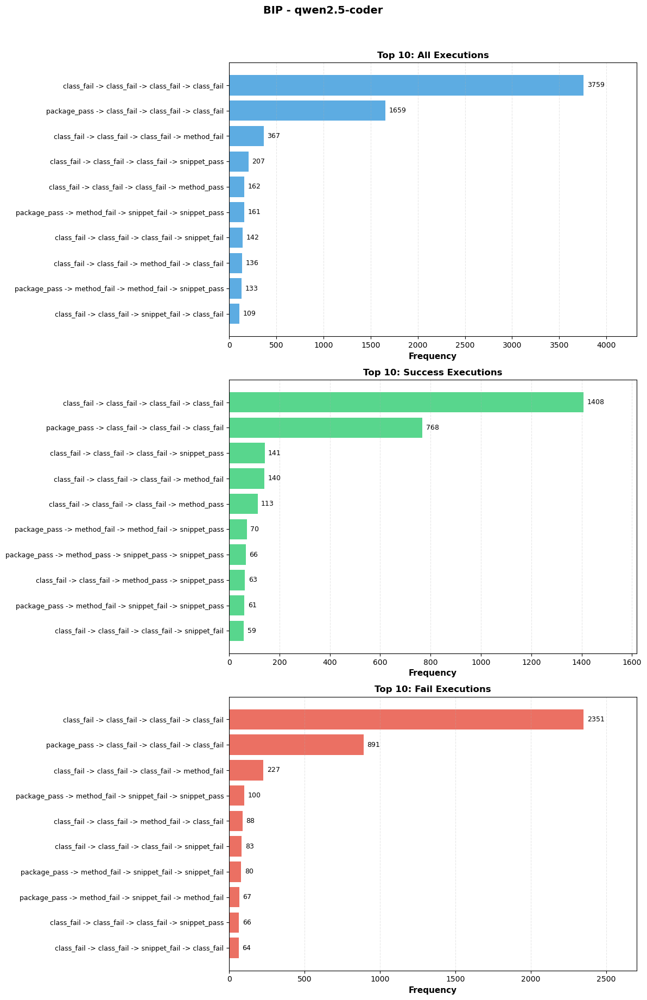

In [8]:
# Visualize Top 10 patterns separately for all/success/fail executions

import matplotlib.pyplot as plt
import numpy as np

# Function name mapping for readability
name_mapping = {
    'get_covered_packages_pass': 'package_pass',
    'get_failing_tests_covered_classes_pass': 'class_pass',
    'get_failing_tests_covered_methods_for_class_pass': 'method_pass',
    'get_code_snippet_pass': 'snippet_pass',
    'get_comments_pass': 'comment_pass',
    'get_covered_packages_fail': 'package_fail',
    'get_failing_tests_covered_classes_fail': 'class_fail',
    'get_failing_tests_covered_methods_for_class_fail': 'method_fail',
    'get_code_snippet_fail': 'snippet_fail',
    'get_comments_fail': 'comment_fail'
}

def shorten_pattern(pattern_tuple):
    """Convert long function names to short versions"""
    return ' -> '.join([name_mapping.get(func, func) for func in pattern_tuple])

# For each benchmark and model combination
n=4
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    all_ngrams, success_ngrams, fail_ngrams = [], [], []
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams_from_model, success_ngrams_from_model, fail_ngrams_from_model = get_ngrams_for_executions(bm, model, n)
        
        all_ngrams.extend(all_ngrams_from_model)
        success_ngrams.extend(success_ngrams_from_model)
        fail_ngrams.extend(fail_ngrams_from_model)
        
    all_counter = Counter(all_ngrams)
    success_counter = Counter(success_ngrams)
    fail_counter = Counter(fail_ngrams)
    
    # Get top 10 from each counter
    top_10_all = [(shorten_pattern(pattern), count) for pattern, count in all_counter.most_common(10)]
    top_10_success = [(shorten_pattern(pattern), count) for pattern, count in success_counter.most_common(10)]
    top_10_fail = [(shorten_pattern(pattern), count) for pattern, count in fail_counter.most_common(10)]
    
    # Create 3 subplots
    fig, axes = plt.subplots(3, 1, figsize=(12, 18))
    
    # Plot 1: All Executions
    patterns_all = [p[0] for p in top_10_all]
    counts_all = [p[1] for p in top_10_all]
    
    axes[0].barh(range(len(patterns_all)), counts_all, color='#3498db', alpha=0.8)
    axes[0].set_yticks(range(len(patterns_all)))
    axes[0].set_yticklabels(patterns_all, fontsize=9)
    axes[0].set_xlabel('Frequency', fontsize=11, fontweight='bold')
    axes[0].set_title('Top 10: All Executions', fontsize=12, fontweight='bold')
    axes[0].invert_yaxis()
    axes[0].grid(axis='x', alpha=0.3, linestyle='--')

    axes[0].set_xlim(0, max(counts_all)*1.15)
    
    # Add value labels
    for i, v in enumerate(counts_all):
        axes[0].text(v + max(counts_all)*0.01, i, str(v), va='center', fontsize=9)
    
    # Plot 2: Success Executions
    patterns_success = [p[0] for p in top_10_success]
    counts_success = [p[1] for p in top_10_success]
    
    axes[1].barh(range(len(patterns_success)), counts_success, color='#2ecc71', alpha=0.8)
    axes[1].set_yticks(range(len(patterns_success)))
    axes[1].set_yticklabels(patterns_success, fontsize=9)
    axes[1].set_xlabel('Frequency', fontsize=11, fontweight='bold')
    axes[1].set_title('Top 10: Success Executions', fontsize=12, fontweight='bold')
    axes[1].invert_yaxis()
    axes[1].grid(axis='x', alpha=0.3, linestyle='--')

    axes[1].set_xlim(0, max(counts_success)*1.15)
    
    # Add value labels
    for i, v in enumerate(counts_success):
        axes[1].text(v + max(counts_success)*0.01, i, str(v), va='center', fontsize=9)
    
    # Plot 3: Fail Executions
    patterns_fail = [p[0] for p in top_10_fail]
    counts_fail = [p[1] for p in top_10_fail]
    
    axes[2].barh(range(len(patterns_fail)), counts_fail, color='#e74c3c', alpha=0.8)
    axes[2].set_yticks(range(len(patterns_fail)))
    axes[2].set_yticklabels(patterns_fail, fontsize=9)
    axes[2].set_xlabel('Frequency', fontsize=11, fontweight='bold')
    axes[2].set_title('Top 10: Fail Executions', fontsize=12, fontweight='bold')
    axes[2].invert_yaxis()
    axes[2].grid(axis='x', alpha=0.3, linestyle='--')

    axes[2].set_xlim(0, max(counts_fail)*1.15)
    
    # Add value labels
    for i, v in enumerate(counts_fail):
        axes[2].text(v + max(counts_fail)*0.01, i, str(v), va='center', fontsize=9)
    
    # Overall title
    fig.suptitle(f'{bm.upper()} - {model}', fontsize=14, fontweight='bold', y=1.02)
    
    plt.tight_layout()
    plt.show()

In [9]:
n=4
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    all_ngrams, success_ngrams, fail_ngrams = [], [], []    
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams_from_model, success_ngrams_from_model, fail_ngrams_from_model = get_ngrams_for_executions(bm, model, n)
        
        all_ngrams.extend(all_ngrams_from_model)
        success_ngrams.extend(success_ngrams_from_model)
        fail_ngrams.extend(fail_ngrams_from_model)

    all_counter = Counter(all_ngrams)
    success_counter = Counter(success_ngrams)
    fail_counter = Counter(fail_ngrams)

    top_30_all = [pattern for pattern in all_counter.most_common(30)]
    
    correlation_data = []
    for pattern, freq in top_30_all:
        success_label = []
        ngram_presence = []
        for i in range(1, 11):
            for model in models:
                if bm == 'd4j':
                    directory_path = f'./raw_data/autofl/d4j_autofl_eol_{i}/{model}'
                elif bm == 'bip':
                    directory_path = f'./raw_data/autofl/bip_cosmosfl_{i}/{model}'
                
                for json_file in os.listdir(directory_path):
                    with open(os.path.join(directory_path, json_file), 'r') as f:
                        data = json.load(f)
                    if 'messages' in data:
                        sequence = extract_function_call_sequence(data['messages'])
                        ngrams = get_ngrams(sequence, n)
                        execution_success = get_result_of_execution(data["buggy_methods"])

                        if execution_success:
                            success_label.append(1)
                        else:
                            success_label.append(0)
                        if pattern in ngrams:
                            ngram_presence.append(1)
                        else:
                            ngram_presence.append(0)
        # print(success_label)
        # print(ngram_presence)
        correlation, p_value = pointbiserialr(success_label, ngram_presence)
        correlation_data.append({
            'pattern': pattern,
            'correlation': correlation,
            'p-value': p_value
        })

    correlation_df = pd.DataFrame(correlation_data)
    output_dir = f'./correlation/autofl/{n}-gram/{bm}'
    os.makedirs(output_dir, exist_ok=True)
    correlation_df.to_csv(os.path.join(output_dir, 'correlation_call_ok.csv'), index=False)
    print(f"Saved {os.path.join(output_dir, 'correlation_call_ok.csv')}")


Benchmark: d4j | Model: llama3


Total 4-grams collected: 1646

Total 4-grams from successful executions: 950

Total 4-grams from failed executions: 696

Benchmark: d4j | Model: llama3.1


Total 4-grams collected: 3898

Total 4-grams from successful executions: 1663

Total 4-grams from failed executions: 2235

Benchmark: d4j | Model: mistral-nemo


Total 4-grams collected: 753

Total 4-grams from successful executions: 330

Total 4-grams from failed executions: 423

Benchmark: d4j | Model: qwen2.5-coder


Total 4-grams collected: 957

Total 4-grams from successful executions: 503

Total 4-grams from failed executions: 454
Saved ./correlation/autofl/4-gram/d4j/correlation_call_ok.csv

Benchmark: bip | Model: llama3


Total 4-grams collected: 2410

Total 4-grams from successful executions: 1152

Total 4-grams from failed executions: 1258

Benchmark: bip | Model: llama3.1


Total 4-grams collected: 6364

Total 4-grams from successful executions: 2662

Total 4-grams from failed executions

### 3-gram

In [10]:
# Get n-gram: frequencies for all benchmarks and models
n = 3
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    all_ngrams, all_success_ngrams, all_fail_ngrams = [], [], []
    for model in models:
        all_ngrams_from_model, all_success_ngrams_from_model, all_fail_ngrams_from_model = get_ngrams_for_executions(bm, model, n)
        all_ngrams.extend(all_ngrams_from_model)
        all_success_ngrams.extend(all_success_ngrams_from_model)
        all_fail_ngrams.extend(all_fail_ngrams_from_model)

    all_counter = Counter(all_ngrams)
    success_counter = Counter(all_success_ngrams)
    fail_counter = Counter(all_fail_ngrams)

    all_results = []
    success_results = []
    fail_results = []
    for ngram, count in all_counter.most_common():
        all_results.append({
            f'{n}gram': ngram,
            'frequency': count
        })
    for ngram, count in success_counter.most_common():
        success_results.append({
            f'{n}gram': ngram,
            'frequency': count
        })
    for ngram, count in fail_counter.most_common():
        fail_results.append({
            f'{n}gram': ngram,
            'frequency': count
        })
        
    
    all_df = pd.DataFrame(all_results)
    success_df = pd.DataFrame(success_results)
    fail_df = pd.DataFrame(fail_results)

    output_dir = f"./{n}gram_frequency/autofl/all_executions"
    os.makedirs(output_dir, exist_ok=True)
    output_file = os.path.join(output_dir, f"{bm}_{n}gram_frequencies_call_ok.csv")
    all_df.to_csv(output_file, index=False)
    print(f"Saved {output_file} with {len(all_df)} unique {n}-gram")

    output_dir = f"./{n}gram_frequency/autofl/success_executions"
    os.makedirs(output_dir, exist_ok=True)
    output_file = os.path.join(output_dir, f"{bm}_{n}gram_frequencies_call_ok.csv")
    success_df.to_csv(output_file, index=False)
    print(f"Saved {output_file} with {len(success_df)} unique {n}-gram")

    output_dir = f"./{n}gram_frequency/autofl/fail_executions"
    os.makedirs(output_dir, exist_ok=True)
    output_file = os.path.join(output_dir, f"{bm}_{n}gram_frequencies_call_ok.csv")
    fail_df.to_csv(output_file, index=False)
    print(f"Saved {output_file} with {len(fail_df)} unique {n}-gram")


Total 3-grams collected: 2948

Total 3-grams from successful executions: 1609

Total 3-grams from failed executions: 1339

Total 3-grams collected: 5521

Total 3-grams from successful executions: 2497

Total 3-grams from failed executions: 3024

Total 3-grams collected: 1751

Total 3-grams from successful executions: 826

Total 3-grams from failed executions: 925

Total 3-grams collected: 1893

Total 3-grams from successful executions: 975

Total 3-grams from failed executions: 918
Saved ./3gram_frequency/autofl/all_executions/d4j_3gram_frequencies_call_ok.csv with 300 unique 3-gram
Saved ./3gram_frequency/autofl/success_executions/d4j_3gram_frequencies_call_ok.csv with 234 unique 3-gram
Saved ./3gram_frequency/autofl/fail_executions/d4j_3gram_frequencies_call_ok.csv with 282 unique 3-gram

Total 3-grams collected: 3286

Total 3-grams from successful executions: 1593

Total 3-grams from failed executions: 1693

Total 3-grams collected: 8137

Total 3-grams from successful executions: 3


Benchmark: d4j | Model: llama3


Total 3-grams collected: 2948

Total 3-grams from successful executions: 1609

Total 3-grams from failed executions: 1339

Benchmark: d4j | Model: llama3.1


Total 3-grams collected: 5521

Total 3-grams from successful executions: 2497

Total 3-grams from failed executions: 3024

Benchmark: d4j | Model: mistral-nemo


Total 3-grams collected: 1751

Total 3-grams from successful executions: 826

Total 3-grams from failed executions: 925

Benchmark: d4j | Model: qwen2.5-coder


Total 3-grams collected: 1893

Total 3-grams from successful executions: 975

Total 3-grams from failed executions: 918
                                     pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
   class_pass -> method_pass -> snippet_pass            1645                1021              624         62.1%      37.9%
snippet_fail -> snippet_fail -> snippet_fail             756                 433              323         57.3%      42

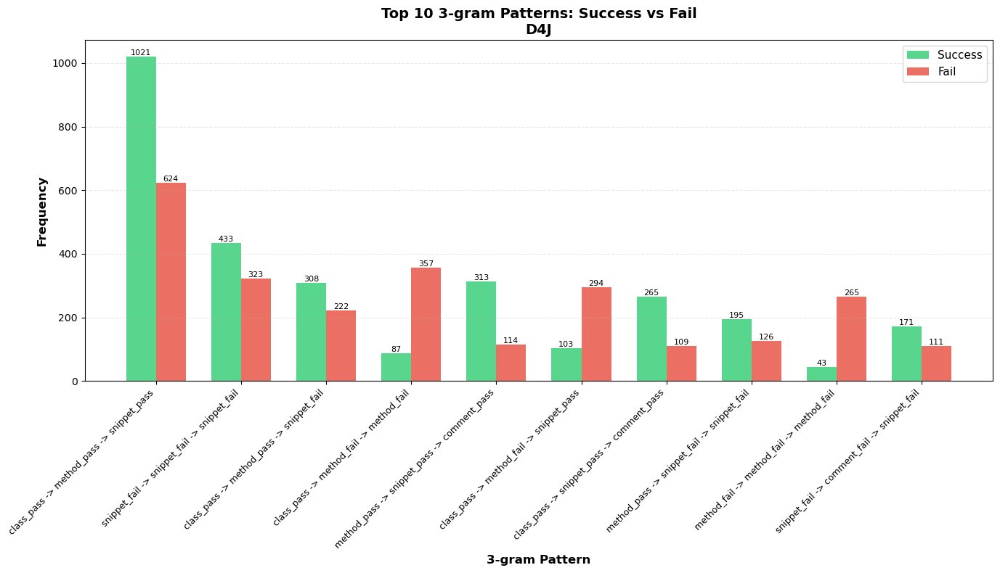


Benchmark: bip | Model: llama3


Total 3-grams collected: 3286

Total 3-grams from successful executions: 1593

Total 3-grams from failed executions: 1693

Benchmark: bip | Model: llama3.1


Total 3-grams collected: 8137

Total 3-grams from successful executions: 3597

Total 3-grams from failed executions: 4540

Benchmark: bip | Model: mistral-nemo


Total 3-grams collected: 3020

Total 3-grams from successful executions: 1384

Total 3-grams from failed executions: 1636

Benchmark: bip | Model: qwen2.5-coder


Total 3-grams collected: 2081

Total 3-grams from successful executions: 995

Total 3-grams from failed executions: 1086
                                    pattern  all_executions  success_executions  fail_executions success_ratio fail_ratio
     class_fail -> class_fail -> class_fail            5486                2201             3285         40.1%      59.9%
   package_pass -> class_fail -> class_fail            1981                 946             1035         47.8%      52

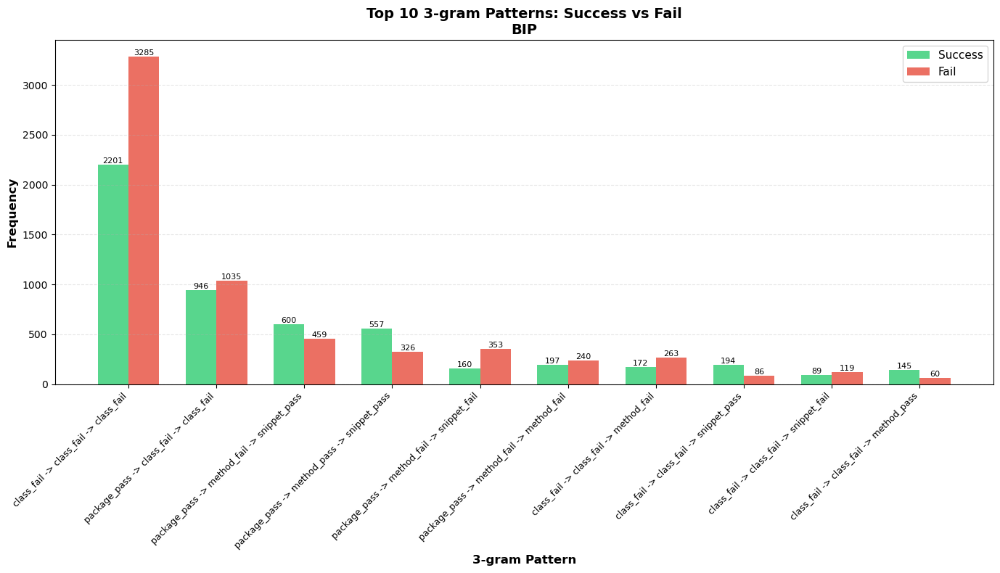

In [11]:
# Compare top 10 most frequent n-grams in all executions vs success/fail executions

import matplotlib.pyplot as plt
import numpy as np

# Function name mapping for readability
name_mapping = {
    'get_covered_packages_pass': 'package_pass',
    'get_failing_tests_covered_classes_pass': 'class_pass',
    'get_failing_tests_covered_methods_for_class_pass': 'method_pass',
    'get_code_snippet_pass': 'snippet_pass',
    'get_comments_pass': 'comment_pass',
    'get_covered_packages_fail': 'package_fail',
    'get_failing_tests_covered_classes_fail': 'class_fail',
    'get_failing_tests_covered_methods_for_class_fail': 'method_fail',
    'get_code_snippet_fail': 'snippet_fail',
    'get_comments_fail': 'comment_fail'
}

def shorten_pattern(pattern_tuple):
    """Convert long function names to short versions"""
    return ' -> '.join([name_mapping.get(func, func) for func in pattern_tuple])

# For each benchmark and model combination
n=3
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    all_ngrams, success_ngrams, fail_ngrams = [], [], []
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams_from_model, success_ngrams_from_model, fail_ngrams_from_model = get_ngrams_for_executions(bm, model, n)
        
        all_ngrams.extend(all_ngrams_from_model)
        success_ngrams.extend(success_ngrams_from_model)
        fail_ngrams.extend(fail_ngrams_from_model)

    all_counter = Counter(all_ngrams)
    success_counter = Counter(success_ngrams)
    fail_counter = Counter(fail_ngrams)
    
    # Get top 10 from all executions
    top_10_patterns = [pattern for pattern, count in all_counter.most_common(10)]
    
    # Create comparison table
    comparison_data = []
    for pattern in top_10_patterns:
        all_count = all_counter[pattern]
        success_count = success_counter[pattern]
        fail_count = fail_counter[pattern]
        
        comparison_data.append({
            'pattern': shorten_pattern(pattern),
            'all_executions': all_count,
            'success_executions': success_count,
            'fail_executions': fail_count,
            'success_ratio': f"{success_count/all_count*100:.1f}%" if all_count > 0 else "0%",
            'fail_ratio': f"{fail_count/all_count*100:.1f}%" if all_count > 0 else "0%"
        })
    
    # Display as DataFrame
    comparison_df = pd.DataFrame(comparison_data)
    print(comparison_df.to_string(index=False))
    print()
    
    # Create bar chart
    fig, ax = plt.subplots(figsize=(14, 8))
    
    patterns = comparison_df['pattern'].tolist()
    success_counts = comparison_df['success_executions'].tolist()
    fail_counts = comparison_df['fail_executions'].tolist()
    
    x = np.arange(len(patterns))
    width = 0.35
    
    bars1 = ax.bar(x - width/2, success_counts, width, label='Success', color='#2ecc71', alpha=0.8)
    bars2 = ax.bar(x + width/2, fail_counts, width, label='Fail', color='#e74c3c', alpha=0.8)
    
    ax.set_xlabel(f'{n}-gram Pattern', fontsize=12, fontweight='bold')
    ax.set_ylabel('Frequency', fontsize=12, fontweight='bold')
    ax.set_title(f'Top 10 {n}-gram Patterns: Success vs Fail\n{bm.upper()}', fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(patterns, rotation=45, ha='right', fontsize=9)
    ax.legend(fontsize=11)
    ax.grid(axis='y', alpha=0.3, linestyle='--')
    
    # Add value labels on bars
    for bars in [bars1, bars2]:
        for bar in bars:
            height = bar.get_height()
            if height > 0:
                ax.text(bar.get_x() + bar.get_width()/2., height,
                        f'{int(height)}',
                        ha='center', va='bottom', fontsize=8)
    
    plt.tight_layout()
    plt.show()


Benchmark: d4j | Model: llama3


Total 3-grams collected: 2948

Total 3-grams from successful executions: 1609

Total 3-grams from failed executions: 1339

Benchmark: d4j | Model: llama3.1


Total 3-grams collected: 5521

Total 3-grams from successful executions: 2497

Total 3-grams from failed executions: 3024

Benchmark: d4j | Model: mistral-nemo


Total 3-grams collected: 1751

Total 3-grams from successful executions: 826

Total 3-grams from failed executions: 925

Benchmark: d4j | Model: qwen2.5-coder


Total 3-grams collected: 1893

Total 3-grams from successful executions: 975

Total 3-grams from failed executions: 918


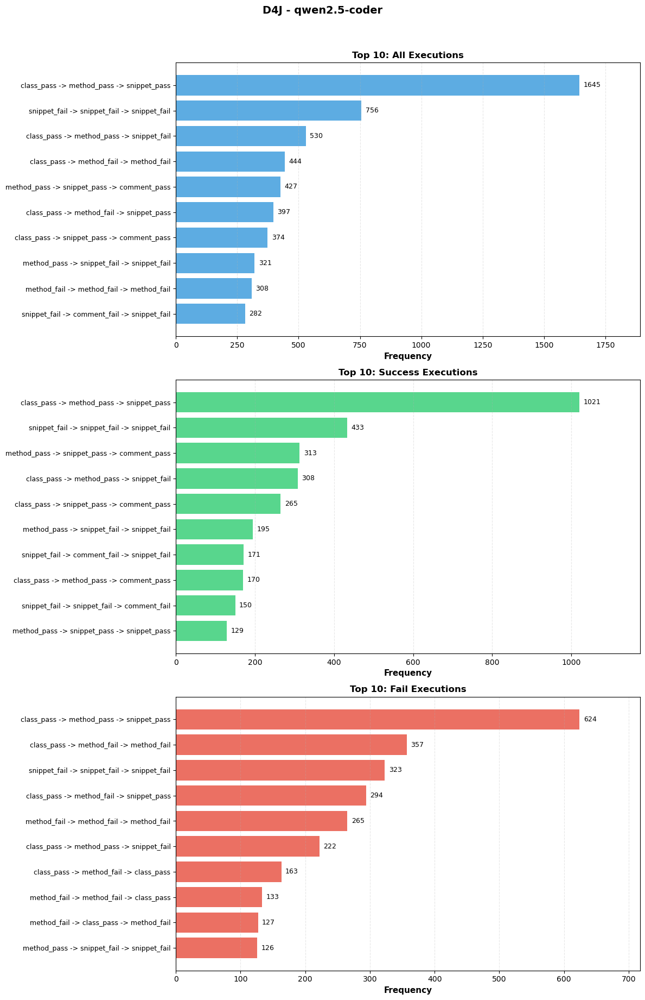


Benchmark: bip | Model: llama3


Total 3-grams collected: 3286

Total 3-grams from successful executions: 1593

Total 3-grams from failed executions: 1693

Benchmark: bip | Model: llama3.1


Total 3-grams collected: 8137

Total 3-grams from successful executions: 3597

Total 3-grams from failed executions: 4540

Benchmark: bip | Model: mistral-nemo


Total 3-grams collected: 3020

Total 3-grams from successful executions: 1384

Total 3-grams from failed executions: 1636

Benchmark: bip | Model: qwen2.5-coder


Total 3-grams collected: 2081

Total 3-grams from successful executions: 995

Total 3-grams from failed executions: 1086


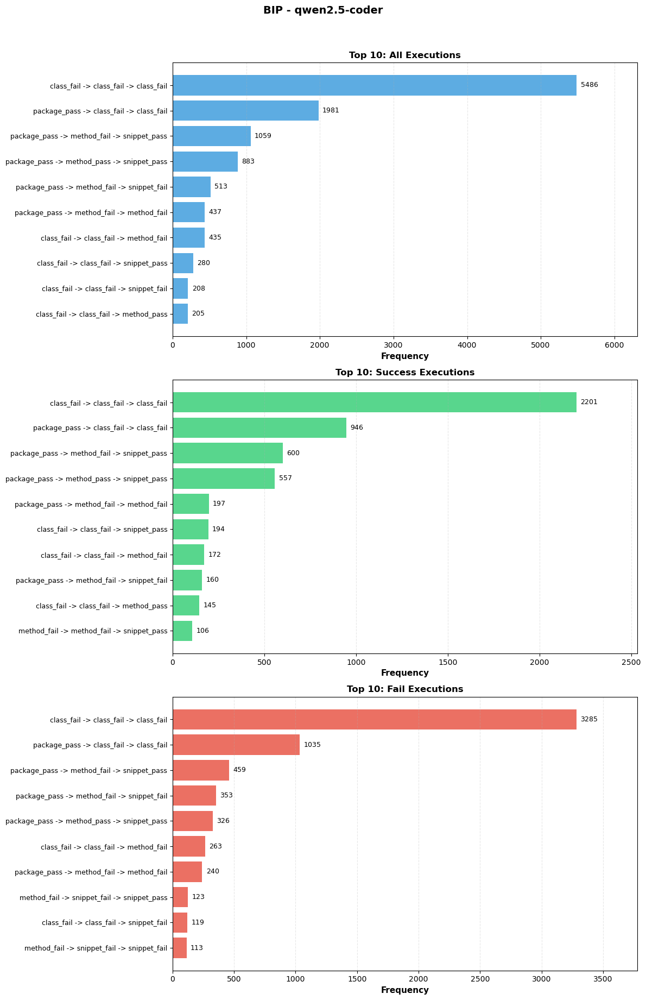

In [12]:
# Visualize Top 10 patterns separately for all/success/fail executions

import matplotlib.pyplot as plt
import numpy as np

# Function name mapping for readability
name_mapping = {
    'get_covered_packages_pass': 'package_pass',
    'get_failing_tests_covered_classes_pass': 'class_pass',
    'get_failing_tests_covered_methods_for_class_pass': 'method_pass',
    'get_code_snippet_pass': 'snippet_pass',
    'get_comments_pass': 'comment_pass',
    'get_covered_packages_fail': 'package_fail',
    'get_failing_tests_covered_classes_fail': 'class_fail',
    'get_failing_tests_covered_methods_for_class_fail': 'method_fail',
    'get_code_snippet_fail': 'snippet_fail',
    'get_comments_fail': 'comment_fail'
}

def shorten_pattern(pattern_tuple):
    """Convert long function names to short versions"""
    return ' -> '.join([name_mapping.get(func, func) for func in pattern_tuple])

# For each benchmark and model combination
n=3
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    all_ngrams, success_ngrams, fail_ngrams = [], [], []
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams_from_model, success_ngrams_from_model, fail_ngrams_from_model = get_ngrams_for_executions(bm, model, n)
        
        all_ngrams.extend(all_ngrams_from_model)
        success_ngrams.extend(success_ngrams_from_model)
        fail_ngrams.extend(fail_ngrams_from_model)
        
    all_counter = Counter(all_ngrams)
    success_counter = Counter(success_ngrams)
    fail_counter = Counter(fail_ngrams)
    
    # Get top 10 from each counter
    top_10_all = [(shorten_pattern(pattern), count) for pattern, count in all_counter.most_common(10)]
    top_10_success = [(shorten_pattern(pattern), count) for pattern, count in success_counter.most_common(10)]
    top_10_fail = [(shorten_pattern(pattern), count) for pattern, count in fail_counter.most_common(10)]
    
    # Create 3 subplots
    fig, axes = plt.subplots(3, 1, figsize=(12, 18))
    
    # Plot 1: All Executions
    patterns_all = [p[0] for p in top_10_all]
    counts_all = [p[1] for p in top_10_all]
    
    axes[0].barh(range(len(patterns_all)), counts_all, color='#3498db', alpha=0.8)
    axes[0].set_yticks(range(len(patterns_all)))
    axes[0].set_yticklabels(patterns_all, fontsize=9)
    axes[0].set_xlabel('Frequency', fontsize=11, fontweight='bold')
    axes[0].set_title('Top 10: All Executions', fontsize=12, fontweight='bold')
    axes[0].invert_yaxis()
    axes[0].grid(axis='x', alpha=0.3, linestyle='--')

    axes[0].set_xlim(0, max(counts_all)*1.15)
    
    # Add value labels
    for i, v in enumerate(counts_all):
        axes[0].text(v + max(counts_all)*0.01, i, str(v), va='center', fontsize=9)
    
    # Plot 2: Success Executions
    patterns_success = [p[0] for p in top_10_success]
    counts_success = [p[1] for p in top_10_success]
    
    axes[1].barh(range(len(patterns_success)), counts_success, color='#2ecc71', alpha=0.8)
    axes[1].set_yticks(range(len(patterns_success)))
    axes[1].set_yticklabels(patterns_success, fontsize=9)
    axes[1].set_xlabel('Frequency', fontsize=11, fontweight='bold')
    axes[1].set_title('Top 10: Success Executions', fontsize=12, fontweight='bold')
    axes[1].invert_yaxis()
    axes[1].grid(axis='x', alpha=0.3, linestyle='--')

    axes[1].set_xlim(0, max(counts_success)*1.15)
    
    # Add value labels
    for i, v in enumerate(counts_success):
        axes[1].text(v + max(counts_success)*0.01, i, str(v), va='center', fontsize=9)
    
    # Plot 3: Fail Executions
    patterns_fail = [p[0] for p in top_10_fail]
    counts_fail = [p[1] for p in top_10_fail]
    
    axes[2].barh(range(len(patterns_fail)), counts_fail, color='#e74c3c', alpha=0.8)
    axes[2].set_yticks(range(len(patterns_fail)))
    axes[2].set_yticklabels(patterns_fail, fontsize=9)
    axes[2].set_xlabel('Frequency', fontsize=11, fontweight='bold')
    axes[2].set_title('Top 10: Fail Executions', fontsize=12, fontweight='bold')
    axes[2].invert_yaxis()
    axes[2].grid(axis='x', alpha=0.3, linestyle='--')

    axes[2].set_xlim(0, max(counts_fail)*1.15)
    
    # Add value labels
    for i, v in enumerate(counts_fail):
        axes[2].text(v + max(counts_fail)*0.01, i, str(v), va='center', fontsize=9)
    
    # Overall title
    fig.suptitle(f'{bm.upper()} - {model}', fontsize=14, fontweight='bold', y=1.02)
    
    plt.tight_layout()
    plt.show()

In [13]:
n=3
benchmarks = ['d4j', 'bip']
models = ['llama3', 'llama3.1', 'mistral-nemo', 'qwen2.5-coder']

for bm in benchmarks:
    all_ngrams, success_ngrams, fail_ngrams = [], [], []    
    for model in models:
        print(f"\n{'='*100}")
        print(f"Benchmark: {bm} | Model: {model}")
        print(f"{'='*100}\n")
        
        # Load the three counters
        all_ngrams_from_model, success_ngrams_from_model, fail_ngrams_from_model = get_ngrams_for_executions(bm, model, n)
        
        all_ngrams.extend(all_ngrams_from_model)
        success_ngrams.extend(success_ngrams_from_model)
        fail_ngrams.extend(fail_ngrams_from_model)

    all_counter = Counter(all_ngrams)
    success_counter = Counter(success_ngrams)
    fail_counter = Counter(fail_ngrams)

    top_30_all = [pattern for pattern in all_counter.most_common(30)]
    
    correlation_data = []
    for pattern, freq in top_30_all:
        success_label = []
        ngram_presence = []
        for i in range(1, 11):
            for model in models:
                if bm == 'd4j':
                    directory_path = f'./raw_data/autofl/d4j_autofl_eol_{i}/{model}'
                elif bm == 'bip':
                    directory_path = f'./raw_data/autofl/bip_cosmosfl_{i}/{model}'
                
                for json_file in os.listdir(directory_path):
                    with open(os.path.join(directory_path, json_file), 'r') as f:
                        data = json.load(f)
                    if 'messages' in data:
                        sequence = extract_function_call_sequence(data['messages'])
                        ngrams = get_ngrams(sequence, n)
                        execution_success = get_result_of_execution(data["buggy_methods"])

                        if execution_success:
                            success_label.append(1)
                        else:
                            success_label.append(0)
                        if pattern in ngrams:
                            ngram_presence.append(1)
                        else:
                            ngram_presence.append(0)
        # print(success_label)
        # print(ngram_presence)
        correlation, p_value = pointbiserialr(success_label, ngram_presence)
        correlation_data.append({
            'pattern': pattern,
            'correlation': correlation,
            'p-value': p_value
        })

    correlation_df = pd.DataFrame(correlation_data)
    output_dir = f'./correlation/autofl/{n}-gram/{bm}'
    os.makedirs(output_dir, exist_ok=True)
    correlation_df.to_csv(os.path.join(output_dir, 'correlation_call_ok.csv'), index=False)
    print(f"Saved {os.path.join(output_dir, 'correlation_call_ok.csv')}")


Benchmark: d4j | Model: llama3


Total 3-grams collected: 2948

Total 3-grams from successful executions: 1609

Total 3-grams from failed executions: 1339

Benchmark: d4j | Model: llama3.1


Total 3-grams collected: 5521

Total 3-grams from successful executions: 2497

Total 3-grams from failed executions: 3024

Benchmark: d4j | Model: mistral-nemo


Total 3-grams collected: 1751

Total 3-grams from successful executions: 826

Total 3-grams from failed executions: 925

Benchmark: d4j | Model: qwen2.5-coder


Total 3-grams collected: 1893

Total 3-grams from successful executions: 975

Total 3-grams from failed executions: 918
Saved ./correlation/autofl/3-gram/d4j/correlation_call_ok.csv

Benchmark: bip | Model: llama3


Total 3-grams collected: 3286

Total 3-grams from successful executions: 1593

Total 3-grams from failed executions: 1693

Benchmark: bip | Model: llama3.1


Total 3-grams collected: 8137

Total 3-grams from successful executions: 3597

Total 3-grams from failed execut